In [2]:
import scanpy as sc
import loompy as lm
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
adata = sc.read_h5ad("adata-preF.h5ad")
adata

/home/rzh/BCY/lib/python3.10/site-packages/setuptools_scm/_integration/setuptools.py:30: RuntimeWarning: 
ERROR: setuptools==59.6.0 is used in combination with setuptools_scm>=8.x

Your build configuration is incomplete and previously worked by accident!
setuptools_scm requires setuptools>=61

Suggested workaround if applicable:
 - migrating from the deprecated setup_requires mechanism to pep517/518
   and using a pyproject.toml to declare build dependencies
   which are reliably pre-installed before running the build tools

  warnings.warn(
/home/rzh/BCY/lib/python3.10/site-packages/loompy/bus_file.py:68: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def twobit_to_dna(twob

AnnData object with n_obs × n_vars = 178891 × 41733
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'majorType-fix'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'CellphoneDB', 'batch_colors', 'dendrogram_leiden', 'epi-subtype_colors', 'gender_colors', 'hvg', 'leiden', 'leiden-harmony-female_colors', 'leiden_colors', 'leiden_harmony_colors', 'log1p', 'majorType-Female_colors', 'majorType-fix_colors', 'major_type_colors', 'major_type_harmony_colors', 'minor-type_colors', 'minor_type_colors', 'molecular_type_colors', 'neigh

In [43]:
import matplotlib as mpl
mpl.rcParams['font.family'] = 'Arial'

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


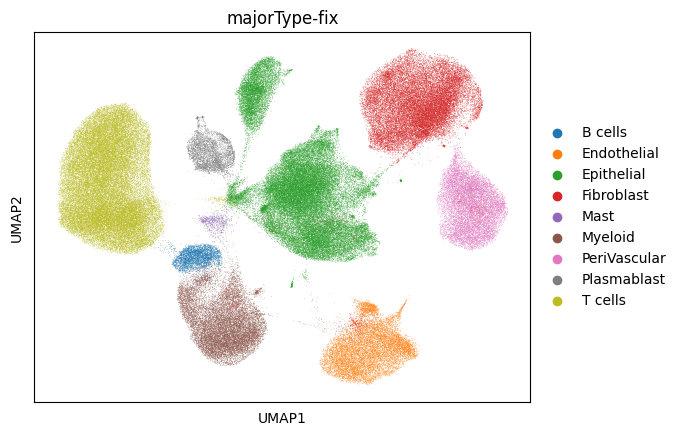

In [3]:
sc.pl.umap(adata, color=['majorType-fix'])

In [65]:
#find the best params
def clu(adata, key_added="majorType-fix", n_neighbors=50, n_pcs=30, rep='X_pca_harmony', do_har=False, max_iter=20, do_scrublet=False, har_key='batch', resolution=1):
    # Computing the neighborhood graph
    if do_scrublet:
        n0 = adata.shape[0]
        print("{0} Cell number: {1}".format(key_added, n0))
        sc.external.pp.scrublet(adata)
        adata = adata[adata.obs['predicted_doublet']==False,:].copy()
        print("{0} Cells retained after scrublet, {1} cells reomved.".format(adata.shape[0], n0-adata.shape[0]))
    else:
        print("Ignoring processing doublet cells...")
    if do_har and len(adata.obs[har_key].cat.categories) > 1:
        sc.external.pp.harmony_integrate(adata, key=har_key,max_iter_harmony=max_iter)
        sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=n_pcs, use_rep=rep)
    else:
        print("Evaluating neighbors only...")
        sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=n_pcs, use_rep=rep)
    # Run UMAP
    sc.tl.umap(adata)
    sc.tl.leiden(adata, resolution=resolution, key_added=key_added)
    sc.pl.umap(adata, color=key_added, legend_fontoutline=True, palette=sc.pl.palettes.default_20, legend_loc="on data")
    return adata

Ignoring processing doublet cells...
Evaluating neighbors only...


/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


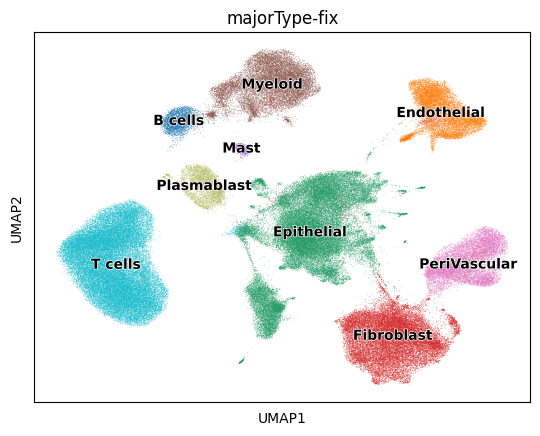

In [9]:
# n_neighbors=50, n_pcs=30
adata = clu(adata, n_neighbors=50, n_pcs=30)

Ignoring processing doublet cells...
Evaluating neighbors only...


/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


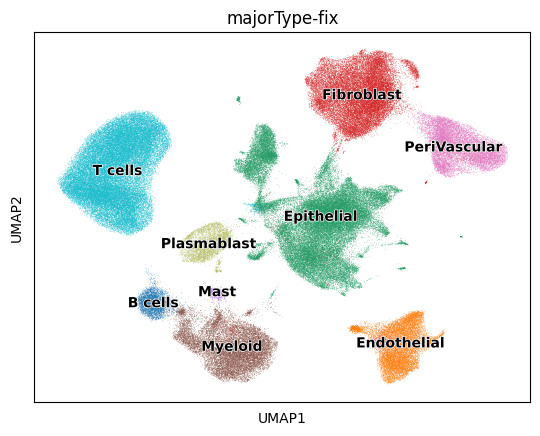

In [10]:
# n_neighbors=50, n_pcs=25
adata = clu(adata, n_neighbors=50, n_pcs=25)

Ignoring processing doublet cells...
Evaluating neighbors only...


/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


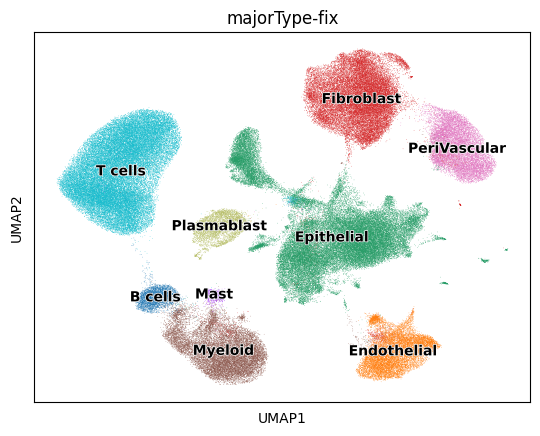

In [11]:
# n_neighbors=50, n_pcs=20
adata = clu(adata, n_neighbors=50, n_pcs=20)

Ignoring processing doublet cells...
Evaluating neighbors only...


/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


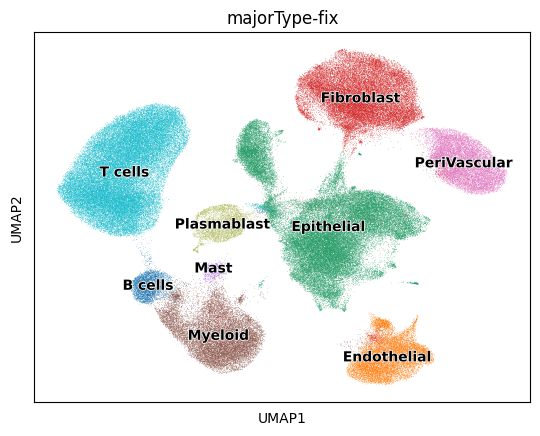

In [12]:
# n_neighbors=50, n_pcs=15
adata = clu(adata, n_neighbors=50, n_pcs=15)

Ignoring processing doublet cells...
Evaluating neighbors only...


/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


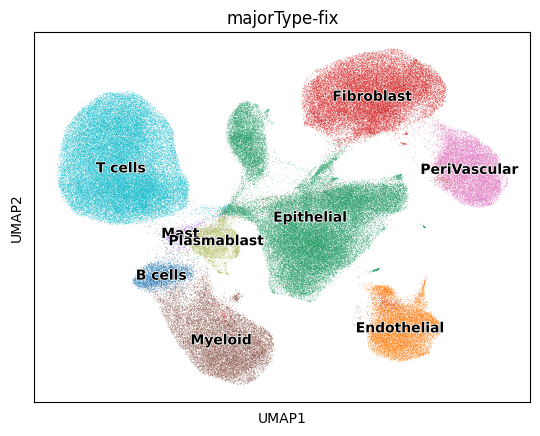

In [15]:
# n_neighbors=50, n_pcs=10
adata = clu(adata, n_neighbors=50, n_pcs=10)

Ignoring processing doublet cells...
Evaluating neighbors only...


/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


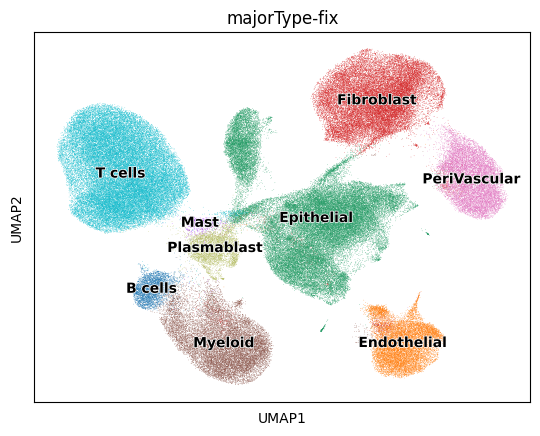

In [16]:
# n_neighbors=50, n_pcs=10
adata = clu(adata, n_neighbors=50, n_pcs=12)

Ignoring processing doublet cells...
Evaluating neighbors only...


/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


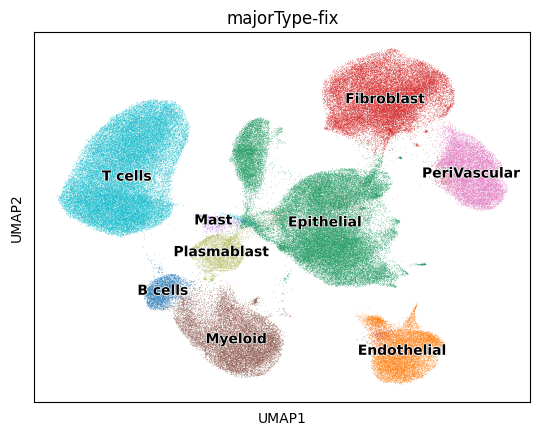

In [17]:
# n_neighbors=50, n_pcs=10
adata = clu(adata, n_neighbors=50, n_pcs=13)

Ignoring processing doublet cells...
Evaluating neighbors only...


/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


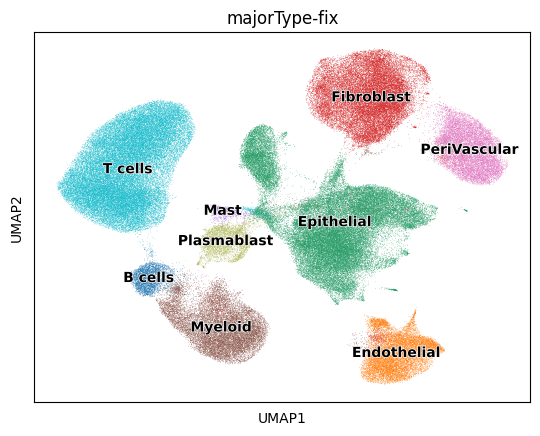

In [18]:
# n_neighbors=50, n_pcs=10
adata = clu(adata, n_neighbors=50, n_pcs=14)

Ignoring processing doublet cells...
Evaluating neighbors only...


/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


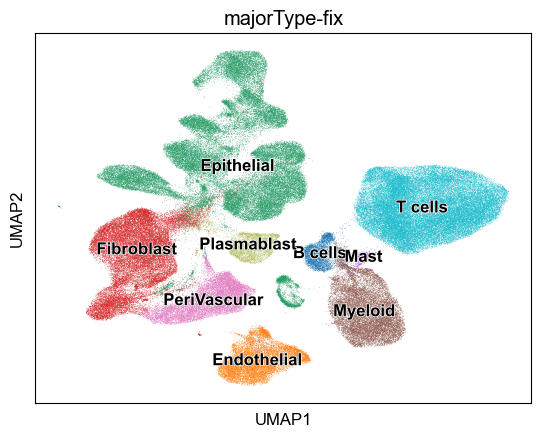

In [73]:
adata = clu(adata, n_neighbors=50, n_pcs=14, rep='X_pca')

In [344]:
adata_epi_cnv1.write_h5ad("adata-epi-cnv1.h5ad")

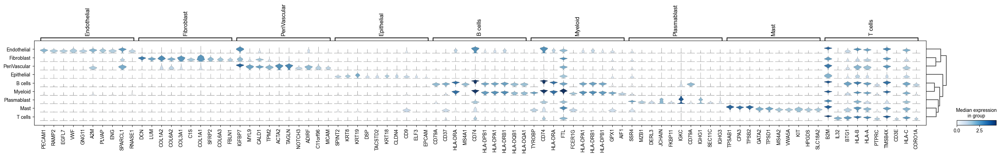

In [79]:
sc.tl.rank_genes_groups(adata, groupby='majorType-fix',method='wilcoxon')
sc.tl.dendrogram(adata, groupby='majorType-fix')
sc.pl.rank_genes_groups_stacked_violin(adata, groupby='majorType-fix')

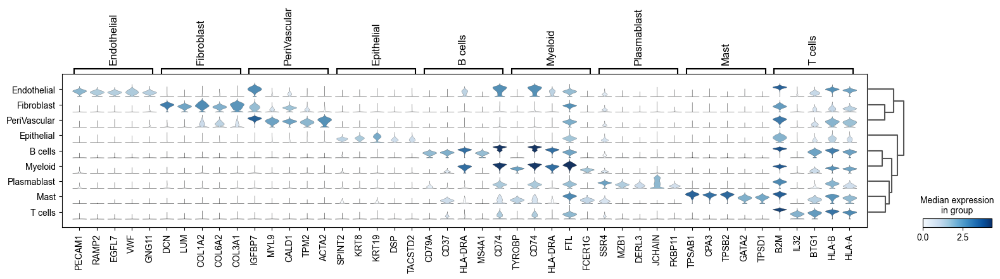

In [81]:
sc.pl.rank_genes_groups_stacked_violin(adata, groupby='majorType-fix', n_genes=5, save='stack_violin.svg')

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


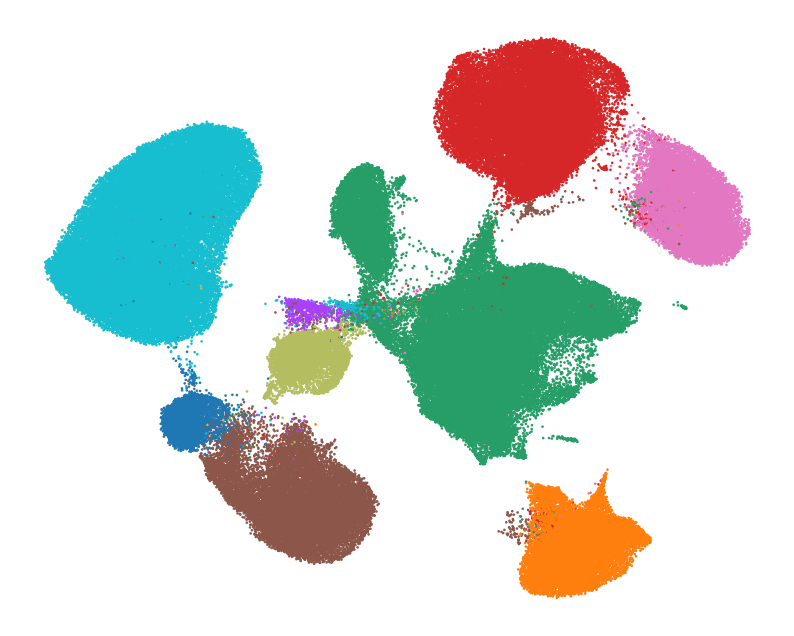

In [41]:
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
sc.pl.umap(adata, color='majorType-fix',size=14, ax=ax, title='',show=False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel("")
ax.set_ylabel("")
ax.legend().set_visible(False)
fig.savefig("figure-11.1/1b.png", dpi=400)

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


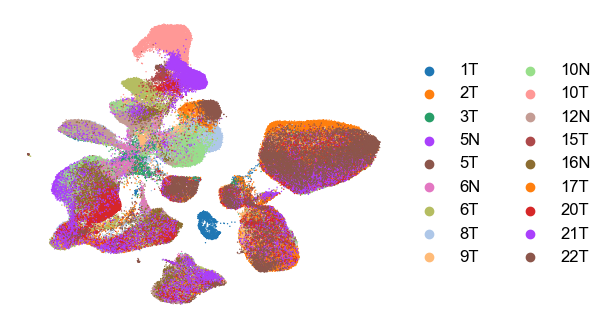

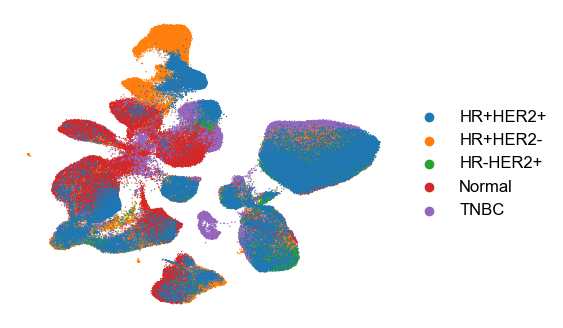

In [75]:

for gene in ['batch', 'IHC']:
  fig, ax = plt.subplots(1, 1, figsize=(5, 4))
  sc.pl.umap(adata, color=gene,size=4, ax=ax, title='',show=False)
  ax.spines['right'].set_visible(False)
  ax.spines['top'].set_visible(False)
  ax.spines['left'].set_visible(False)
  ax.spines['bottom'].set_visible(False)
  ax.set_xlabel("")
  ax.set_ylabel("")
  # ax.legend(  handletextpad=0.5, frameon=False,
  #                     borderpad=0.6,
  #                     columnspacing=1.3,
  #                     handlelength=0.65, fontsize=12)
  fig.savefig(f"figure-11.1/1c-{gene}.png", dpi=400, bbox_inches='tight')

In [82]:
adata.write_h5ad("adata-preF-pcs14-nohar.h5ad")

In [188]:
adata.obs['IHC'] = list(adata.obs['molecular_type'])
adata.obs['IHC'].loc[adata.obs['IHC'] == 'HER2'] = 'HR-HER2+'
adata.obs['IHC'].loc[adata.obs['IHC'] == 'LumB-HER2'] = 'HR+HER2+'
adata.obs['IHC'].loc[adata.obs['IHC'] == 'Luminal B'] = 'HR+HER2-'

/tmp/ipykernel_2237227/3526148939.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['IHC'].loc[adata.obs['IHC'] == 'HER2'] = 'HR-HER2+'
/tmp/ipykernel_2237227/3526148939.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['IHC'].loc[adata.obs['IHC'] == 'LumB-HER2'] = 'HR+HER2+'
/tmp/ipykernel_2237227/3526148939.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['IHC'].loc[adata.obs['IHC'] == 'Luminal B'

In [1]:
import matplotlib.pyplot as plt
from matplotlib import ticker
plt.rcParams["font.sans-serif"] = ["Arial"]
plt.rcParams["axes.unicode_minus"] = False
plt.rcParams["font.size"] = 12
import networkx as nx

In [4]:
adata_epi = adata[adata.obs['majorType-fix'] == "Epithelial", :]
adata_epi

View of AnnData object with n_obs × n_vars = 53019 × 41733
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'majorType-fix'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'dendrogram_leiden', 'gender_colors', 'hvg', 'leiden', 'leiden-harmony-female_colors', 'leiden_colors', 'leiden_harmony_colors', 'log1p', 'majorType-Female_colors', 'majorType-fix_colors', 'major_type_colors', 'major_type_harmony_colors', 'minor-type_colors', 'minor_type_colors', 'molecular_type_colors', 'neighbors', 'pca', 'rank_genes_grou

In [67]:
adata.obs['molecular_type'] = list(adata.obs['molecular_type'])
adata.obs.loc[adata.obs['batch'].isin(["20T", '21T', '22T']),'molecular_type'] = 'LumB-HER2'
adata.obs.loc[adata.obs['batch'].isin(['17T']),'molecular_type'] = 'HER2'

In [392]:
adata.write_h5ad("adata-preF.h5ad")

... storing 'batch' as categorical
... storing 'molecular_type' as categorical


In [4]:
adata_Fepi = sc.read_h5ad("adata-Fepi1.h5ad")
adata_Fepi

AnnData object with n_obs × n_vars = 53019 × 39735
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'leiden-epi-harmony', 'cnv_status', 'cnv_score', 'epi-subtype', 'cnv_leiden'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'symbol', 'ensg', 'chromosome', 'start', 'end'
    uns: 'batch_colors', 'cnv', 'cnv_neighbors', 'cnv_status_colors', 'dendrogram_leiden', 'epi-subtype_colors', 'gender_colors', 'hvg', 'leiden', 'leiden-epi-harmony_colors', 'leiden-harmony-female_colors', 'leiden_colors', 'leiden_harmony_colors', 'log1p', 'majorType-Female_colo

In [351]:
adata_Fepi = adata_Fepi[adata_Fepi.obs['batch'].isin(['10N', '10T', '12N', '15T', '16N', '17T', '1T', '20T', '21T',
       '22T', '2T', '3T', '5N', '5T', '6N', '6T', '8T', '9T']), :]
adata_Fepi.obs['molecular_type'] = list(adata_Fepi.obs['molecular_type'])
adata_Fepi.obs.loc[adata_Fepi.obs['batch'].isin(["20T", '21T', '22T']),'molecular_type'] = 'LumB-HER2'
adata_Fepi.obs.loc[adata_Fepi.obs['batch'].isin(['17T']),'molecular_type'] = 'HER2'
adata_Fepi.write_h5ad(f'adata-Fepi1.h5ad')
adata_Fepi

/tmp/ipykernel_724992/928417389.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_Fepi.obs['molecular_type'] = list(adata_Fepi.obs['molecular_type'])


... storing 'molecular_type' as categorical


AnnData object with n_obs × n_vars = 53019 × 41733
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'leiden-epi-harmony', 'cnv_status', 'cnv_score', 'epi-subtype'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'cnv_status_colors', 'dendrogram_leiden', 'epi-subtype_colors', 'gender_colors', 'hvg', 'leiden', 'leiden-epi-harmony_colors', 'leiden-harmony-female_colors', 'leiden_colors', 'leiden_harmony_colors', 'log1p', 'majorType-Female_colors', 'major_type_colors', 'major_type_harmony_colors', 'minor-type_colors', 'minor_typ

In [191]:
adata_Fepi = adata

In [5]:
import infercnvpy as cnv 

In [192]:
chrom = pd.read_csv("gene_pos.txt", sep='\t', header=None)
chrom.columns = ["symbol", "ensg", "chromosome", "start", "end"]
chrom.index = chrom['symbol']
chrom['ensg'] = [name.split('.')[0] for name in chrom['ensg']]
chrom_ensg = chrom.copy()
chrom_ensg.index = chrom_ensg['ensg']
var_names = list(adata_Fepi.var_names[adata_Fepi.var_names.isin(chrom['symbol']) + adata_Fepi.var_names.isin(chrom['ensg'])])
adata_epi_var = adata_Fepi[:, var_names]
for i in range(len(var_names)):
    name = var_names[i]
    if name in chrom_ensg['ensg']:
        var_names[i] = chrom_ensg['symbol'][name]
adata_epi_var.var_names = var_names
chrom_var_names = chrom.loc[var_names, :]
adata_epi_cnv = adata_Fepi[:, adata_Fepi.var_names.isin(chrom['symbol']) + adata_Fepi.var_names.isin(chrom['ensg'])]
adata_epi_cnv.var_names = var_names
adata_epi_cnv.var = pd.concat([adata_epi_var.var, chrom_var_names], axis=1)
adata_epi_cnv.var_names_make_unique()

  0%|          | 0/36 [00:00<?, ?it/s]

... storing 'IHC' as categorical


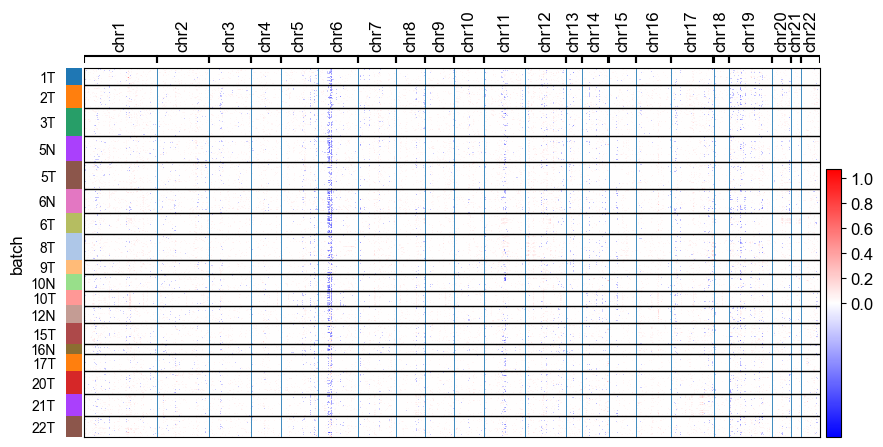

In [193]:
import infercnvpy as cnv 
cnv.tl.infercnv(adata_epi_cnv,reference_key="majorType-fix", reference_cat=['B cells', 'T cells', 'Endothelial'])
cnv.pl.chromosome_heatmap(adata_epi_cnv, groupby='batch', figsize=(10, 5))

... storing 'IHC' as categorical


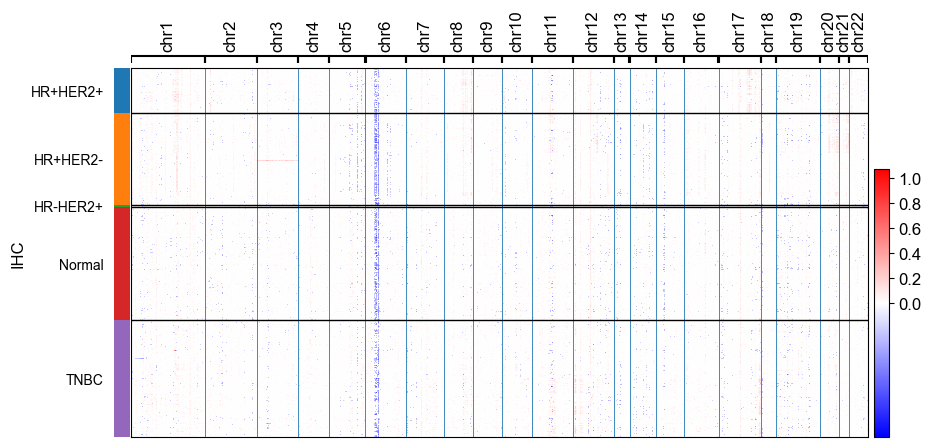

In [198]:
adata_epi_cnv = adata_epi_cnv[adata_epi_cnv.obs['majorType-fix']=='Epithelial']
adata_epi_vs = adata_epi_cnv[adata_epi_cnv.obs['batch'].isin(['5N', '5T', '6N', '6T', '10N', '10T'])]
cnv.pl.chromosome_heatmap(adata_epi_cnv, groupby='IHC', figsize=(10, 5), save='compare_cnv_heatmapIHC.svg')

In [169]:

adata_epi_tumor = adata_epi_cnv[adata_epi_cnv.obs['molecular_type'] != 'Normal']

/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/home/rzh/BCY/lib/python3.10/site-packages/infercnvpy/tl/__init__.py:73: ImplicitModificationWarning: Setting element `.obsm['X_cnv_pca']` of view, initializing view as actual.
  adata.obsm[f"X_{key_added}"] = pca_res
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


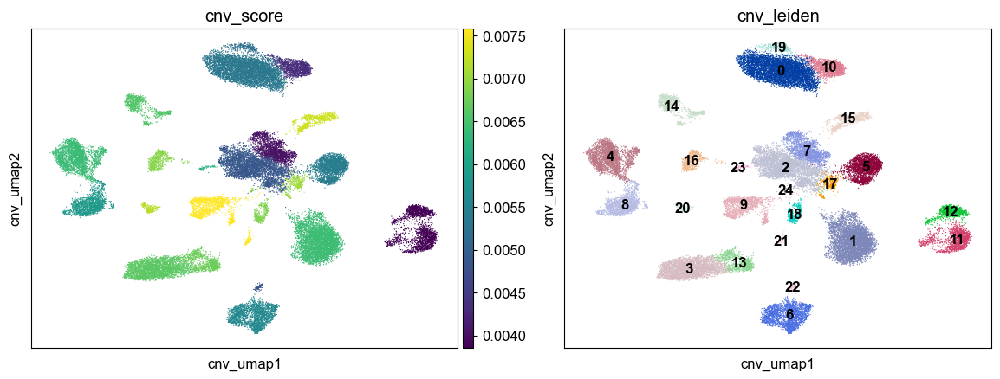

In [172]:
cnv.tl.pca(adata_epi_tumor) 
cnv.pp.neighbors(adata_epi_tumor) 
cnv.tl.leiden(adata_epi_tumor)
cnv.tl.umap(adata_epi_tumor) 
cnv.tl.cnv_score(adata_epi_tumor)
cnv.pl.umap(adata_epi_tumor, color=['cnv_score', 'cnv_leiden'], legend_loc='on data')

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


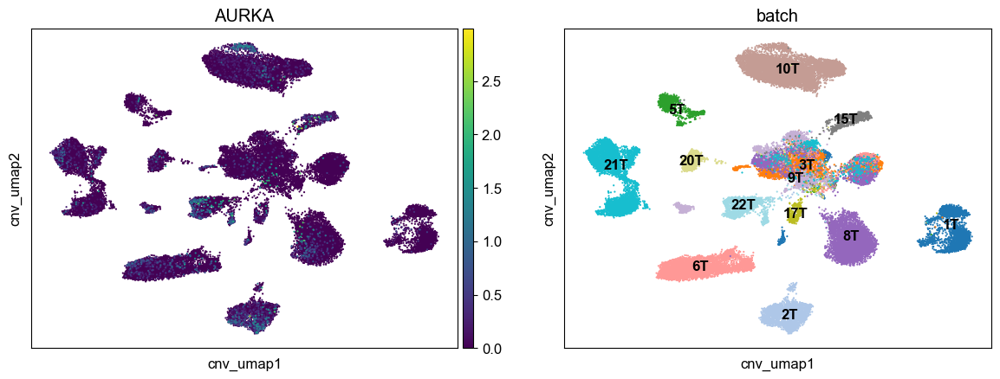

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


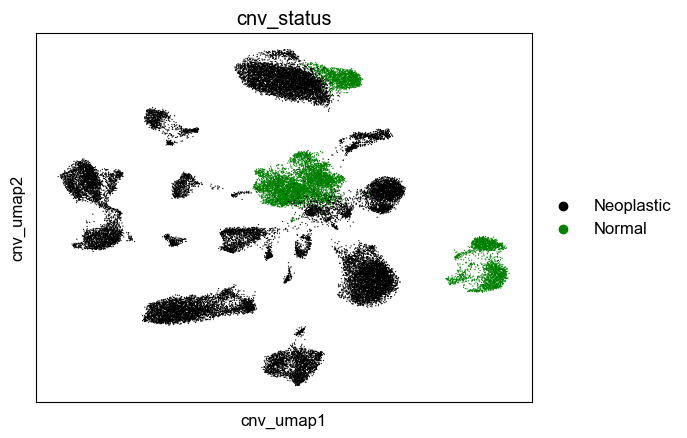

In [303]:
cnv.pl.umap(adata_epi_tumor, color=['AURKA', 'batch'], legend_loc='on data', size=10)
cnv.pl.umap(adata_epi_tumor, color=['cnv_status'])

/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
... storing 'IHC' as categorical
/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  df[key] = c
... storing 'symbol' as categorical
/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  df[key] = c
... storing 'ensg' as categorical
/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  df[key] = c
... storing 'chromosome' as categorical


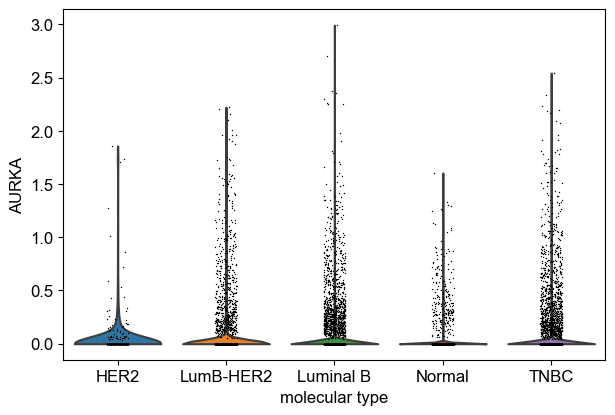

In [306]:
sc.pl.violin(adata_epi_cnv, keys=['AURKA'], groupby='molecular_type')

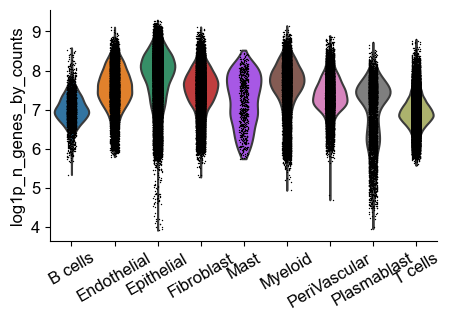

In [320]:
fig, ax = plt.subplots(1, 1, figsize=(5, 3))
sc.pl.violin(adata, keys=['log1p_n_genes_by_counts'], groupby='majorType-fix', ax=ax, title='',show=False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_xlabel("")
ax.set_xticklabels(adata.obs['majorType-fix'].cat.categories, rotation=30)
# ax.legend(  handletextpad=0.5, frameon=False,
#                     borderpad=0.6,
#                     columnspacing=1.3,
#                     handlelength=0.65, fontsize=12)
fig.savefig(f"figure-11.1/S1b-count.svg", dpi=400, bbox_inches='tight')

In [307]:
adata

AnnData object with n_obs × n_vars = 178891 × 41733
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'majorType-fix', 'IHC'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'CellphoneDB', 'batch_colors', 'dendrogram_leiden', 'epi-subtype_colors', 'gender_colors', 'hvg', 'leiden', 'leiden-harmony-female_colors', 'leiden_colors', 'leiden_harmony_colors', 'log1p', 'majorType-Female_colors', 'majorType-fix_colors', 'major_type_colors', 'major_type_harmony_colors', 'minor-type_colors', 'minor_type_colors', 'molecular_type_colors',

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


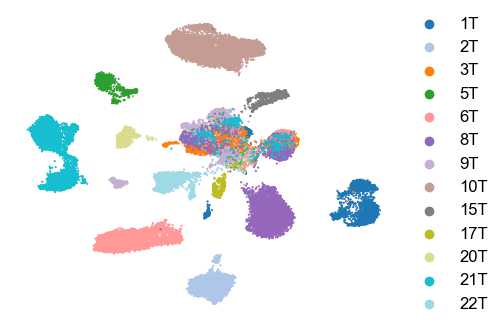

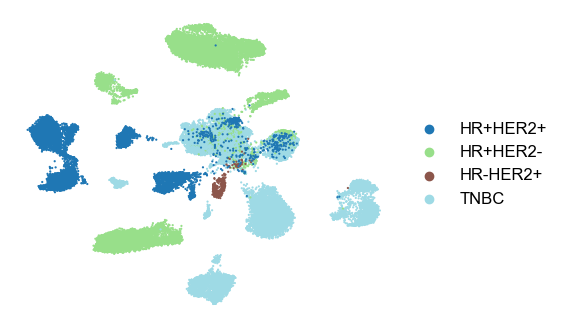

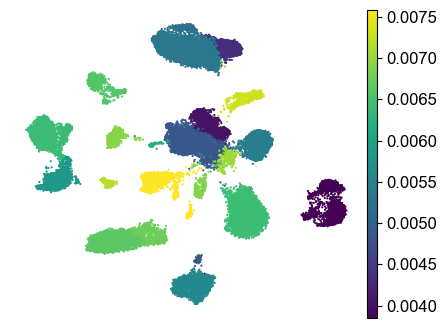

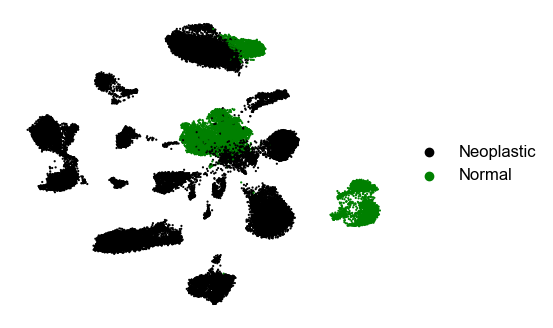

In [180]:
for gene in ['batch', 'IHC', 'cnv_score', 'cnv_status']:
  fig, ax = plt.subplots(1, 1, figsize=(5, 4))
  cnv.pl.umap(adata_epi_tumor, color=gene,size=10, ax=ax, title='',show=False)
  ax.spines['right'].set_visible(False)
  ax.spines['top'].set_visible(False)
  ax.spines['left'].set_visible(False)
  ax.spines['bottom'].set_visible(False)
  ax.set_xlabel("")
  ax.set_ylabel("")
  # ax.legend(  handletextpad=0.5, frameon=False,
  #                     borderpad=0.6,
  #                     columnspacing=1.3,
  #                     handlelength=0.65, fontsize=12)
  fig.savefig(f"figure-11.1/1e-{gene}.png", dpi=400, bbox_inches='tight')

In [196]:
adata_epi_norm = adata_epi_cnv[adata_epi_cnv.obs['IHC']=='Normal']

2024-11-30 05:57:49,478 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...


Ignoring processing doublet cells...


2024-11-30 05:57:56,416 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2024-11-30 05:57:56,490 - harmonypy - INFO - Iteration 1 of 20
INFO:harmonypy:Iteration 1 of 20
2024-11-30 05:57:59,988 - harmonypy - INFO - Iteration 2 of 20
INFO:harmonypy:Iteration 2 of 20
2024-11-30 05:58:03,465 - harmonypy - INFO - Iteration 3 of 20
INFO:harmonypy:Iteration 3 of 20
2024-11-30 05:58:06,891 - harmonypy - INFO - Converged after 3 iterations
INFO:harmonypy:Converged after 3 iterations
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/external/pp/_harmony_integrate.py:84: ImplicitModificationWarning: Setting element `.obsm['X_pca_harmony']` of view, initializing view as actual.
  adata.obsm[adjusted_basis] = harmony_out.Z_corr.T
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


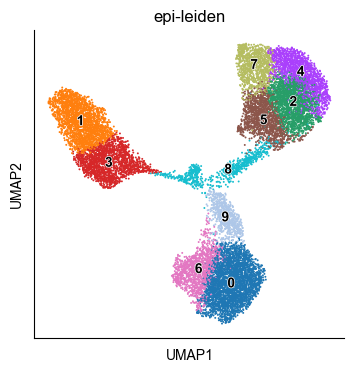

In [197]:
adata_epi_norm = clu(adata_epi_norm, 'epi-leiden', n_pcs=30, do_har=True)

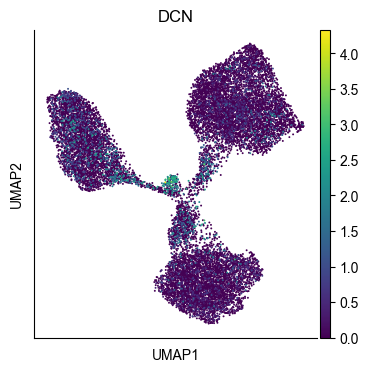

In [195]:
sc.pl.umap(adata_epi_norm, color='DCN', cmap='viridis')

2024-11-09 08:06:57,121 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...


Ignoring processing doublet cells...


2024-11-09 08:07:21,790 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2024-11-09 08:07:21,982 - harmonypy - INFO - Iteration 1 of 20
INFO:harmonypy:Iteration 1 of 20
2024-11-09 08:07:28,166 - harmonypy - INFO - Iteration 2 of 20
INFO:harmonypy:Iteration 2 of 20
2024-11-09 08:07:34,387 - harmonypy - INFO - Iteration 3 of 20
INFO:harmonypy:Iteration 3 of 20
2024-11-09 08:07:40,473 - harmonypy - INFO - Converged after 3 iterations
INFO:harmonypy:Converged after 3 iterations
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/external/pp/_harmony_integrate.py:84: ImplicitModificationWarning: Setting element `.obsm['X_pca_harmony']` of view, initializing view as actual.
  adata.obsm[adjusted_basis] = harmony_out.Z_corr.T
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


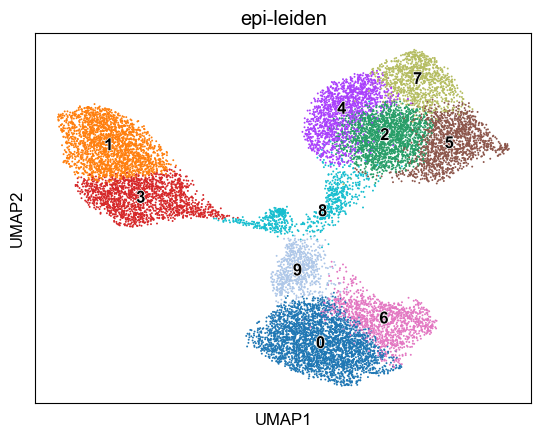

In [124]:
adata_epi_norm1 = adata_epi_norm[~adata_epi_norm.obs['epi-leiden'].isin(['11', '12', '13'])]
adata_epi_norm1 = clu(adata_epi_norm1, 'epi-leiden', n_pcs=30, do_har=True, resolution=1)

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


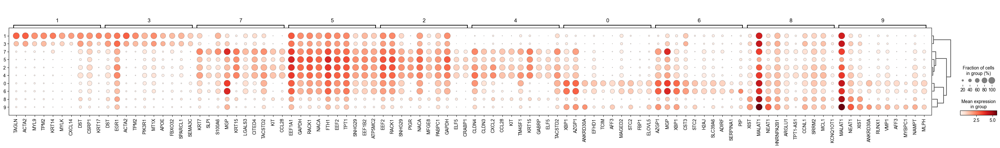

In [125]:
sc.tl.rank_genes_groups(adata_epi_norm1, groupby='epi-leiden', method='wilcoxon')
sc.tl.dendrogram(adata_epi_norm1, groupby='epi-leiden')
sc.pl.rank_genes_groups_dotplot(adata_epi_norm1, groupby='epi-leiden')

... storing 'epi-normtype' as categorical
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


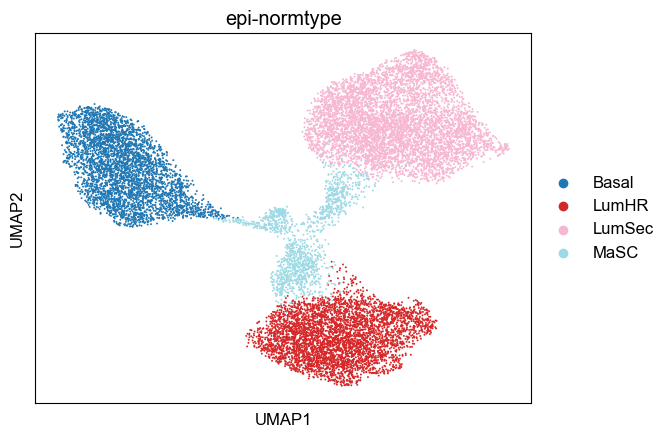

In [162]:
adata_epi_norm1.obs['epi-normtype'] = 'MaSC'
adata_epi_norm1.obs.loc[adata_epi_norm1.obs['epi-leiden'].isin(['2', '4', '5', '7']),'epi-normtype'] = 'LumSec'
adata_epi_norm1.obs.loc[adata_epi_norm1.obs['epi-leiden'].isin(['1', '3']),'epi-normtype'] = 'Basal'
adata_epi_norm1.obs.loc[adata_epi_norm1.obs['epi-leiden'].isin(['0', '6']),'epi-normtype'] = 'LumHR'
sc.pl.umap(adata_epi_norm1, color=['epi-normtype'], palette='tab20')

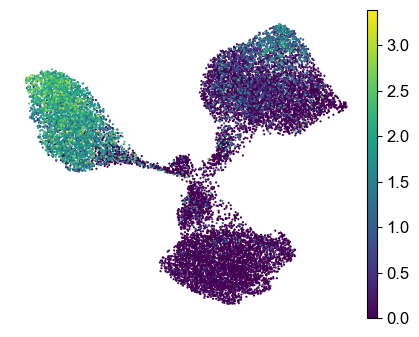

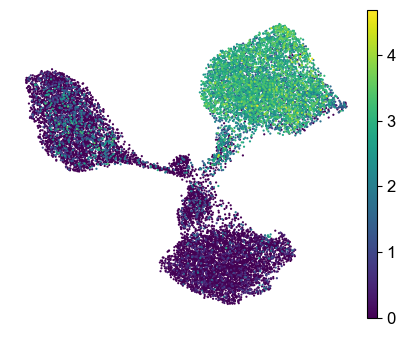

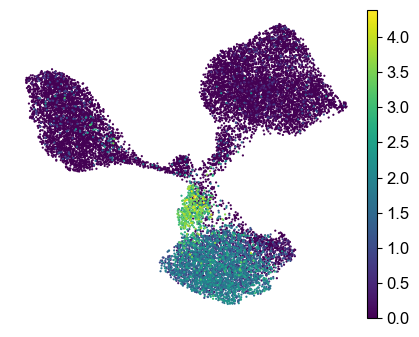

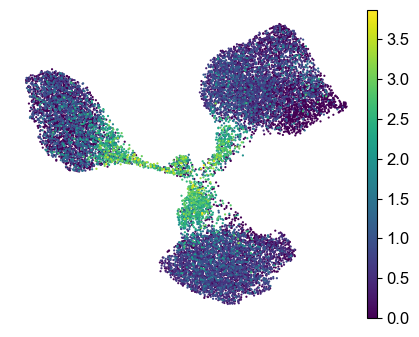

In [181]:
for gene in ['KRT5', 'KRT15', 'ANKRD30A', 'XIST']:
  fig, ax = plt.subplots(1, 1, figsize=(5, 4))
  sc.pl.umap(adata_epi_norm1, color=gene,size=10, ax=ax, title='',show=False)
  ax.spines['right'].set_visible(False)
  ax.spines['top'].set_visible(False)
  ax.spines['left'].set_visible(False)
  ax.spines['bottom'].set_visible(False)
  ax.set_xlabel("")
  ax.set_ylabel("")
  # ax.legend(  handletextpad=0.5, frameon=False,
  #                     borderpad=0.6,
  #                     columnspacing=1.3,
  #                     handlelength=0.65, fontsize=12)
  fig.savefig(f"figure-11.1/S1f-{gene}.png", dpi=400, bbox_inches='tight')

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


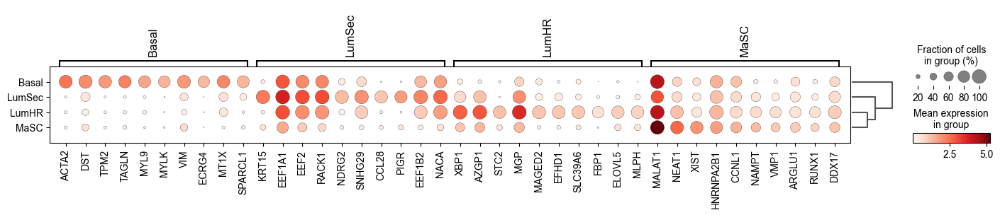

In [165]:
sc.tl.rank_genes_groups(adata_epi_norm1, groupby='epi-normtype', method='wilcoxon')
sc.tl.dendrogram(adata_epi_norm1, groupby='epi-normtype')
sc.pl.rank_genes_groups_dotplot(adata_epi_norm1, groupby='epi-normtype')

categories: Basal, LumHR, LumSec, etc.
var_group_labels: MaSC


/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


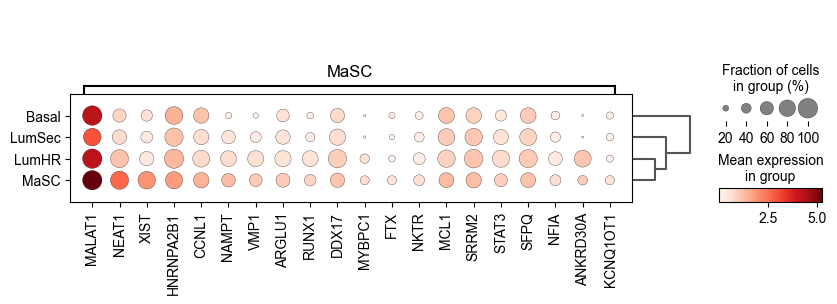

In [276]:
sc.pl.rank_genes_groups_dotplot(adata_epi_norm1, groupby='epi-normtype', groups=['MaSC'],n_genes=20)

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


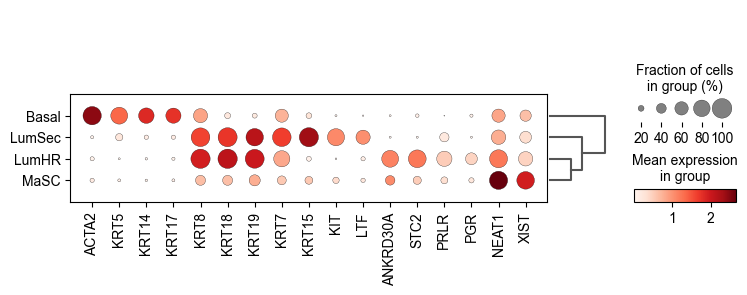

In [281]:
sc.pl.dotplot(adata_epi_norm1, var_names=['ACTA2','KRT5', 'KRT14', 'KRT17', 'KRT8', 'KRT18', 'KRT19',  'KRT7','KRT15',
                                          'KIT','LTF', 'ANKRD30A','STC2','PRLR','PGR', 'NEAT1', 'XIST'], groupby='epi-normtype', dendrogram=True, save='_epikrt.svg')

In [140]:
sc.tl.draw_graph(adata_epi_norm1)

In [45]:
adata_epi_cnv.obs['cnv_status'] = 'Neoplastic'
adata_epi_cnv.obs['cnv_status'].loc[adata_epi_cnv.obs['cnv_leiden'].isin(['2', '3', '4', '22', '24', '11', '13', '15'])] = 'Normal'

/tmp/ipykernel_2237227/3157399586.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata_epi_cnv.obs['cnv_status'].loc[adata_epi_cnv.obs['cnv_leiden'].isin(['2', '3', '4', '22', '24', '11', '13', '15'])] = 'Normal'


In [52]:
adata_epi_cnv.obs['IHC'] = list(adata_epi_cnv.obs['molecular_type'])
adata_epi_cnv.obs['IHC'].loc[adata_epi_cnv.obs['IHC'] == 'HER2'] = 'HR-HER2+'
adata_epi_cnv.obs['IHC'].loc[adata_epi_cnv.obs['IHC'] == 'LumB-HER2'] = 'HR+HER2+'
adata_epi_cnv.obs['IHC'].loc[adata_epi_cnv.obs['IHC'] == 'Luminal B'] = 'HR+HER2-'

/tmp/ipykernel_2237227/2882065122.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata_epi_cnv.obs['IHC'].loc[adata_epi_cnv.obs['IHC'] == 'HER2'] = 'HR-HER2+'
/tmp/ipykernel_2237227/2882065122.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata_epi_cnv.obs['IHC'].loc[adata_epi_cnv.obs['IHC'] == 'LumB-HER2'] = 'HR+HER2+'
/tmp/ipykernel_2237227/2882065122.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata_epi_cnv.obs['I

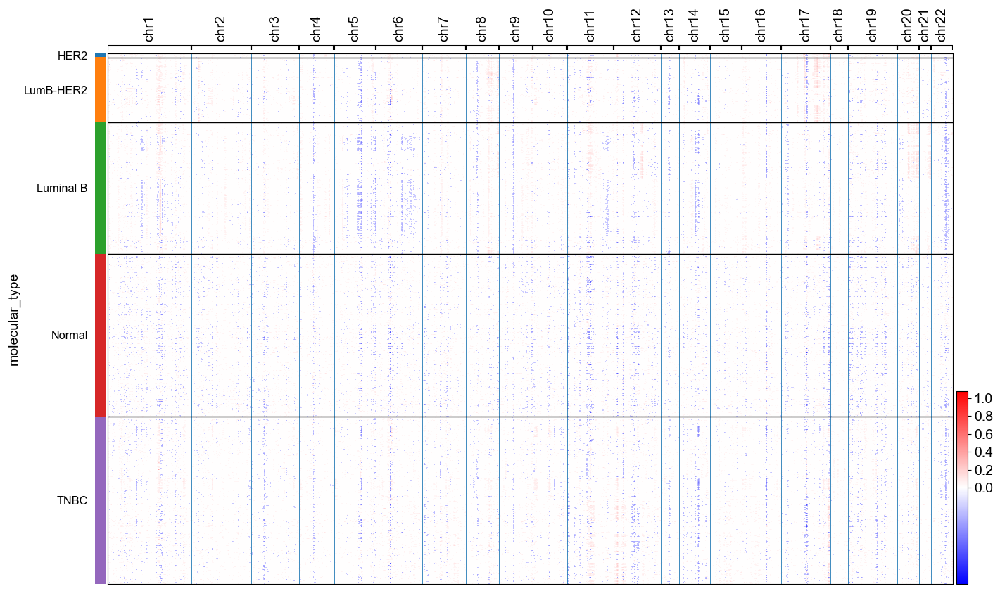

In [353]:
cnv.pl.chromosome_heatmap(adata_epi_cnv, groupby='molecular_type')

In [257]:
def propPlot(age_df, barlabels, ax, colors=sc.pl.palettes.default_20, xlabel='Patient ID', show_y=True, xrotate=90):
    all_df = age_df.sum(axis=1)
    age_normdf = pd.DataFrame([age_df.loc[i,:]/all_df[i] for i in barlabels], index=barlabels)
    age_cumdf = pd.DataFrame([np.cumsum(age_normdf.loc[i,:]) for i in barlabels], index=barlabels)
    norm_gdfs = age_normdf
    cum_gdfs = age_cumdf
    for i, col in enumerate(age_df.columns):
        height = norm_gdfs[col]
        starts = cum_gdfs[col] - height
        rects = ax.bar(barlabels, height, bottom=starts, width=0.9, color=colors[i], edgecolor='white', linewidth=0.5,
                        label=col, alpha=1)
    
        # ax.bar_label(rects,age_df.loc[:, col], label_type='center', color='lightgrey', fontsize=14)
    ax.legend( bbox_to_anchor=(1, -0.3), 
              handletextpad=0.5, frameon=False,
                          borderpad=0.4,
                          columnspacing=1,
                          handlelength=0.65,
              loc='lower left', fontsize=14)
    if show_y:
        ax.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1,decimals=0))
        ax.set_ylabel('Cell proportions')
    else:
        ax.yaxis.set_visible(False)
        ax.spines.left.set_visible(False)
    ax.set_xlabel(xlabel)
    ax.set_xticks(barlabels)
    ax.set_xticklabels(labels=barlabels,rotation=xrotate,fontsize=13)
    ax.spines.top.set_visible(False)
    ax.spines.right.set_visible(False)

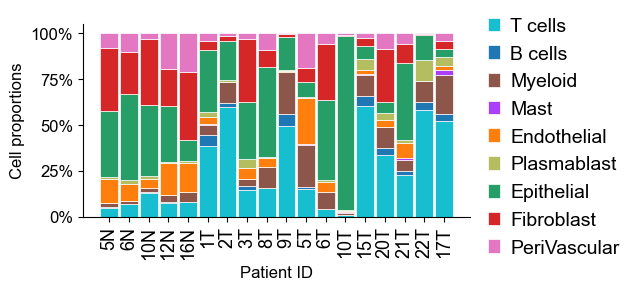

In [258]:
barlabels = ['5N', '6N', '10N', '12N','16N','1T', '2T', '3T', '8T', '9T', '5T','6T', '10T','15T','20T', '21T', '22T','17T']
cell_types = ['T cells', 'B cells', 'Myeloid', 'Mast', 'Endothelial','Plasmablast', 'Epithelial', 'Fibroblast', 
       'PeriVascular']
colors = pd.Series(sc.pl.palettes.default_20[:9], index=adata.obs['majorType-fix'].cat.categories)
colors = colors[cell_types]
age_df = pd.DataFrame(columns = list(cell_types))
for bar in barlabels:
    d1 = pd.DataFrame([len(adata[(adata.obs["majorType-fix"] == ct) & (adata.obs["batch"] == bar)]) for ct in list(cell_types)], index = list(cell_types), columns=[bar]).T
    age_df = pd.concat([age_df, d1])
fig0, ax0 = plt.subplots(figsize=(5, 2.5))
propPlot(age_df, barlabels, ax0, colors=colors)
fig0.savefig(f"figure-11.1/1d-proportions.svg",bbox_inches='tight')

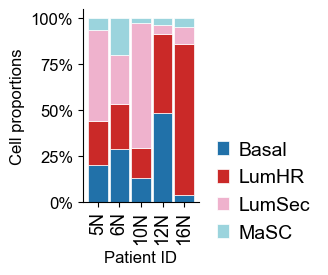

In [239]:
barlabels = ['5N', '6N', '10N', '12N','16N']
cell_types = ['Basal', 'LumHR', 'LumSec', 'MaSC']
# colors = pd.Series(sc.pl.palettes.default_20[:9], index=adata.obs['majorType-fix'].cat.categories)
colors = ['#2171a9','#ca2928', '#efb2cd','#9bd4dd']
age_df = pd.DataFrame(columns = list(cell_types))
for bar in barlabels:
    d1 = pd.DataFrame([len(adata_epi_norm1[(adata_epi_norm1.obs["epi-normtype"] == ct) & (adata_epi_norm1.obs["batch"] == bar)]) for ct in list(cell_types)], index = list(cell_types), columns=[bar]).T
    age_df = pd.concat([age_df, d1])
fig0, ax0 = plt.subplots(figsize=(1.5, 2.5))
propPlot(age_df, barlabels, ax0, colors=colors)
fig0.savefig(f"figure-11.1/1i-proportions.svg",bbox_inches='tight')

In [286]:
# get deg result
result = adata_epi_norm1.uns['rank_genes_groups']
groups = result['names'].dtype.names
degs = pd.DataFrame(
    {group + '_' + key: result[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})
# subset up or down regulated genes
degs_sig = degs[degs.MaSC_pvals_adj < 0.05]
degs_up = degs_sig[degs_sig.MaSC_logfoldchanges > 0]
degs_dw = degs_sig[degs_sig.MaSC_logfoldchanges < 0]

In [287]:
import gseapy as gp
from gseapy import Msigdb
msig = Msigdb()
# mouse hallmark gene sets
gmt = msig.get_gmt(category='mh.all', dbver="2023.2.Hs")
gmt

In [288]:
enr_up = gp.enrichr(degs_up.MaSC_names,
                    gene_sets='KEGG_2021_Human',
                    outdir=None)
cc_up = gp.enrichr(degs_up.MaSC_names,
                    gene_sets='GO_Cellular_Component_2023',
                    outdir=None)
bp_up = gp.enrichr(degs_up.MaSC_names,
                    gene_sets='GO_Biological_Process_2023',
                    outdir=None)
mf_up = gp.enrichr(degs_up.MaSC_names,
                    gene_sets='GO_Molecular_Function_2023',
                    outdir=None)

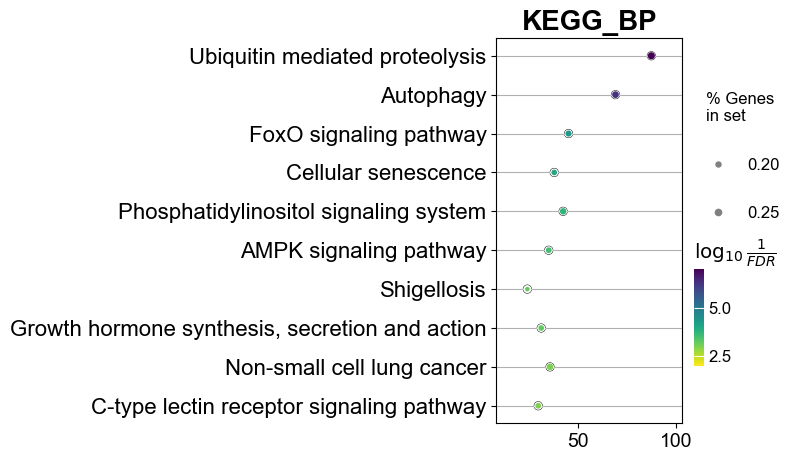

In [295]:
from gseapy.scipalette import SciPalette
sci = SciPalette()
NbDr = sci.create_colormap()
# display multi-datasets
ax = gp.dotplot(enr_up.res2d,figsize=(3,5),
                x='UP_DW',
                x_order = ["UP"],
                title="KEGG_BP",
                size=3,
                show_ring=True)
ax.set_xlabel("")
ax.figure.savefig(f"figure-11.1/KEGG_BP.svg")

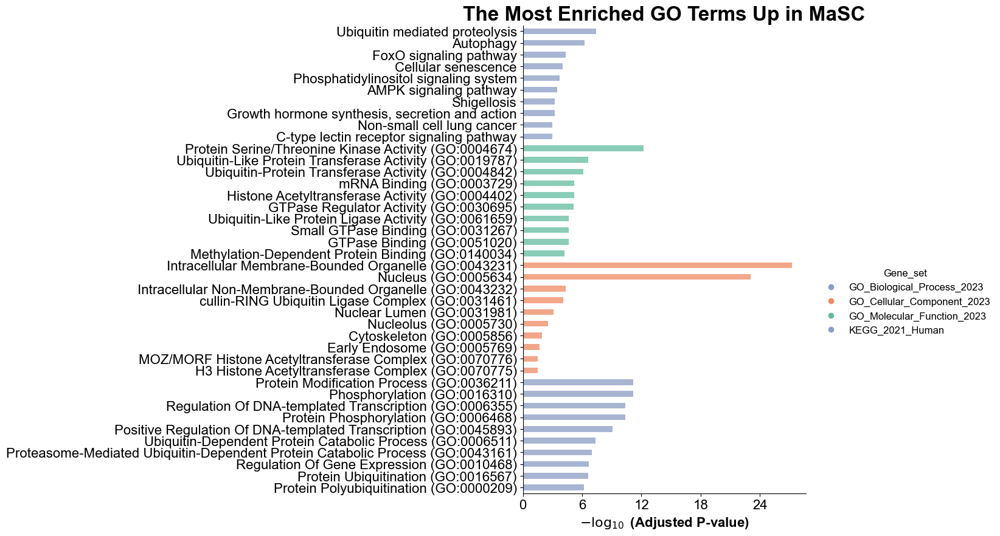

In [299]:
go_res = pd.concat([enr_up.res2d.head(10), cc_up.res2d.head(10), bp_up.res2d.head(10), mf_up.res2d.head(10)])
ax = gp.barplot(go_res, figsize=(6,10),
                group ='Gene_set',
                top_term=15,
                color = ['#8b9cc4', '#f08961', '#62bb9f'],
                title ="The Most Enriched GO Terms Up in MaSC")
ax.figure.savefig(f"figure-11.1/go_up.png", bbox_inches='tight', dpi=300)

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
/tmp/ipykernel_2237227/994677382.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommoda

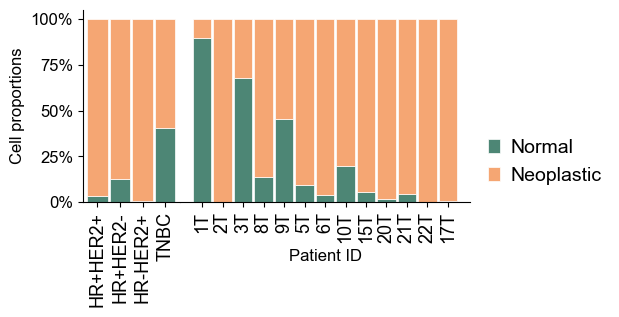

In [255]:
# print immune epi and mesenchyme cell proportions
import matplotlib.gridspec as gridspec
fig = plt.figure(tight_layout=True, figsize=(5,2.5))
gs = gridspec.GridSpec(1, 4, wspace=0)


barlabels = ['HR+HER2+', 'HR+HER2-', 'HR-HER2+', 'TNBC']
general_types = {
    'Normal': ['Normal'],
    'Neoplastic':['Neoplastic'],
}
age_df = pd.DataFrame(columns = list(general_types.keys()))
for bar in barlabels:
    d1 = pd.DataFrame([len(adata_epi_tumor[(adata_epi_tumor.obs["cnv_status"].isin(general_types[type])) & (adata_epi_tumor.obs["IHC"] == bar)]) 
                       for type in list(general_types.keys())], 
                      index =list(general_types.keys()), columns=[bar]).T
    age_df = pd.concat([age_df, d1])
ax1 = fig.add_subplot(gs[0, :1])
propPlot(age_df, barlabels, ax1,colors=['#4d8675', '#f5a673'], xlabel='')



barlabels = ['1T', '2T', '3T',  '8T', '9T', '5T','6T', '10T', '15T', '20T', '21T', '22T','17T']
general_types = {
    'Normal': ['Normal'],
    'Neoplastic': ['Neoplastic'],
}
age_df = pd.DataFrame(columns = list(general_types.keys()))
for bar in barlabels:
    d1 = pd.DataFrame([len(adata_epi_tumor[(adata_epi_tumor.obs["cnv_status"].isin(general_types[type])) & (adata_epi_tumor.obs["batch"] == bar)]) 
                       for type in list(general_types.keys())], 
                      index =list(general_types.keys()), columns=[bar]).T
    age_df = pd.concat([age_df, d1])
ax2 = fig.add_subplot(gs[0, 1:])
propPlot(age_df, barlabels, ax2,colors=['#4d8675', '#f5a673'], show_y=False)
fig.savefig(f"figure-11.1/1j-proportions.svg",bbox_inches='tight')

In [230]:
adata_epi_norm1.obs['epi-normtype']

AAACCTGAGCGCTTAT-5N      LumHR
AAACCTGAGTCATGCT-5N     LumSec
AAACCTGAGTGTACCT-5N      Basal
AAACCTGCAACCGCCA-5N     LumSec
AAACCTGCAAGCCCAC-5N     LumSec
                         ...  
TTTACTGCAGTATAAG-16N     Basal
TTTACTGTCGATAGAA-16N     LumHR
TTTATGCCAGGGCATA-16N    LumSec
TTTCCTCTCAATCTCT-16N     LumHR
TTTGTCACATCCTAGA-16N     LumHR
Name: epi-normtype, Length: 15440, dtype: category
Categories (4, object): ['Basal', 'LumHR', 'LumSec', 'MaSC']

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


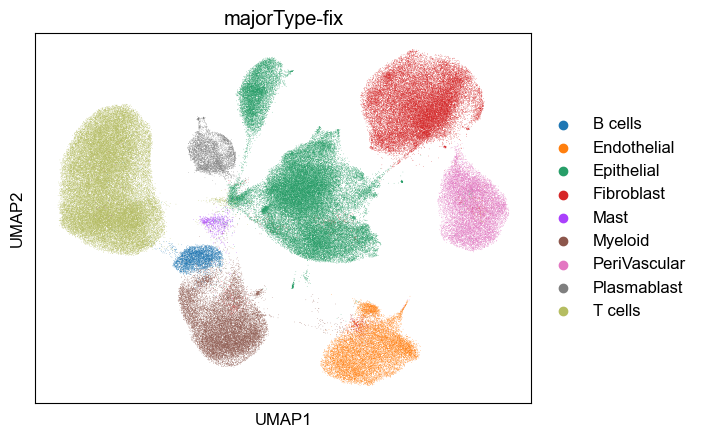

In [217]:
sc.pl.umap(adata, color=['majorType-fix'], palette=sc.pl.palettes.vega_10_scanpy)

In [204]:
adata

AnnData object with n_obs × n_vars = 178891 × 41733
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'majorType-fix', 'IHC'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'CellphoneDB', 'batch_colors', 'dendrogram_leiden', 'epi-subtype_colors', 'gender_colors', 'hvg', 'leiden', 'leiden-harmony-female_colors', 'leiden_colors', 'leiden_harmony_colors', 'log1p', 'majorType-Female_colors', 'majorType-fix_colors', 'major_type_colors', 'major_type_harmony_colors', 'minor-type_colors', 'minor_type_colors', 'molecular_type_colors',

In [355]:
import matplotlib.pyplot as plt
figpath = "figure-5.7"
cnv.pl.chromosome_heatmap(adata_epi_cnv, groupby='molecular_type', show=False, save="cnv.pdf")

{'heatmap_ax': <AxesSubplot: >,
 'groupby_ax': <AxesSubplot: ylabel='molecular_type'>,
 'gene_groups_ax': <AxesSubplot: >}

In [3]:
adata_epi_norm = sc.read_h5ad("adata-epi-norm.h5ad")
adata_epi_tumor = sc.read_h5ad("adata-epi-tumor.h5ad")

In [364]:
adata_Fepi = adata_epi_cnv

In [20]:
adata_Fepi.obsm['X_cnv'] = adata_epi_cnv.obsm['X_cnv']
adata_Fepi.obsm['X_cnv_pca'] = adata_epi_cnv.obsm['X_cnv_pca']
adata_Fepi.obsm['X_cnv_umap'] = adata_epi_cnv.obsm['X_cnv_umap']

/tmp/ipykernel_724992/647293555.py:1: ImplicitModificationWarning: Setting element `.obsm['X_cnv']` of view, initializing view as actual.
  adata_Fepi.obsm['X_cnv'] = adata_epi_cnv.obsm['X_cnv']


In [1]:
import torch
import torch.utils.data as Data
import torch.nn as nn
import torch.nn.functional as F
from sklearn.preprocessing import MinMaxScaler
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")

Using cuda device


In [17]:
# hyperparams
learning_rate=1e-3
num_epochs=1000
batch_size=1024
epoch_thresh=1e-7

In [27]:
class VAE(nn.Module):
    def __init__(self, count_size = 3000, h_dim=400, z_dim=20):
        super(VAE, self).__init__()
        self.z_dim = z_dim
        self.fc1 = nn.Linear(count_size, h_dim)
        self.fc2 = nn.Linear(h_dim, z_dim)  # 均值 向量
        self.fc3 = nn.Linear(h_dim, z_dim)  # 保准方差 向量
        self.fc4 = nn.Linear(z_dim, h_dim)
        self.fc5 = nn.Linear(h_dim, count_size)

    # 编码过程
    def encode(self, x):
        h = F.relu(self.fc1(x))
        return self.fc2(h), self.fc3(h)

    # 随机生成隐含向量
    def reparameterize(self, mu, log_var):
        std = torch.exp(log_var / 2)
        eps = torch.randn_like(std)
        return mu + eps * std

    # 解码过程
    def decode(self, z):
        h = F.relu(self.fc4(z))
        return torch.sigmoid(self.fc5(h))

    # 整个前向传播过程：编码-》解码
    def forward(self, x):
        mu, log_var = self.encode(x)
        z = self.reparameterize(mu, log_var)
        x_reconst = self.decode(z)
        return x_reconst, mu, log_var

In [26]:
class VAE2(nn.Module):
    def __init__(self, model1:VAE, count_size = 3000, h_dim=400, z_dim=20):
        super(VAE2, self).__init__()
        self.gmodel = model1
        self.fc1 = nn.Linear(count_size, h_dim)
        self.fc2 = nn.Linear(h_dim, z_dim)  # 均值 向量
        self.fc3 = nn.Linear(h_dim, z_dim)  # 保准方差 向量
        self.fc4 = nn.Linear(z_dim*2, h_dim)
        self.fc5 = nn.Linear(h_dim, count_size)

    # 编码过程
    def encode(self, x):
        h = F.relu(self.fc1(x))
        return self.fc2(h), self.fc3(h)
    
    def encode_gmodel(self, x):
        h = F.relu(self.gmodel.fc1(x))
        return self.gmodel.fc2(h), self.gmodel.fc3(h)

    # 随机生成隐含向量
    def reparameterize(self, mu, log_var):
        std = torch.exp(log_var / 2)
        eps = torch.randn_like(std)
        return mu + eps * std

    # 解码过程
    def decode(self, z):
        h = F.relu(self.fc4(z))
        return torch.sigmoid(self.fc5(h))

    # 整个前向传播过程：编码-》解码
    def forward(self, x):
        mu1, log_var1 = self.encode(x)
        mu2, log_var2 = self.encode_gmodel(x)
        z1 = self.reparameterize(mu1, log_var1)
        z2 = self.reparameterize(mu2, log_var2)
        z = torch.cat([z1, z2], dim=1)
        mu = torch.cat([mu1, mu2], dim=1)
        log_var = torch.cat([log_var1, log_var2], dim=1)
        x_reconst = self.decode(z)
        return x_reconst, mu, log_var

In [ ]:
# train for all epi data
adata_train = adata_Fepi[:,adata_Fepi.var['highly_variable']].copy()
count_size = len(adata_train.var_names)
scdataset = adata_train.X.todense()
scdataset = np.asarray(scdataset)
scaler = MinMaxScaler()
scdataset = scaler.fit_transform(scdataset)
dataset = torch.from_numpy(np.array(scdataset))
data_loader = Data.DataLoader(dataset=dataset,
                              batch_size=len(dataset),
                              shuffle=True)
gmodel = VAE(count_size=count_size, h_dim=400, z_dim=30).to(device)
optimizer = torch.optim.Adam(gmodel.parameters(), lr=learning_rate)
for epoch in range(num_epochs):
    kl_divs = []
    for i, x in enumerate(data_loader):
        x = x.to(device).view(-1, count_size)
        x_reconst, mu, log_var = gmodel(x)

        reconst_loss = F.binary_cross_entropy(x_reconst, x, reduction='mean')
        kl_div = - 0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp())

        loss = reconst_loss + kl_div
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        kl_divs.append(kl_div)
    if epoch % 100 == 0 and epoch > 0:
        print("Epoch[{}/{}] Reconst Loss: {}, KL Div: {}"
                .format(epoch, num_epochs, reconst_loss.item(), kl_div.item()))
    if sum(kl_divs) < epoch_thresh:
        break
print("Epoch has reach an end.")

In [211]:
adata_train = adata_Fepi[:,adata_Fepi.var['highly_variable']].copy()

In [15]:
adata_train_LumHR = adata_epi_norm[adata_epi_norm.obs['epi-normtype'] == 'LumHR']
adata_train_LumSec = adata_epi_norm[adata_epi_norm.obs['epi-normtype'] == 'LumSec']
adata_train_Basal = adata_epi_norm[adata_epi_norm.obs['epi-normtype'] == 'Basal']
adata_train_MaSC = adata_epi_norm[adata_epi_norm.obs['epi-normtype'] == 'MaSC']

In [51]:
from torch.utils.data import random_split
adata_train = adata_train_MaSC[:,adata_train_MaSC.var['highly_variable']].copy()
adata_normal = adata_train
count_size = len(adata_normal.var_names)
scdataset = adata_normal.X.todense()
scdataset = np.asarray(scdataset)
# scaler = MinMaxScaler()
# scdataset = scaler.fit_transform(scdataset)
dataset = torch.from_numpy(np.array(scdataset))
train_len = int(0.8 * len(dataset))
valid_len = len(dataset) - train_len
train_dataset, valid_dataset = random_split(dataset, [train_len, valid_len])
train_loader = Data.DataLoader(dataset=train_dataset,
                              batch_size=len(train_dataset),
                              shuffle=True)
valid_loader = Data.DataLoader(dataset=valid_dataset,
                              batch_size=len(valid_dataset),
                              shuffle=True)
nmodel = VAE(count_size=count_size, h_dim=512, z_dim=128).to(device)
optimizer_n = torch.optim.Adam(nmodel.parameters(), lr=0.005)

In [52]:
num_epochs=1000
for epoch in range(num_epochs):
    kl_divs = []
    for i, x in enumerate(train_loader):
        x = x.to(device).view(-1, count_size)
        x_reconst, mu, log_var = nmodel(x)

        reconst_loss = F.mse_loss(x_reconst, x, reduction='mean')
        kl_div = - 0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp())

        loss = reconst_loss + kl_div
        optimizer_n.zero_grad()
        loss.backward()
        optimizer_n.step()

        kl_divs.append(kl_div)
    if epoch % 20 == 0 and epoch > 0:
        # validation
        for i, x in enumerate(valid_loader):
            x = x.to(device).view(-1, count_size)
            x_reconst, mu, log_var = nmodel(x)
            reconst_loss = F.mse_loss(x_reconst, x, reduction='mean')
            kl_div = - 0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp())
            vloss = reconst_loss + kl_div

        print("Epoch[{}/{}] Train Loss: {}, Valid Loss: {}"
                .format(epoch, num_epochs, loss.item(), vloss.item()))
    # if sum(kl_divs) < epoch_thresh:
    #     break
print("Epoch has reach an end.")

Epoch[20/1000] Train Loss: 43.97529602050781, Valid Loss: 10.139410018920898
Epoch[40/1000] Train Loss: 3.294177293777466, Valid Loss: 0.7735446691513062
Epoch[60/1000] Train Loss: 0.5247047543525696, Valid Loss: 0.17903399467468262
Epoch[80/1000] Train Loss: 0.13872021436691284, Valid Loss: 0.08936295658349991
Epoch[100/1000] Train Loss: 0.08221931755542755, Valid Loss: 0.07662578672170639
Epoch[120/1000] Train Loss: 0.07570038735866547, Valid Loss: 0.07468954473733902
Epoch[140/1000] Train Loss: 0.0751030445098877, Valid Loss: 0.07458171993494034
Epoch[160/1000] Train Loss: 0.0748865082859993, Valid Loss: 0.0744454562664032
Epoch[180/1000] Train Loss: 0.07438252866268158, Valid Loss: 0.0742088109254837
Epoch[200/1000] Train Loss: 0.07333392649888992, Valid Loss: 0.07419893890619278
Epoch[220/1000] Train Loss: 0.07398242503404617, Valid Loss: 0.07413055747747421
Epoch[240/1000] Train Loss: 0.07414884120225906, Valid Loss: 0.07409098744392395
Epoch[260/1000] Train Loss: 0.0735930502414

In [40]:
adata_tumor = adata_epi_tumor[:,adata_epi_tumor.var['highly_variable']].copy()

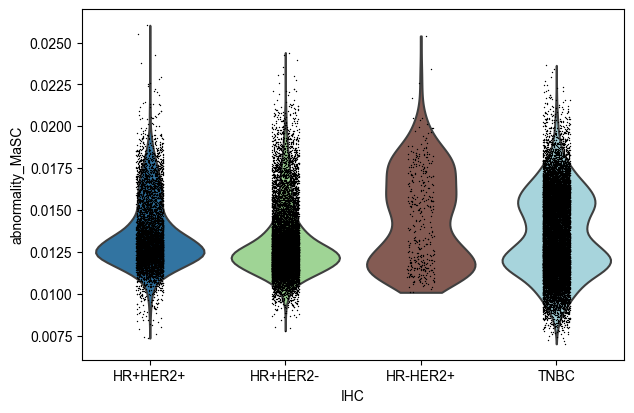

In [53]:
scdataset = adata_tumor.X.todense()
scdataset = np.asarray(scdataset)
# scaler = MinMaxScaler()
# scdataset = scaler.fit_transform(scdataset)
dataset = torch.from_numpy(np.array(scdataset))
data_loader = Data.DataLoader(dataset=dataset,
                              batch_size=1,
                              shuffle=False)
losses = np.zeros(len(adata_tumor))
with torch.no_grad():
    for i, x in enumerate(data_loader):
        x = x.to(device).view(-1, count_size)
        out, mu, log_var = nmodel(x)
        reconst_loss = F.mse_loss(out, x, reduction='mean')
        kl_div = - 0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp())

        loss = reconst_loss + kl_div
        loss = loss.cpu().numpy()
        losses[i] = loss
adata_tumor.obs['abnormality_MaSC'] = losses
sc.pl.violin(adata_tumor, 'abnormality_MaSC', 'IHC')

In [189]:
adata_epi_cnv = adata_epi_norm.concatenate(adata_epi_tumor, batch_key='batch0')

/tmp/ipykernel_125082/1594088843.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_epi_cnv = adata_epi_norm.concatenate(adata_epi_tumor, batch_key='batch0')


In [190]:
adata_epi_cnv.obs_names = [s.split('-')[0]+'-'+s.split('-')[1] for s in adata_epi_cnv.obs_names]

In [191]:
adata_epi_cnv.obs.loc[adata_epi_cnv.obs['molecular_type']=='Normal','cnv_status'] = 'Normal'

In [145]:
adata_epi_norm1 = adata_epi_cnv[adata_epi_cnv.obs['cnv_status']=='Normal'] 

2024-11-13 16:00:35,082 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


Ignoring processing doublet cells...


2024-11-13 16:02:27,817 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-11-13 16:02:28,091 - harmonypy - INFO - Iteration 1 of 20
2024-11-13 16:02:59,449 - harmonypy - INFO - Iteration 2 of 20
2024-11-13 16:03:28,787 - harmonypy - INFO - Iteration 3 of 20
2024-11-13 16:04:01,139 - harmonypy - INFO - Iteration 4 of 20
2024-11-13 16:04:32,298 - harmonypy - INFO - Iteration 5 of 20
2024-11-13 16:05:07,492 - harmonypy - INFO - Iteration 6 of 20
2024-11-13 16:05:30,761 - harmonypy - INFO - Iteration 7 of 20
2024-11-13 16:05:48,627 - harmonypy - INFO - Converged after 7 iterations
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


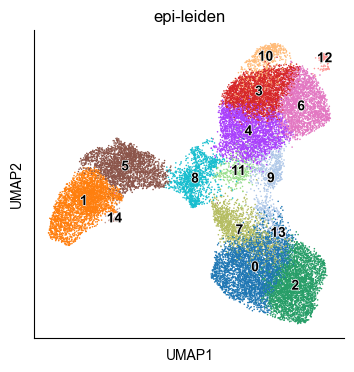

In [148]:
adata_epi_norm1 = clu(adata_epi_norm1, n_neighbors=50, n_pcs=15, key_added='epi-leiden', rep='X_pca_harmony', do_har=True, do_scrublet=False)

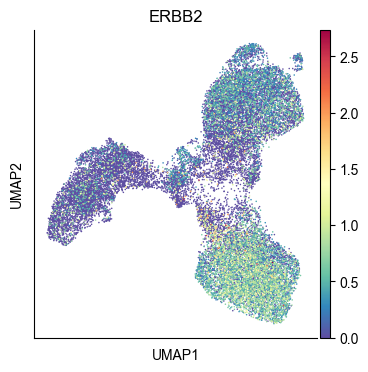

In [188]:
sc.pl.umap(adata_epi_norm1, color=['ERBB2'])

Ignoring processing doublet cells...
Evaluating neighbors only...


/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


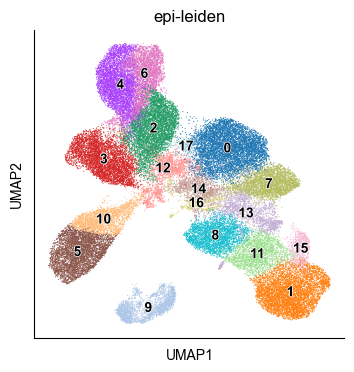

In [74]:
adata_epi_cnv = clu(adata_epi_cnv, n_neighbors=50, n_pcs=13, key_added='epi-leiden', rep='X_pca', do_har=False, do_scrublet=False)

In [72]:
adata_epi_cnv.obs.loc[adata_epi_cnv.obs['molecular_type']=='Normal','cnv_status'] = 'Normal'

In [85]:
adata_epi_norm[adata_epi_norm.obs['epi-normtype'] == 'MaSC'].obs_names

Index(['AAACCTGTCATAAAGG-5N', 'AAAGTAGCACGGTAAG-5N', 'AACACGTCACGCTTTC-5N',
       'AACCGCGTCGGAGCAA-5N', 'AACGTTGAGCTAACTC-5N', 'AACTCAGAGGTGCACA-5N',
       'AACTGGTTCAGGCCCA-5N', 'AAGACCTCACCGAATT-5N', 'AAGGTTCAGCGTGAAC-5N',
       'AAGGTTCCAGCTGTTA-5N',
       ...
       'GAGCAGAGTCGATTGT-16N', 'GCATGCGAGGAATCGC-16N', 'GGAATAATCATCACCC-16N',
       'GGGTCTGCAATGGAGC-16N', 'GGGTCTGGTTCGCTAA-16N', 'GTCTTCGAGAAGGTTT-16N',
       'GTCTTCGTCGTTTATC-16N', 'GTTAAGCAGACAATAC-16N', 'TACGGGCCACTTAACG-16N',
       'TGTTCCGCACATGACT-16N'],
      dtype='object', length=1478)

In [187]:
sc.pl.umap(adata_epi_cnv, color=['epi-normtype', 'IHC'])

KeyError: 'Could not find key epi-normtype in .var_names or .obs.columns.'

<Figure size 966x400 with 0 Axes>

In [108]:
start_cell = list(adata_epi_norm[adata_epi_norm.obs['epi-normtype'] == 'MaSC'].obs_names)[100]
pr_res = palantir.core.run_palantir(adata_epi_cnv, start_cell, num_waypoints=500, n_jobs=16)

Sampling and flocking waypoints...
Time for determining waypoints: 0.09539731740951538 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...


/home/rzh/BCY/lib/python3.10/site-packages/palantir/core.py:558: UserWarning: Some of the cells were unreachable. Consider increasing the k for 
             nearest neighbor graph construction.
  warnings.warn(
/home/rzh/BCY/lib/python3.10/site-packages/setuptools_scm/_integration/setuptools.py:30: RuntimeWarning: 
ERROR: setuptools==59.6.0 is used in combination with setuptools_scm>=8.x

Your build configuration is incomplete and previously worked by accident!
setuptools_scm requires setuptools>=61

Suggested workaround if applicable:
 - migrating from the deprecated setup_requires mechanism to pep517/518
   and using a pyproject.toml to declare build dependencies
   which are reliably pre-installed before running the build tools

  warnings.warn(
/home/rzh/BCY/lib/python3.10/site-packages/setuptools_scm/_integration/setuptools.py:30: RuntimeWarning: 
ERROR: setuptools==59.6.0 is used in combination with setuptools_scm>=8.x

Your build configuration is incomplete and previously worke

Time for shortest paths: 0.7557904640833537 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9834
Correlation at iteration 2: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


In [114]:
adata_epi_cnv.obs['epi-normtype'] = list(adata_epi_cnv.obs['epi-normtype'])
adata_epi_cnv.obs.loc[adata_epi_cnv.obs['IHC'] == 'HR+HER2+', 'epi-normtype'] = 'HR+HER2+'
adata_epi_cnv.obs.loc[adata_epi_cnv.obs['IHC'] == 'HR+HER2-', 'epi-normtype'] = 'HR+HER2-'
adata_epi_cnv.obs.loc[adata_epi_cnv.obs['IHC'] == 'HR-HER2+', 'epi-normtype'] = 'HR+HER2+'
adata_epi_cnv.obs.loc[adata_epi_cnv.obs['IHC'] == 'TNBC', 'epi-normtype'] = 'TNBC'

In [134]:
adata_epi_cnv

AnnData object with n_obs × n_vars = 52217 × 39735
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'majorType-fix', 'cnv_leiden', 'cnv_score', 'cnv_status', 'IHC', 'epi-leiden', 'epi-normtype', 'palantir_pseudotime', 'palantir_entropy'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'symbol', 'ensg', 'chromosome', 'start', 'end'
    uns: 'DM_EigenValues', 'neighbors', 'umap', 'leiden', 'epi-leiden_colors', 'epi-normtype_colors', 'cnv_status_colors', 'IHC_colors', 'batch_colors', 'palantir_waypoints', 'paga', 'epi-normtype_sizes'
  

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


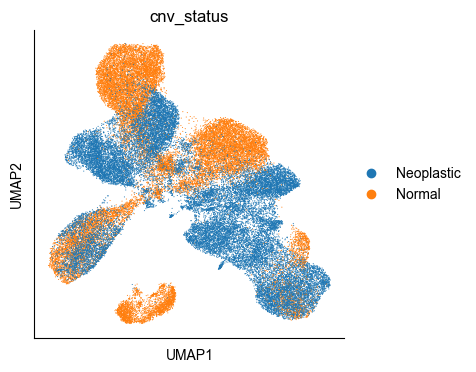

In [133]:
sc.pl.umap(adata_epi_cnv, color=['cnv_status'])

In [109]:
genes = ['CD34', 'MPO', 'GATA1', 'IRF8']
gene_trends = palantir.presults.compute_gene_trends( adata_epi_cnv)
palantir.plot.plot_gene_trends(gene_trends)

KeyError: 'branch_masks not found in ad.obsm'

In [96]:
adata_epi_cnv.obs_names = [s.split('-')[0]+'-'+s.split('-')[1] for s in adata_epi_cnv.obs_names]

In [93]:
ms_data.index = [s.split('-')[0]+'-'+s.split('-')[1] for s in ms_data.index]

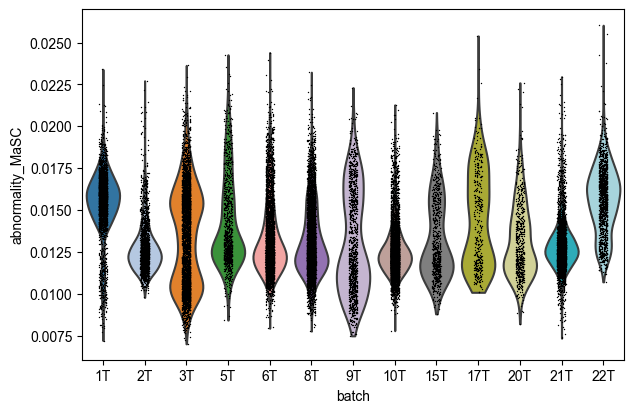

In [57]:
sc.pl.violin(adata_tumor, 'abnormality_MaSC', 'batch')

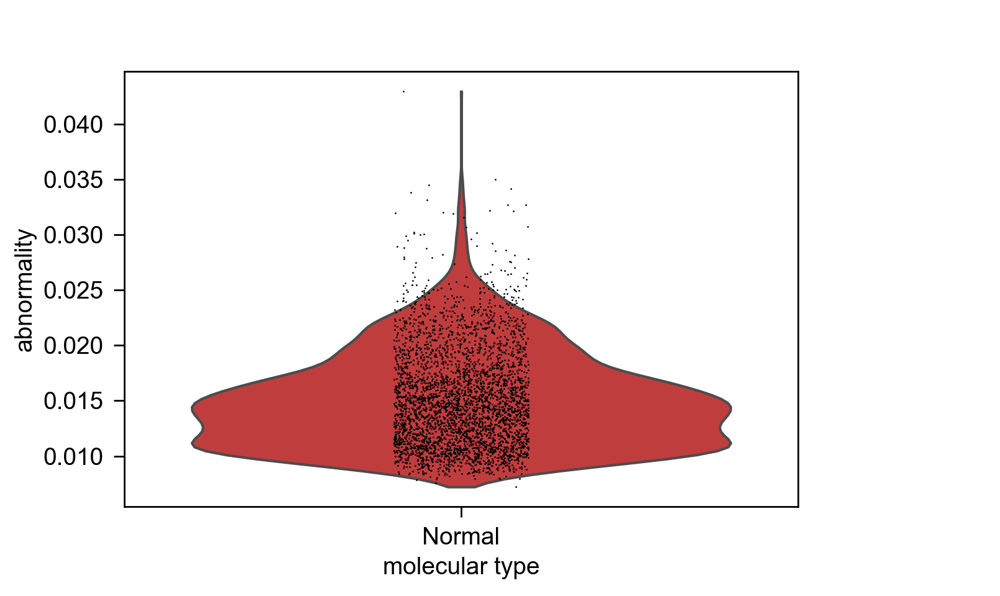

In [251]:
adata_normal = adata_train[adata_train.obs['batch_mol'].isin(['10N_Normal', '16N_Normal']), :]
scdataset = adata_normal.X.todense()
scdataset = np.asarray(scdataset)
scaler = MinMaxScaler()
scdataset = scaler.fit_transform(scdataset)
dataset = torch.from_numpy(np.array(scdataset))
data_loader = Data.DataLoader(dataset=dataset,
                              batch_size=1,
                              shuffle=False)
losses = np.zeros(len(adata_normal))
with torch.no_grad():
    for i, x in enumerate(data_loader):
        x = x.to(device).view(-1, count_size)
        out, mu, log_var = nmodel(x)
        reconst_loss = F.mse_loss(out, x, reduction='mean')
        kl_div = - 0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp())

        loss = reconst_loss + kl_div
        loss = loss.cpu().numpy()
        losses[i] = loss
adata_normal.obs['abnormality'] = losses
sc.pl.violin(adata_normal, 'abnormality', 'molecular_type')

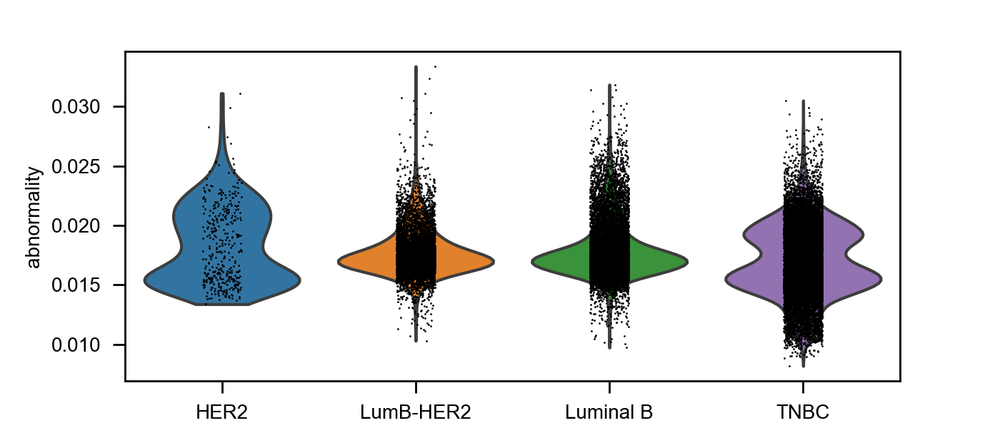

In [220]:
fig, ax = plt.subplots(figsize=(7,3))
sc.pl.violin(adata_tumor, 'abnormality', 'molecular_type', ax=ax)
fig.savefig(f"{figpath}/abnormality_molecular.png", dpi=300, bbox_inches='tight')

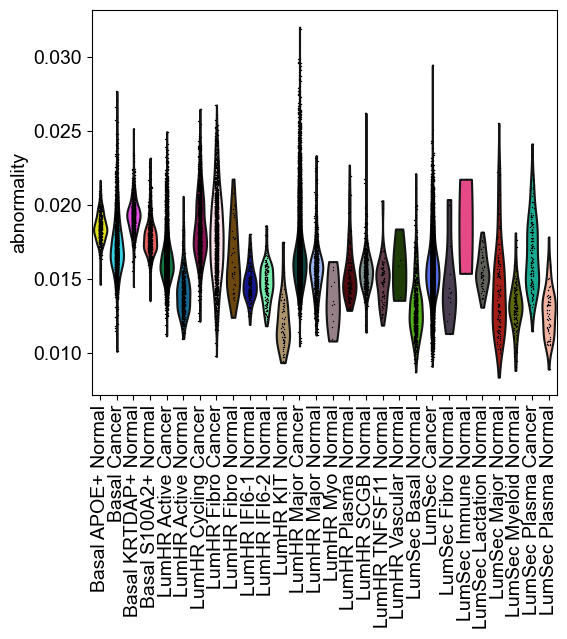

In [381]:
fig, ax = plt.subplots(figsize=(6,5))
sc.pl.violin(adata_tumor, 'abnormality', 'epi-subtype', rotation=90, ax=ax)
fig.savefig(f"{figpath}/abnormality_subtype.png", dpi=300, bbox_inches='tight')

In [382]:
diversity = adata_tumor.obs.groupby(by="epi-subtype").std()['abnormality']
df = pd.DataFrame([diversity], index=['std']).T
df = df.sort_values(by='std')
df

/tmp/ipykernel_724992/2690235344.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  diversity = adata_tumor.obs.groupby(by="epi-subtype").std()['abnormality']


,std
epi-subtype,
Basal APOE+ Normal,0.000955
LumHR IFI6-1 Normal,0.001127
Basal KRTDAP+ Normal,0.001130
Basal S100A2+ Normal,0.001168
LumSec Lactation Normal,0.001228
LumHR IFI6-2 Normal,0.001279
LumHR SCGB Normal,0.001287
LumHR Active Normal,0.001483
LumHR TNFSF11 Normal,0.001513


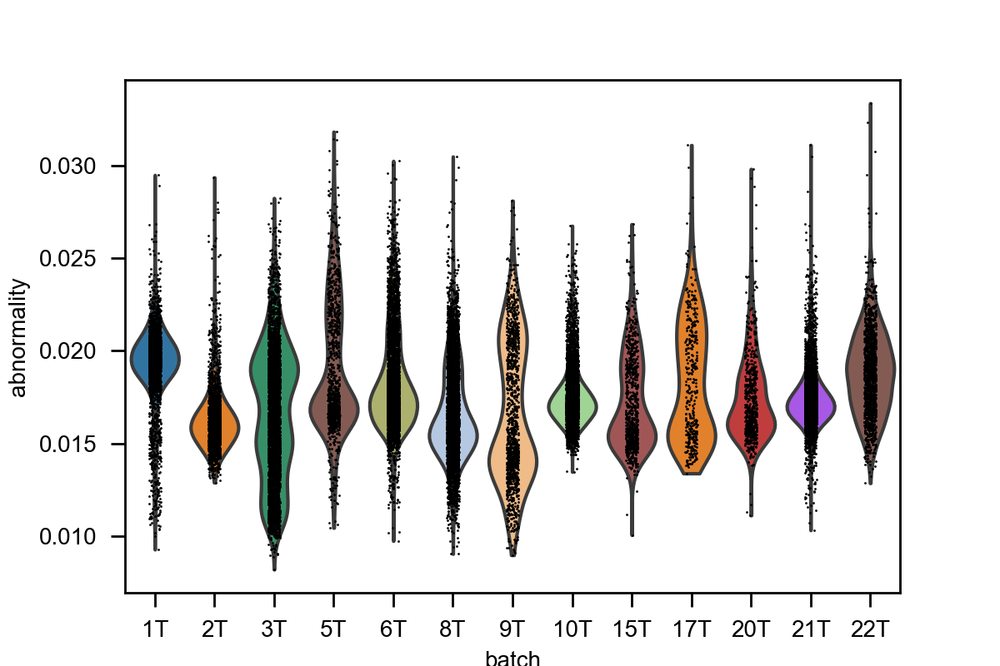

In [221]:
fig, ax = plt.subplots(figsize=(6,4))
sc.pl.violin(adata_tumor, 'abnormality', 'batch', ax=ax)
fig.savefig(f"{figpath}/abnormality_batch.png", dpi=300, bbox_inches='tight')

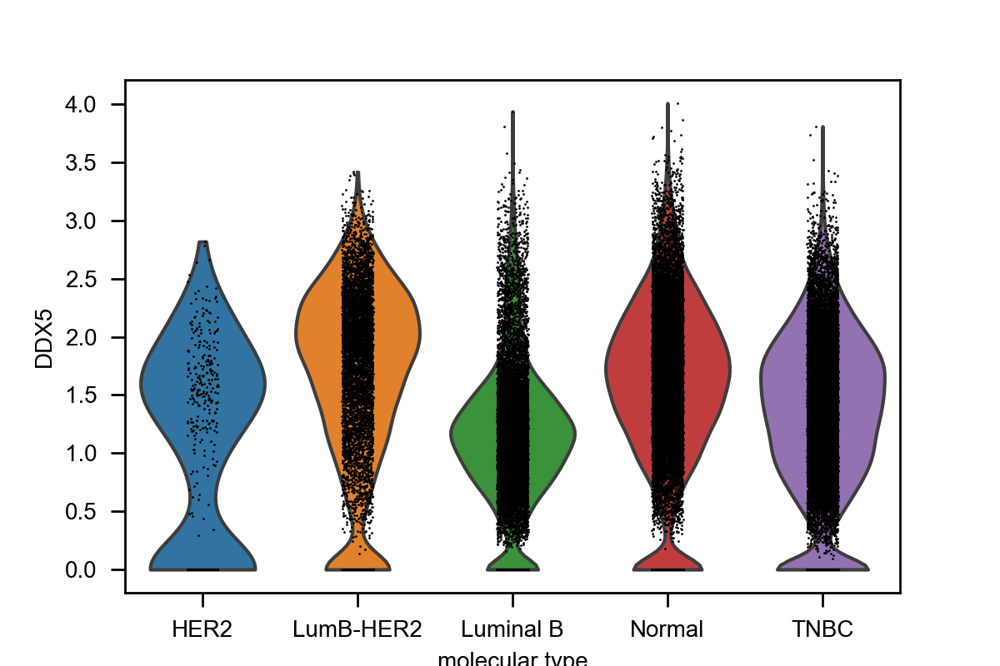

In [222]:
fig, ax = plt.subplots(figsize=(6,4))
sc.pl.violin(adata_Fepi, keys='DDX5', groupby='molecular_type', ax=ax)
fig.savefig(f'{figpath}/violin-DDX5.png', dpi=300, bbox_inches='tight')

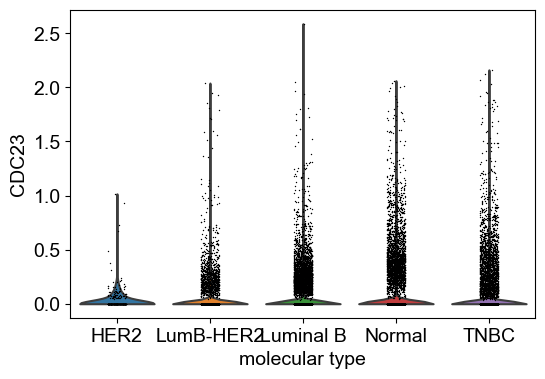

In [385]:
fig, ax = plt.subplots(figsize=(6,4))
sc.pl.violin(adata_Fepi, keys='CDC23', groupby='molecular_type', ax=ax)
fig.savefig(f'{figpath}/violin-CDC23.png', dpi=300, bbox_inches='tight')

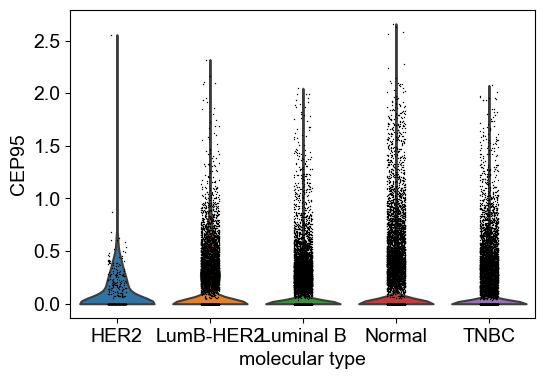

In [386]:
fig, ax = plt.subplots(figsize=(6,4))
sc.pl.violin(adata_Fepi, keys='CEP95', groupby='molecular_type', ax=ax)
fig.savefig(f'{figpath}/violin-CEP95.png', dpi=300, bbox_inches='tight')

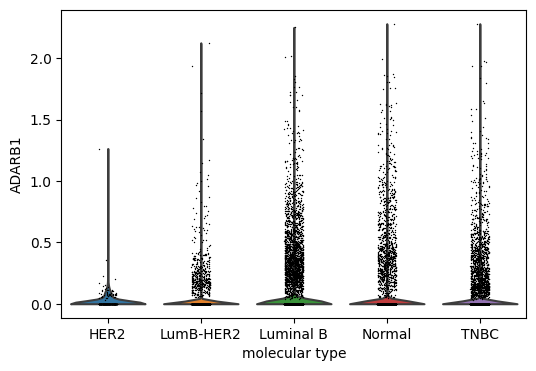

In [61]:
# useful for LumB-HER2: TRIM37,SKA2, YPEL2, 
# useful for LumB: ADARB1, POFUT2,
figpath = 'figure-5.7'
fig, ax = plt.subplots(figsize=(6,4))
sc.pl.violin(adata_Fepi, keys='ADARB1', groupby='molecular_type', ax=ax)
fig.savefig(f'{figpath}/violin-ADARB1.png', dpi=300, bbox_inches='tight')

In [233]:
barlabels

['2T_TNBC',
 '8T_TNBC',
 '9T_TNBC',
 '3T_TNBC',
 '15T_Luminal B',
 '21T_LumB-HER2',
 '10T_Luminal B',
 '20T_LumB-HER2',
 '17T_HER2',
 '6T_Luminal B',
 '22T_LumB-HER2',
 '5T_Luminal B',
 '1T_TNBC']

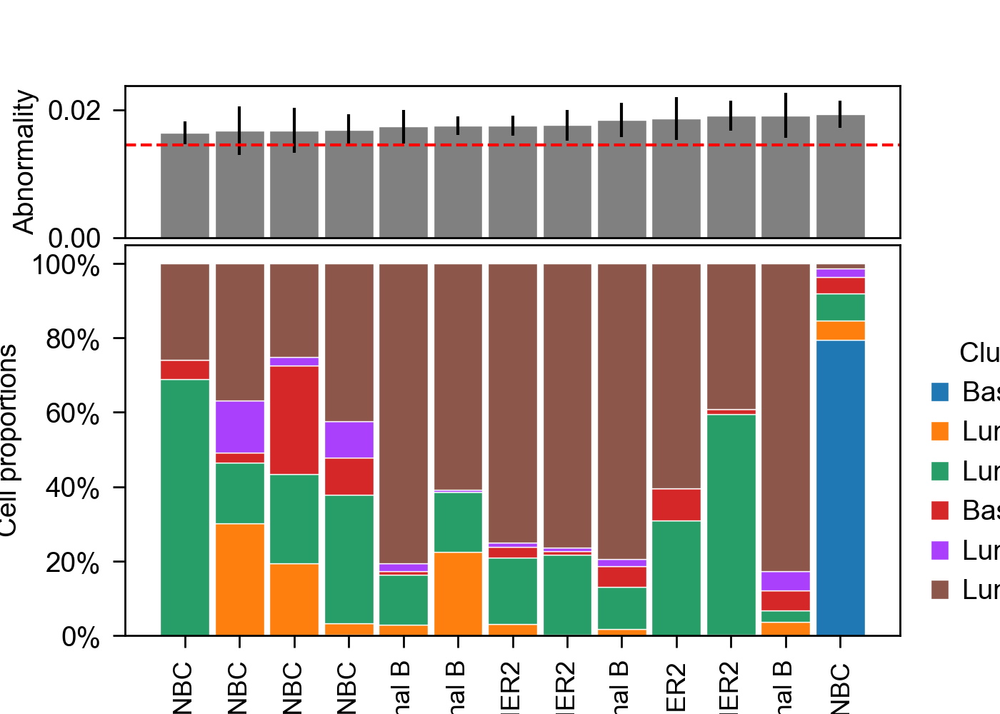

In [252]:
import matplotlib.gridspec as gridspec
adata_tumor.obs['epi-type'] = [f"{s.split(' ')[0]} {s.split(' ')[-1]}" for s in adata_tumor.obs['epi-subtype']]
fig = plt.figure(tight_layout=True, figsize=(7,5))
gs = gridspec.GridSpec(7, 1,hspace=0.1)
ax1 = fig.add_subplot(gs[:2, 0])
median = adata_tumor.obs.groupby('batch_mol').mean()['abnormality']
std = adata_tumor.obs.groupby('batch_mol').std()['abnormality']
df = pd.DataFrame([median, std], index=['median', 'std']).T
df = df.sort_values(by='median')
ax1.bar(x=list(df.index), height=df['median'], yerr=df['std'], color='gray',width=0.9, edgecolor='white', linewidth=0.5)
ax1.axhline(y=np.median(losses), color='red', linestyle="--", linewidth=1.5)
ax1.set_xticks([])
ax1.set_xticklabels([])
ax1.set_ylabel("Abnormality")
barlabels = list(df.index)
cell_types = adata_tumor.obs['epi-type'].unique()
age_df = pd.DataFrame(columns = list(cell_types))
for bar in barlabels:
    d1 = pd.DataFrame([len(adata_tumor[(adata_tumor.obs['epi-type'] == ct) & (adata_tumor.obs["batch_mol"] == bar)]) for ct in list(cell_types)], index = list(cell_types), columns=[bar]).T
    age_df = pd.concat([age_df, d1])
ax2 = fig.add_subplot(gs[2:, 0])
propPlot(age_df, ax2, title="Cluster Group")
fig.savefig(f"{figpath}/abnormality_proportion.png", dpi=300, bbox_inches='tight')

In [437]:
def propPlot(age_df, ax, colors=sc.pl.palettes.default_20, xlabel='Patient ID', show_y=True, xrotate=90, title=''):
    all_df = age_df.sum(axis=1)
    age_normdf = pd.DataFrame([age_df.loc[i,:]/all_df[i] for i in barlabels], index=barlabels)
    age_cumdf = pd.DataFrame([np.cumsum(age_normdf.loc[i,:]) for i in barlabels], index=barlabels)
    norm_gdfs = age_normdf
    cum_gdfs = age_cumdf
    for i, col in enumerate(age_df.columns):
        height = norm_gdfs[col]
        starts = cum_gdfs[col] - height
        rects = ax.bar(barlabels, height, bottom=starts, width=0.9, edgecolor='white', linewidth=0.5,
                        label=col, alpha=1)
    
        # ax.bar_label(rects,age_df.loc[:, col], label_type='center', color='lightgrey', fontsize=14)
    ax.legend( bbox_to_anchor=(1, 0),
              title=title, 
              handletextpad=0.5, frameon=False,
                          borderpad=0.6,
                          columnspacing=1.3,
                          handlelength=0.65,
              loc='lower left', fontsize=14)
    if show_y:
        ax.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1,decimals=0))
        ax.set_ylabel('Cell proportions')
    else:
        ax.yaxis.set_visible(False)
        ax.spines.left.set_visible(False)
    ax.set_xlabel(xlabel)
    ax.set_xticks(barlabels)
    ax.set_xticklabels(labels=barlabels,rotation=xrotate,fontsize=13)

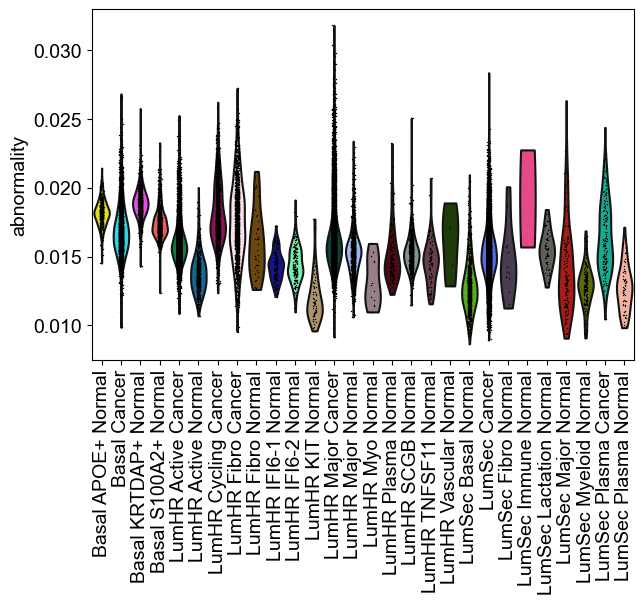

In [311]:
sc.pl.violin(adata_tumor, 'abnormality', 'epi-subtype', rotation=90)

/tmp/ipykernel_724992/3176512184.py:21: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_normal.obs['vscore'] = nlosses


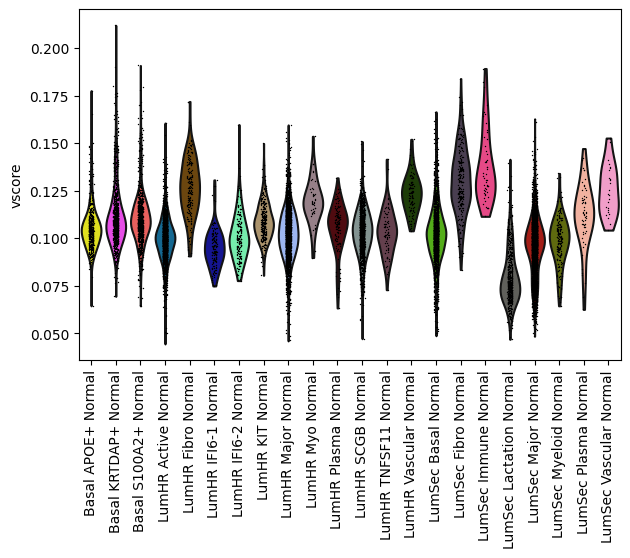

In [155]:
adata_normal = adata_train[adata_train.obs['cnv_status'] == 'Normal', :]
scdataset = adata_normal.X.todense()
scdataset = np.asarray(scdataset)
scaler = MinMaxScaler()
scdataset = scaler.fit_transform(scdataset)
dataset = torch.from_numpy(np.array(scdataset))
data_loader = Data.DataLoader(dataset=dataset,
                              batch_size=1,
                              shuffle=False)
nlosses = np.zeros(len(adata_normal))
with torch.no_grad():
    for i, x in enumerate(data_loader):
        x = x.to(device).view(-1, count_size)
        out, _, _ = nmodel(x)
        reconst_loss = F.binary_cross_entropy(out, x, reduction='mean')
        kl_div = - 0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp())

        loss = reconst_loss + kl_div
        loss = loss.cpu().numpy()
        nlosses[i] = loss
adata_normal.obs['vscore'] = nlosses
sc.pl.violin(adata_normal, 'vscore', 'epi-subtype', rotation=90)

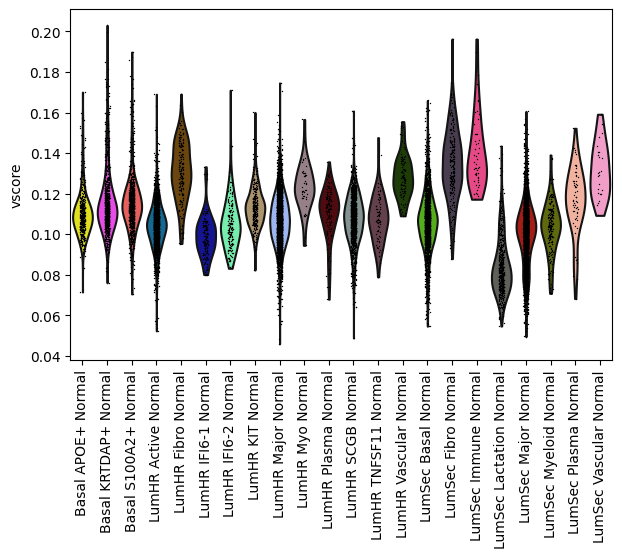

In [99]:
sc.pl.violin(adata_normal, 'vscore', 'epi-subtype', rotation=90)

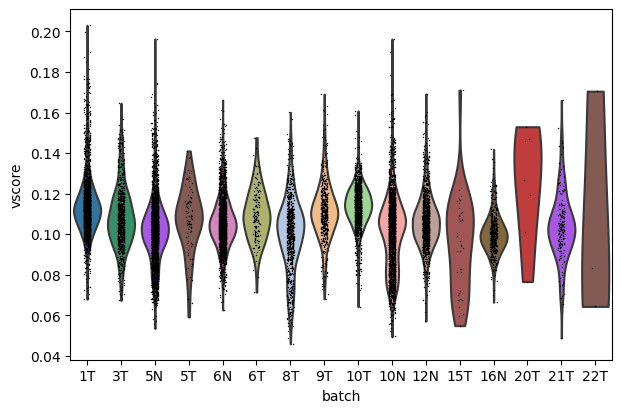

In [100]:
sc.pl.violin(adata_normal, 'vscore', 'batch')

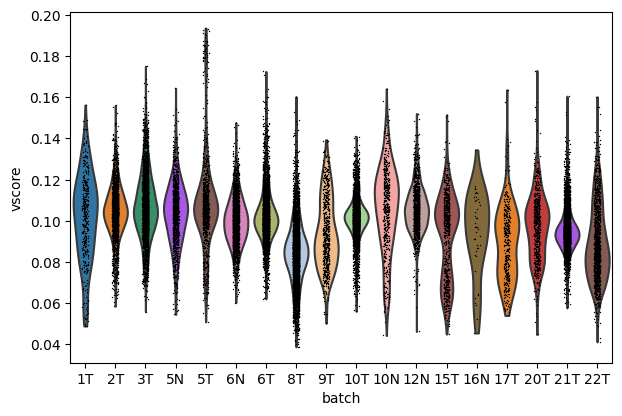

In [101]:
sc.pl.violin(adata_tumor, 'vscore', 'epi-subtype', rotation=90, show=True)

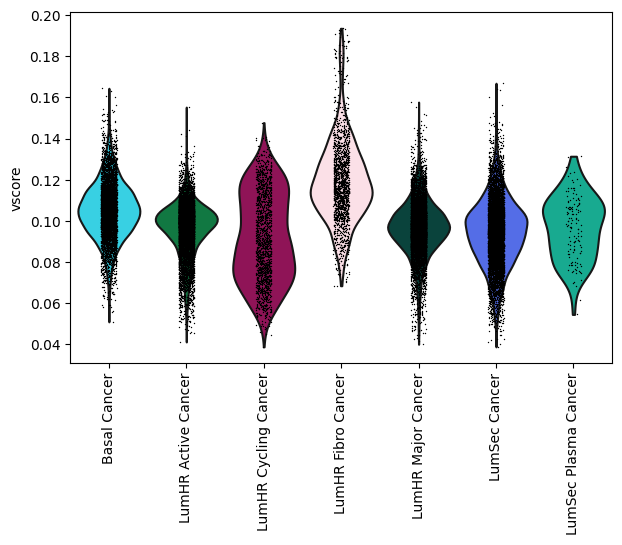

In [102]:
sc.pl.violin(adata_tumor, 'vscore', 'epi-subtype', rotation=90, show=True)

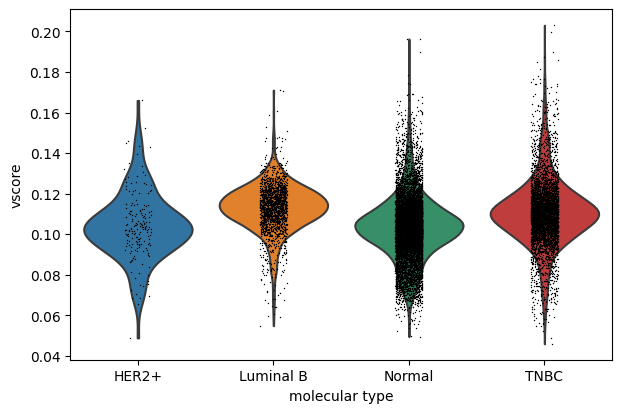

In [110]:
sc.pl.violin(adata_normal, 'vscore', 'molecular_type', show=True)

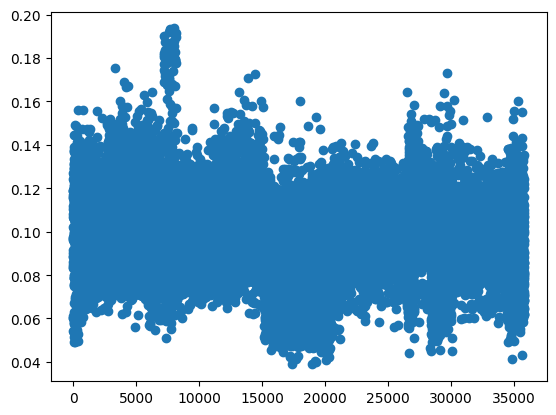

In [88]:
plt.scatter(x=np.arange(len(losses)), y=losses)

In [114]:
adata_epi_cnv.uns['cnv']

{'chr_pos': {'chr1': 0,
  'chr2': 383,
  'chr3': 656,
  'chr4': 874,
  'chr5': 1033,
  'chr6': 1225,
  'chr7': 1436,
  'chr8': 1635,
  'chr9': 1787,
  'chr10': 1941,
  'chr11': 2096,
  'chr12': 2310,
  'chr13': 2525,
  'chr14': 2608,
  'chr15': 2748,
  'chr16': 2894,
  'chr17': 3074,
  'chr18': 3298,
  'chr19': 3377,
  'chr20': 3604,
  'chr21': 3703,
  'chr22': 3757}}

In [115]:
adata_epi_cnv

AnnData object with n_obs × n_vars = 53019 × 39735
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'leiden-epi-harmony', 'cnv_status', 'cnv_score', 'epi-subtype', 'cnv_leiden'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'symbol', 'ensg', 'chromosome', 'start', 'end'
    uns: 'batch_colors', 'cnv_status_colors', 'dendrogram_leiden', 'epi-subtype_colors', 'gender_colors', 'hvg', 'leiden', 'leiden-epi-harmony_colors', 'leiden-harmony-female_colors', 'leiden_colors', 'leiden_harmony_colors', 'log1p', 'majorType-Female_colors', 'major_type_colors'

In [90]:
adata_tumor.obs['vscore'] = losses

/tmp/ipykernel_724992/2716252036.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_tumor.obs['vscore'] = losses


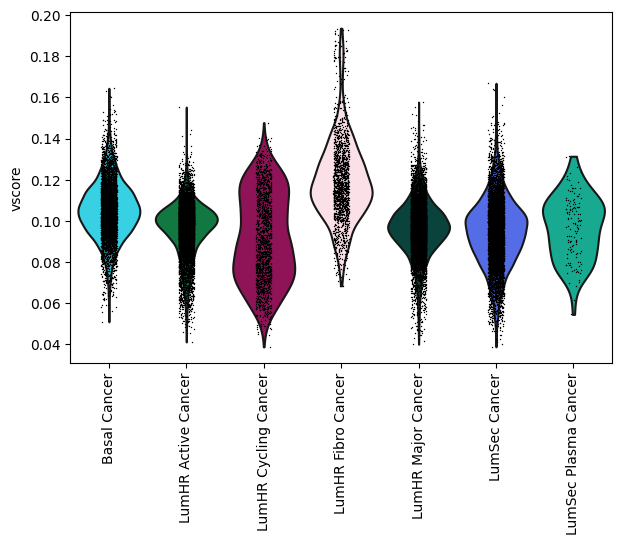

In [105]:
sc.pl.violin(adata_tumor, 'vscore', 'epi-subtype', rotation=90)

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


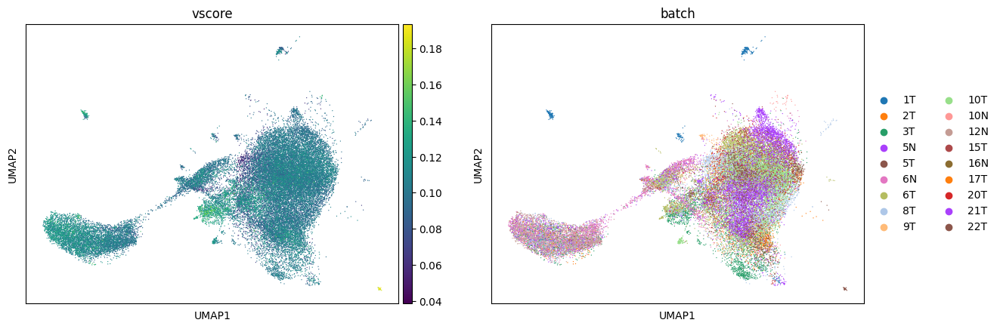

In [109]:
# train for normal epi only
sc.pl.umap(adata_tumor, color=['vscore', 'batch'])

In [293]:
cnv.tl.infercnv(adata_epi_cnv,reference_key="molecular_type", reference_cat=['Normal'], n_jobs=8, window_size=150, step=100)

  0%|          | 0/11 [00:00<?, ?it/s]

In [218]:
adata_epi_cnv.uns['cnv']

{'chr_pos': {'chr1': 0,
  'chr2': 383,
  'chr3': 656,
  'chr4': 874,
  'chr5': 1033,
  'chr6': 1225,
  'chr7': 1436,
  'chr8': 1635,
  'chr9': 1787,
  'chr10': 1941,
  'chr11': 2096,
  'chr12': 2310,
  'chr13': 2525,
  'chr14': 2608,
  'chr15': 2748,
  'chr16': 2894,
  'chr17': 3074,
  'chr18': 3298,
  'chr19': 3377,
  'chr20': 3604,
  'chr21': 3703,
  'chr22': 3757}}

In [142]:
chr5 = adata_epi_cnv.var[adata_epi_cnv.var['chromosome'] == 'chr5']
chr5 = chr5.sort_values(by='start')
chr5

,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,symbol,ensg,chromosome,start,end
AC113430.1,9,0.000034,0.000034,99.996628,9.0,2.302585,9,False,0.000017,-0.344213,-1.475275,AC113430.1,ENSG00000250020,chr5,58198,58915
PLEKHG4B,7488,0.038982,0.038242,97.194896,10406.0,9.250234,7488,True,0.017237,0.894434,0.564877,PLEKHG4B,ENSG00000153404,chr5,92151,189972
LRRC14B,211,0.000873,0.000872,99.920957,233.0,5.455321,211,False,0.000398,0.856887,0.503033,LRRC14B,ENSG00000185028,chr5,191495,196334
CCDC127,23129,0.102981,0.098017,91.335571,27490.0,10.221614,23129,False,0.056448,0.414065,-0.226330,CCDC127,ENSG00000164366,chr5,196868,218153
AC021087.3,826,0.003203,0.003198,99.690569,855.0,6.752270,826,False,0.001952,0.672556,0.199426,AC021087.3,ENSG00000260774,chr5,213898,217279
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TRIM52,18526,0.077189,0.074355,93.059916,20605.0,9.933337,18526,False,0.064431,0.798190,0.406355,TRIM52,ENSG00000183718,chr5,181254417,181261139
TRIM52-AS1,18248,0.077238,0.074400,93.164058,20618.0,9.933969,18248,False,0.051554,0.576016,0.040416,TRIM52-AS1,ENSG00000248275,chr5,181261169,181272307
AC008443.7,258,0.000993,0.000992,99.903350,265.0,5.583496,258,False,0.000779,0.704450,0.251957,AC008443.7,ENSG00000286310,chr5,181276848,181277555
AC008443.2,22,0.000082,0.000082,99.991759,22.0,3.135494,22,False,0.000062,0.572427,0.034506,AC008443.2,ENSG00000248103,chr5,181281375,181283652


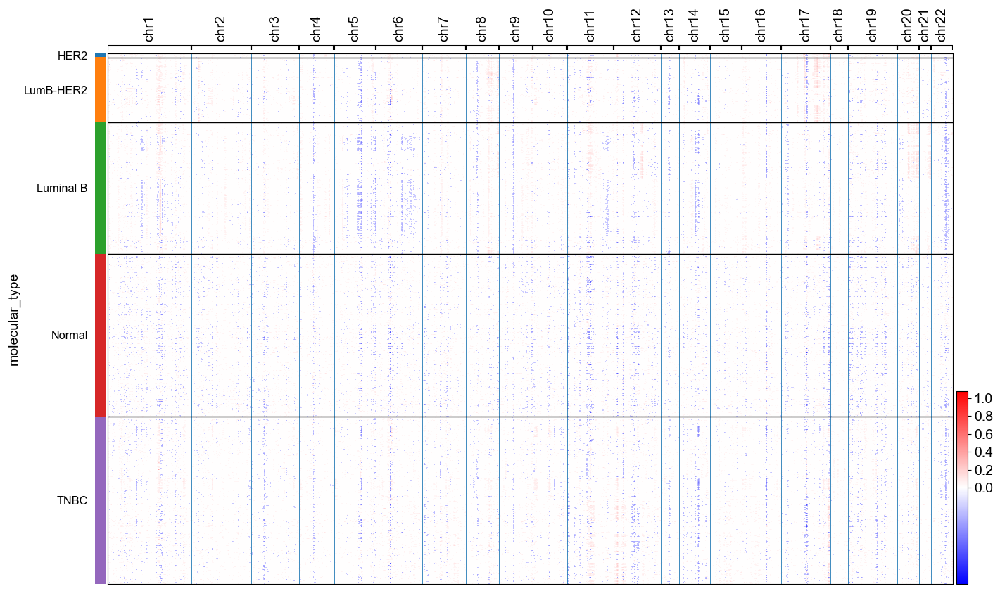

In [388]:
cnv.pl.chromosome_heatmap(adata_epi_cnv, groupby='molecular_type', save='cnv1.png')

In [220]:
adata_epi_cnv.write_h5ad("/data/xwt/adata-epi2.h5ad")

In [390]:
import cellphonedb

In [1]:
import gseapy as gp
from gseapy import Msigdb
msig = Msigdb()
# mouse hallmark gene sets
gmt = msig.get_gmt(category='mh.all', dbver="2023.2.Hs")
gmt

In [3]:
adata_Fepi = sc.read_h5ad("adata-Fepi1.h5ad")

In [11]:
np.array(gp.get_library_name(organism='Human'))

array(['ARCHS4_Cell-lines', 'ARCHS4_IDG_Coexp', 'ARCHS4_Kinases_Coexp',
       'ARCHS4_TFs_Coexp', 'ARCHS4_Tissues', 'Achilles_fitness_decrease',
       'Achilles_fitness_increase', 'Aging_Perturbations_from_GEO_down',
       'Aging_Perturbations_from_GEO_up',
       'Allen_Brain_Atlas_10x_scRNA_2021', 'Allen_Brain_Atlas_down',
       'Allen_Brain_Atlas_up', 'Azimuth_2023', 'Azimuth_Cell_Types_2021',
       'BioCarta_2013', 'BioCarta_2015', 'BioCarta_2016',
       'BioPlanet_2019', 'BioPlex_2017', 'CCLE_Proteomics_2020', 'CORUM',
       'COVID-19_Related_Gene_Sets', 'COVID-19_Related_Gene_Sets_2021',
       'Cancer_Cell_Line_Encyclopedia', 'CellMarker_2024',
       'CellMarker_Augmented_2021', 'ChEA_2013', 'ChEA_2015', 'ChEA_2016',
       'ChEA_2022', 'Chromosome_Location', 'Chromosome_Location_hg19',
       'ClinVar_2019', 'DSigDB',
       'Data_Acquisition_Method_Most_Popular_Genes',
       'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019',
       'DepMap_WG_CRISPR_Screens_Sanger_CellL

In [14]:
import time
t1 = time.time()
# NOTE: To speed up, use gp.prerank instead with your own ranked list.
res = gp.gsea(data=adata_Fepi.to_df().T, # row -> genes, column-> samples
        gene_sets="KEGG_2021_Human",
        cls=adata_Fepi.obs['cnv_status'],
        permutation_num=1000,
        permutation_type='phenotype',
        outdir=None,
        method='s2n', # signal_to_noise
        threads= 16)
t2=time.time()
print(t2-t1)

2198.790207386017


In [225]:
gsva_kegg = gp.gsva(data=adata_Fepi.to_df().T,
             gene_sets="KEGG_2021_Human",
             outdir=None)

In [ ]:
ssgsea_kegg = gp.ssgsea(data=adata_Fepi.to_df().T,
             gene_sets="KEGG_2021_Human",
             outdir=None)

In [62]:
# useful for LumB-HER2: TRIM37,SKA2, YPEL2, 
# useful for LumB: ADARB1, POFUT2,
import gseapy as gp
gsva_epi = gp.gsva(data=adata_Fepi.to_df().T,
             gene_sets={'LumB-HER2':['TRIM37', 'SKA2', 'YPEL2', 'DDX5', 'CEP95'], 'LumB':['ADARB1', 'POFUT2']},
             min_size=1,
             outdir=None)

KeyboardInterrupt: 

In [71]:
sc.tl.score_genes(adata_Fepi, gene_list=['ADARB1', 'POFUT2'], score_name="LumB")

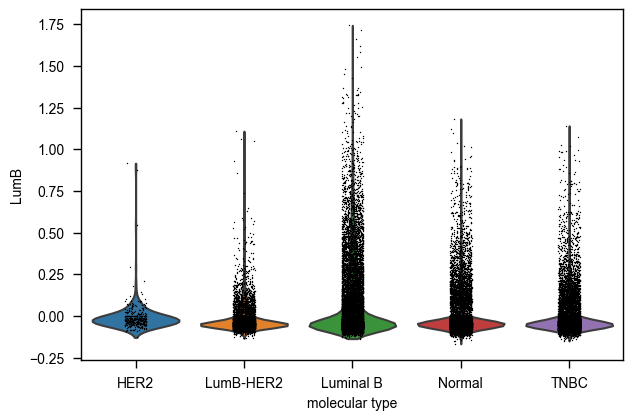

In [81]:
sc.pl.violin(adata_Fepi, keys=['LumB'], groupby='molecular_type',title="Enrichment Score")

In [135]:
import time
t1 = time.time()
# NOTE: To speed up, use gp.prerank instead with your own ranked list.
res_gobp = gp.gsea(data=adata_Fepi.to_df().T, # row -> genes, column-> samples
        gene_sets='GO_Biological_Process_2023',
        cls=adata_Fepi.obs['cnv_status'],
        permutation_num=1000,
        permutation_type='phenotype',
        outdir=None,
        method='s2n', # signal_to_noise
        threads= 16)
t2=time.time()
print(t2-t1)

2582.8111033439636


In [136]:
import time
t1 = time.time()
# NOTE: To speed up, use gp.prerank instead with your own ranked list.
res_gocc = gp.gsea(data=adata_Fepi.to_df().T, # row -> genes, column-> samples
        gene_sets='GO_Cellular_Component_2023',
        cls=adata_Fepi.obs['cnv_status'],
        permutation_num=1000,
        permutation_type='phenotype',
        outdir=None,
        method='s2n', # signal_to_noise
        threads= 16)
t2=time.time()
print(t2-t1)

2222.5603597164154


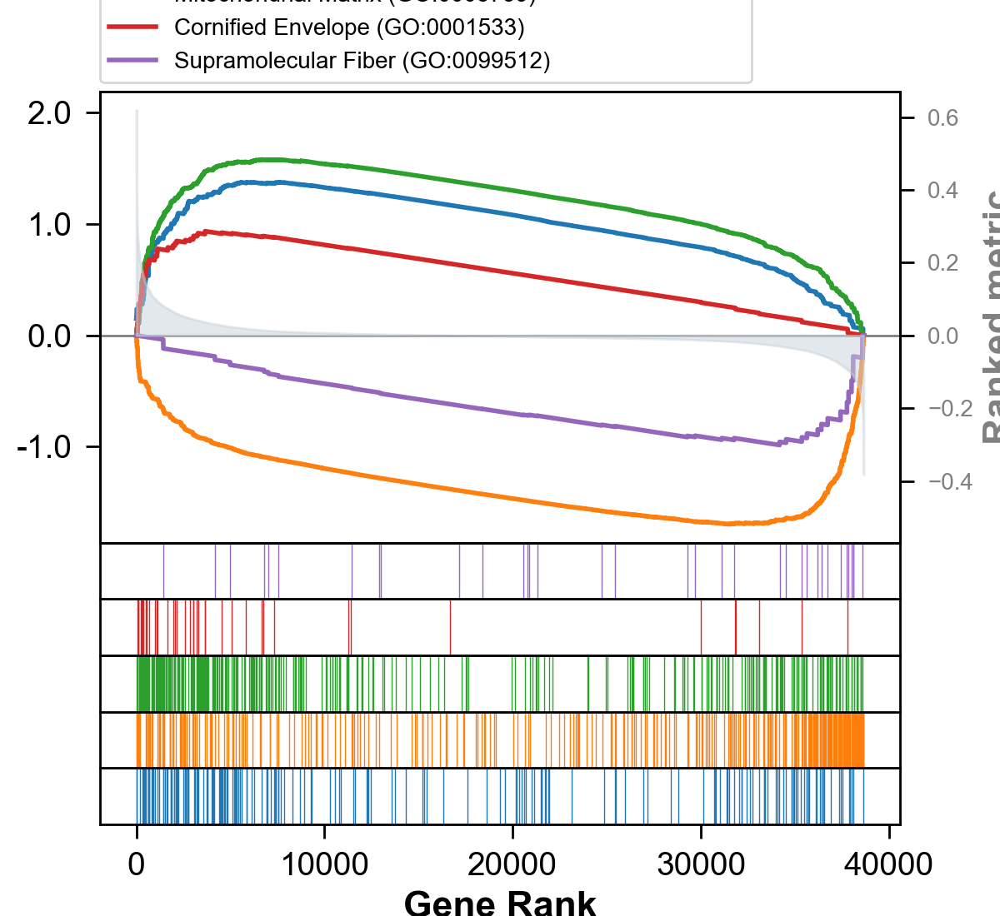

In [165]:
term = res_gocc.res2d.Term
# gp.gseaplot(res.ranking, term=term[i], **res.results[term[i]])
axs = res_gocc.plot(terms=term[:5])
axs.figure.savefig(f'{figpath}/gocc_top5.png', bbox_inches='tight', dpi=300)

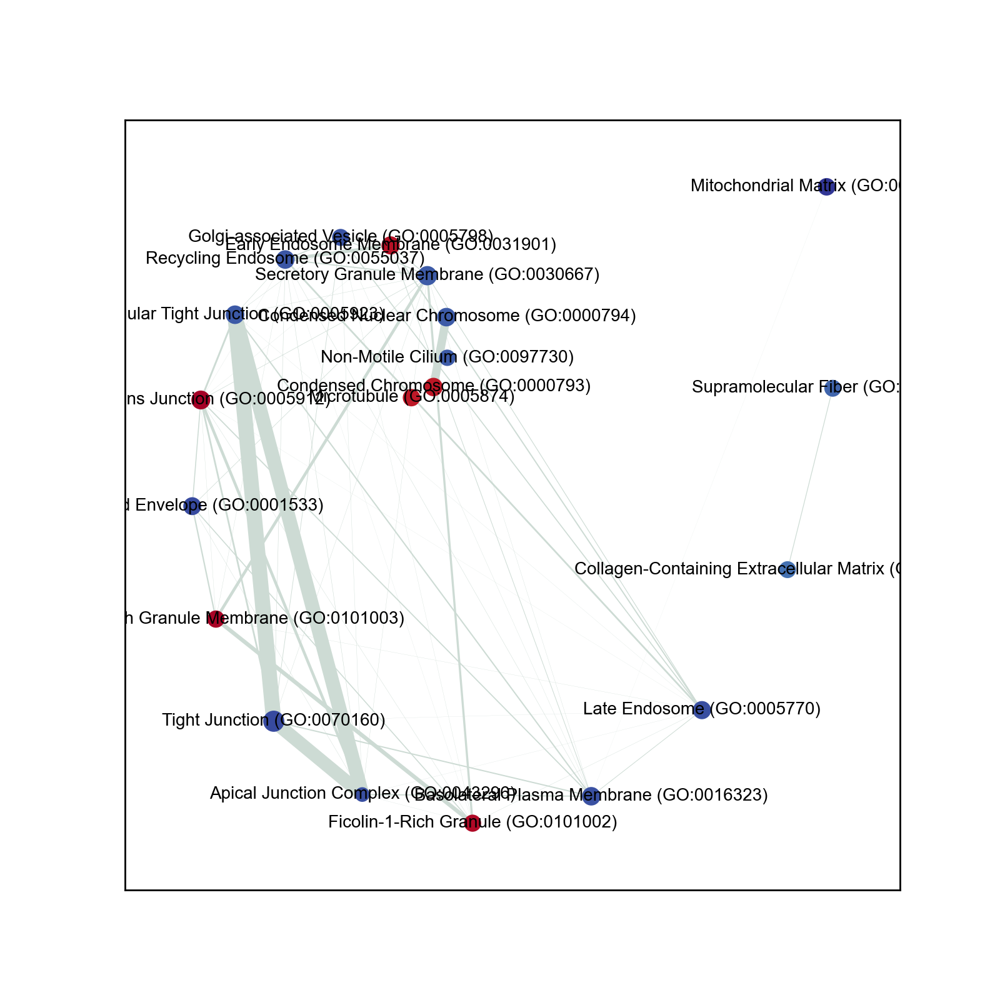

In [221]:
nodes, edges = gp.enrichment_map(res_gocc.res2d, top_term=20)
# build graph
G = nx.from_pandas_edgelist(edges,
                            source='src_idx',
                            target='targ_idx',
                            edge_attr=['jaccard_coef', 'overlap_coef', 'overlap_genes'])

fig, ax = plt.subplots(figsize=(8, 8))

# init node cooridnates
pos=nx.layout.spiral_layout(G)
#node_size = nx.get_node_attributes()
# draw node
nx.draw_networkx_nodes(G,
                       ax=ax,
                       pos=pos,
                       cmap=plt.cm.RdYlBu,
                       node_color=list(nodes.NES),
                       node_size=list(nodes.Hits_ratio *200))
# draw node label
nx.draw_networkx_labels(G,
                        ax=ax,
                        font_size=10,
                        pos=pos,
                        labels=nodes.Term.to_dict())
# draw edge
edge_weight = nx.get_edge_attributes(G, 'jaccard_coef').values()
nx.draw_networkx_edges(G,
                       pos=pos,
                       ax=ax,
                       width=list(map(lambda x: x*10, edge_weight)),
                       edge_color='#CDDBD4')
fig.savefig(f"{figpath}/gocc_network.png", dpi=300, bbox_inches='tight')


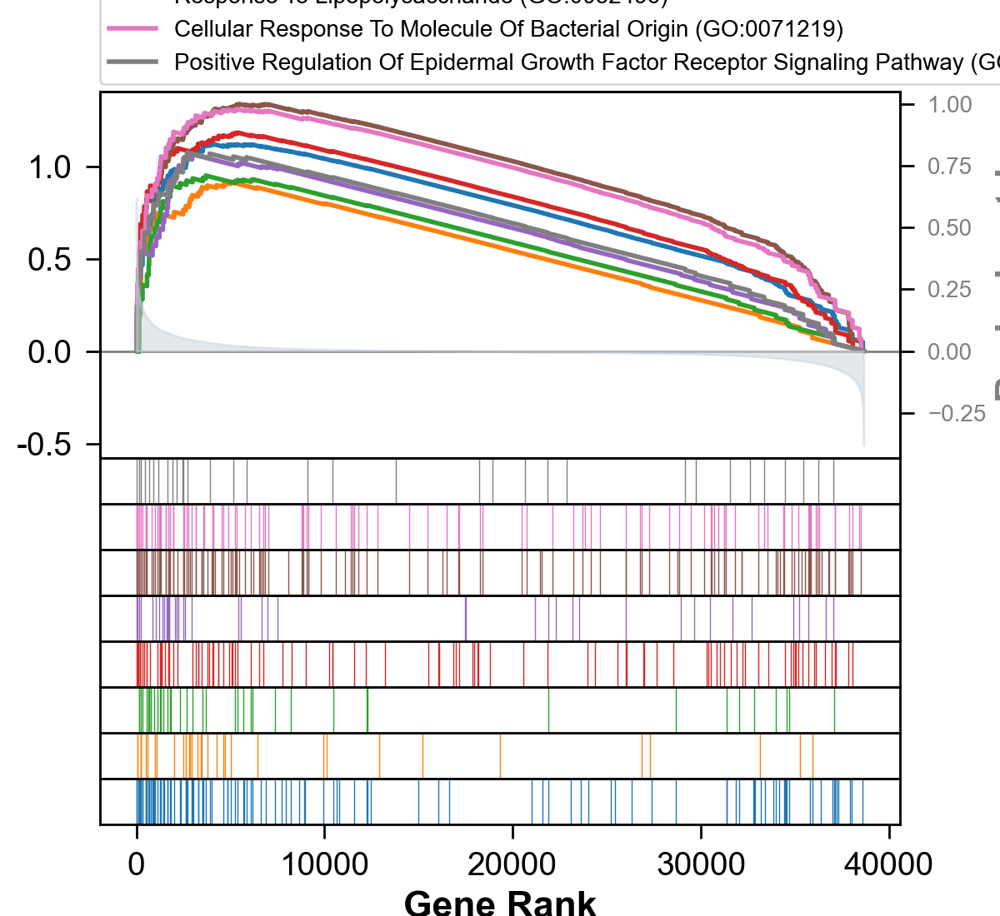

In [163]:
term = res_gobp.res2d.Term
# gp.gseaplot(res.ranking, term=term[i], **res.results[term[i]])
axs = res_gobp.plot(terms=term[:8])
axs.figure.savefig(f'{figpath}/gobp_top8.png', bbox_inches='tight', dpi=300)

In [137]:
import time
t1 = time.time()
# NOTE: To speed up, use gp.prerank instead with your own ranked list.
res_gomf = gp.gsea(data=adata_Fepi.to_df().T, # row -> genes, column-> samples
        gene_sets='GO_Molecular_Function_2023',
        cls=adata_Fepi.obs['cnv_status'],
        permutation_num=1000,
        permutation_type='phenotype',
        outdir=None,
        method='s2n', # signal_to_noise
        threads= 16)
t2=time.time()
print(t2-t1)

2178.3612496852875


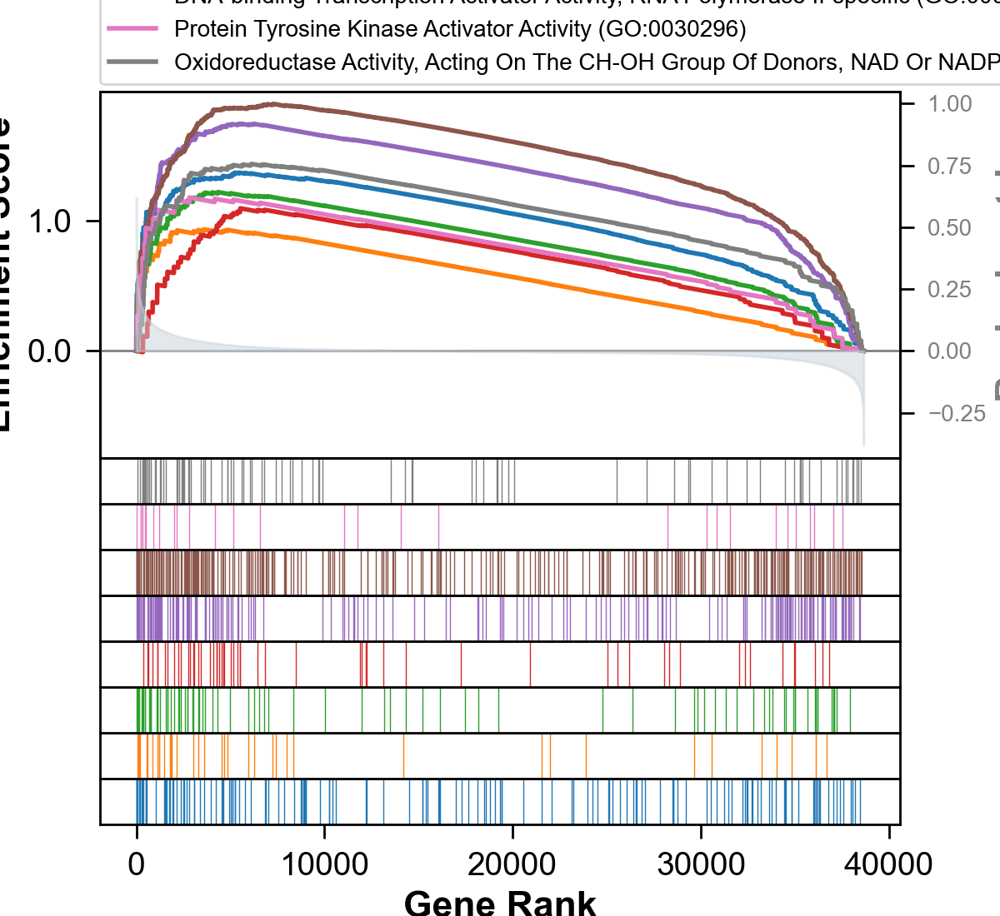

In [167]:
term = res_gomf.res2d.Term
# gp.gseaplot(res.ranking, term=term[i], **res.results[term[i]])
axs = res_gomf.plot(terms=term[:8])
axs.figure.savefig(f'{figpath}/gomf_top8.png', bbox_inches='tight', dpi=300)

In [138]:
import time
t1 = time.time()
# NOTE: To speed up, use gp.prerank instead with your own ranked list.
res_ag = gp.gsea(data=adata_Fepi.to_df().T, # row -> genes, column-> samples
        gene_sets='GTEx_Aging_Signatures_2021',
        cls=adata_Fepi.obs['cnv_status'],
        permutation_num=1000,
        permutation_type='phenotype',
        outdir=None,
        method='s2n', # signal_to_noise
        threads= 16)
t2=time.time()
print(t2-t1)

2168.6573688983917


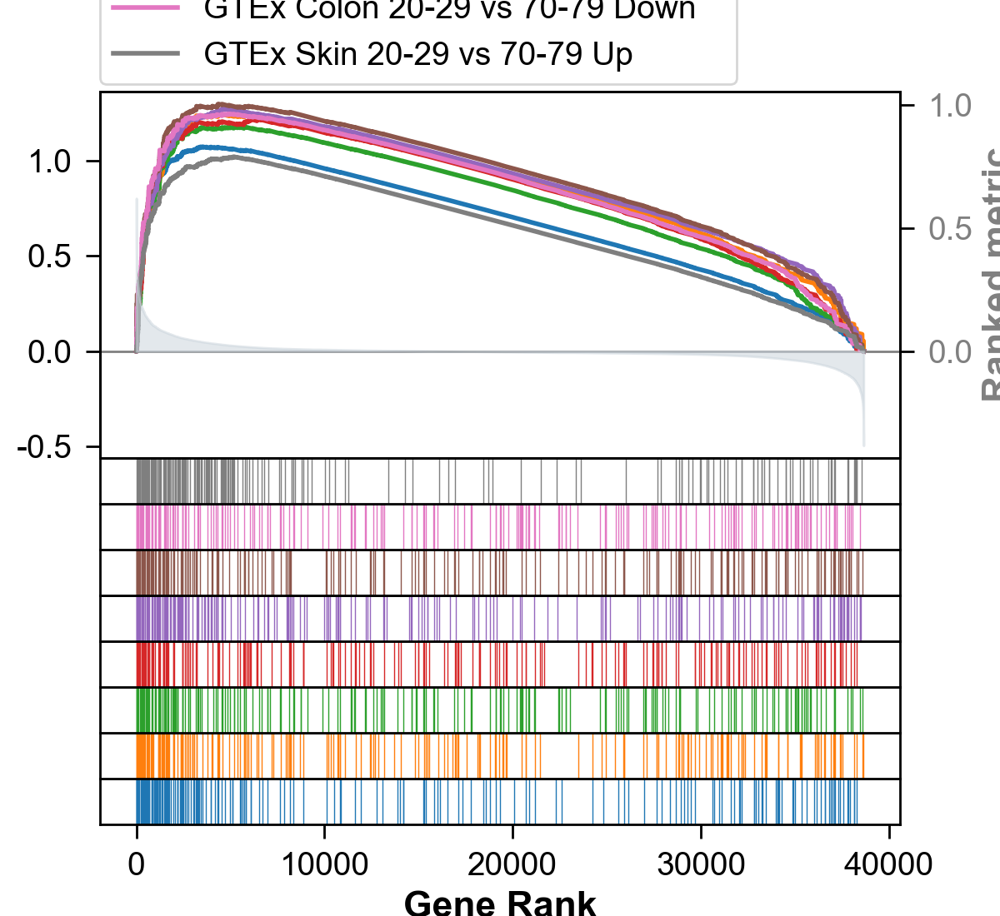

In [224]:
term = res_ag.res2d.Term
# gp.gseaplot(res.ranking, term=term[i], **res.results[term[i]])
axs = res_ag.plot(terms=term[:8])
axs.figure.savefig(f'{figpath}/ag_top8.png', bbox_inches='tight', dpi=300)

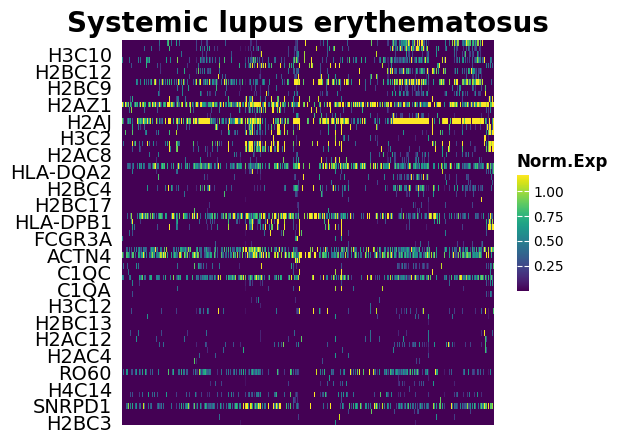

In [21]:
i = 0
genes = res.res2d.Lead_genes.iloc[i].split(";")
ax = gp.heatmap(df = res.heatmat.loc[genes],
           z_score=None,
           title=res.res2d.Term.iloc[i],
           figsize=(6,5),
           cmap=plt.cm.viridis,
           xticklabels=False)

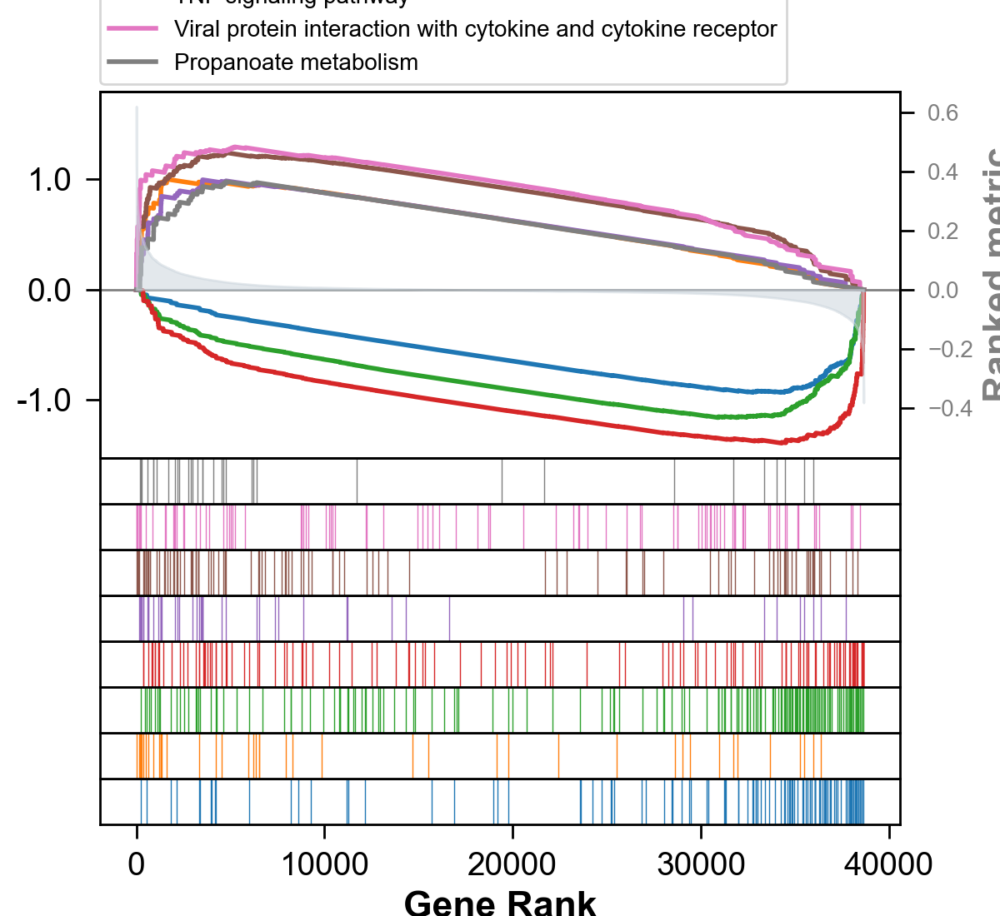

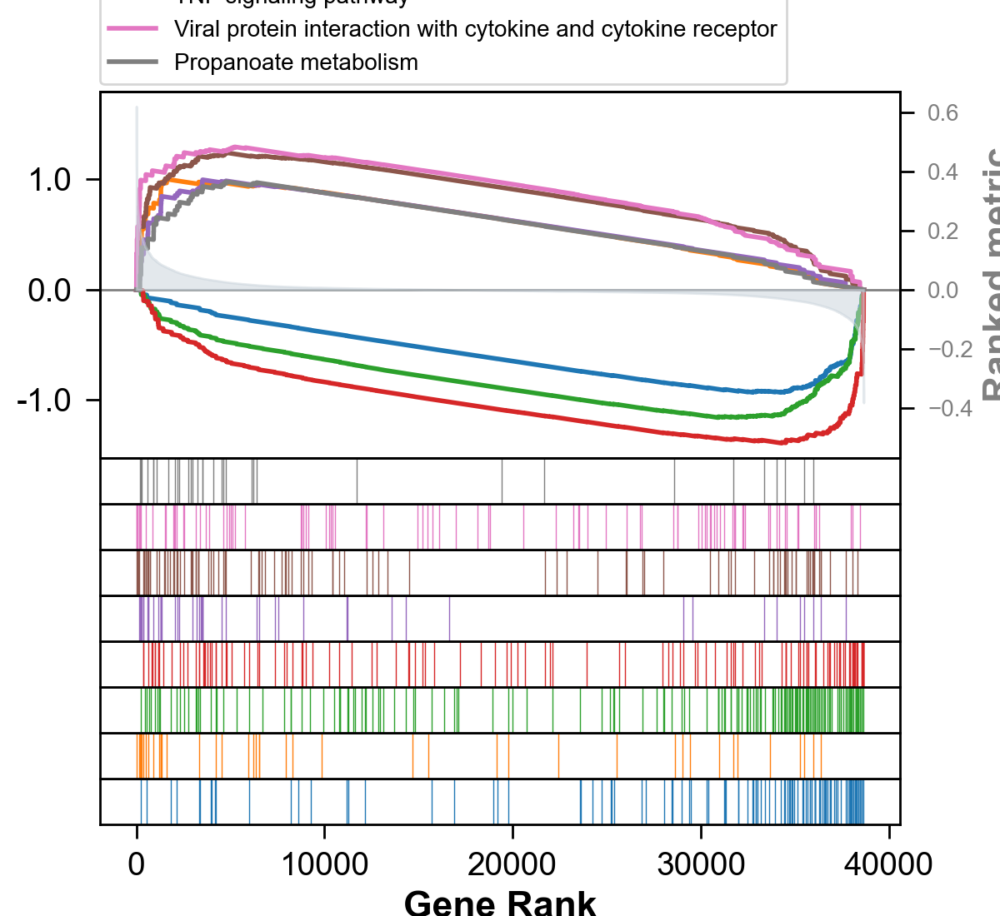

In [143]:
term = res.res2d.Term
# gp.gseaplot(res.ranking, term=term[i], **res.results[term[i]])
axs = res.plot(terms=term[:8])

In [63]:
axs.figure.savefig(f"{figpath}/KEGG.png", dpi=300, bbox_inches="tight")

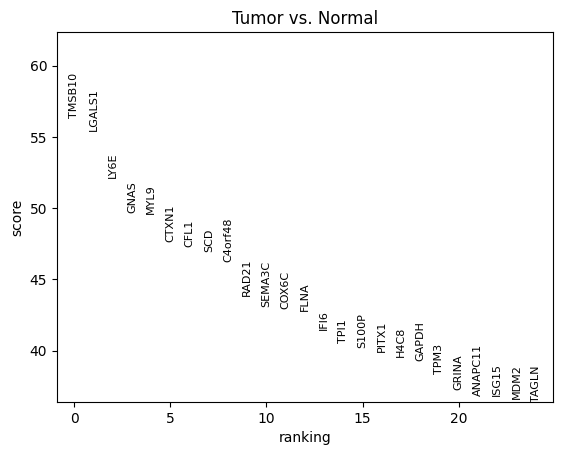

In [64]:
sc.pl.rank_genes_groups(adata_Fepi, n_genes=25, sharey=False, save='TvN.svg')

In [41]:
# get deg result
result = adata_Fepi.uns['rank_genes_groups']
groups = result['names'].dtype.names
degs = pd.DataFrame(
    {group + '_' + key: result[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})
# subset up or down regulated genes
degs_sig = degs[degs.Tumor_pvals_adj < 0.05]
degs_up = degs_sig[degs_sig.Tumor_logfoldchanges > 0]
degs_dw = degs_sig[degs_sig.Tumor_logfoldchanges < 0]

In [42]:
enr_up = gp.enrichr(degs_up.Tumor_names,
                    gene_sets='KEGG_2021_Human',
                    outdir=None)

In [26]:
sc.tl.rank_genes_groups(adata_Fepi,
                        groupby='cnv_status',
                        use_raw=False,
                        method='wilcoxon',
                        groups=["Tumor"],
                        reference='Normal')

In [168]:
enr_up = gp.enrichr(degs_up.Tumor_names,
                    gene_sets='KEGG_2021_Human',
                    outdir=None)
cc_up = gp.enrichr(degs_up.Tumor_names,
                    gene_sets='GO_Cellular_Component_2023',
                    outdir=None)
bp_up = gp.enrichr(degs_up.Tumor_names,
                    gene_sets='GO_Biological_Process_2023',
                    outdir=None)
mf_up = gp.enrichr(degs_up.Tumor_names,
                    gene_sets='GO_Molecular_Function_2023',
                    outdir=None)

In [191]:
go_res = pd.concat([cc_up.res2d.head(15), bp_up.res2d.head(10), mf_up.res2d.head(5)])

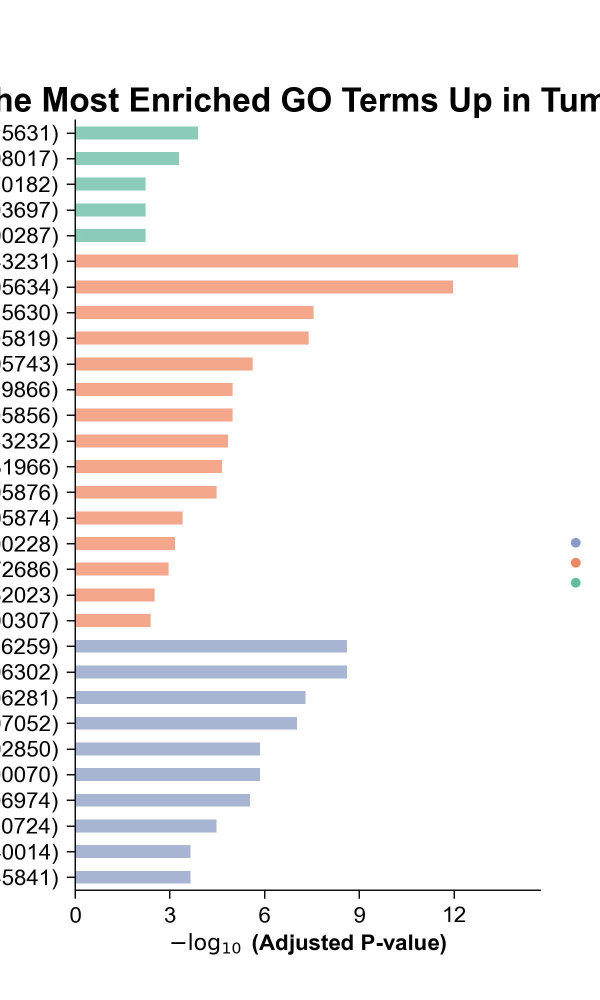

In [194]:
go_res = pd.concat([cc_up.res2d.head(15), bp_up.res2d.head(10), mf_up.res2d.head(5)])
ax = gp.barplot(go_res, figsize=(6,10),
                group ='Gene_set',
                top_term=15,
                color = ['#8b9cc4', '#f08961', '#62bb9f'],
                title ="The Most Enriched GO Terms Up in Tumor")
ax.figure.savefig(f"{figpath}/go_up.png", bbox_inches='tight', dpi=300)

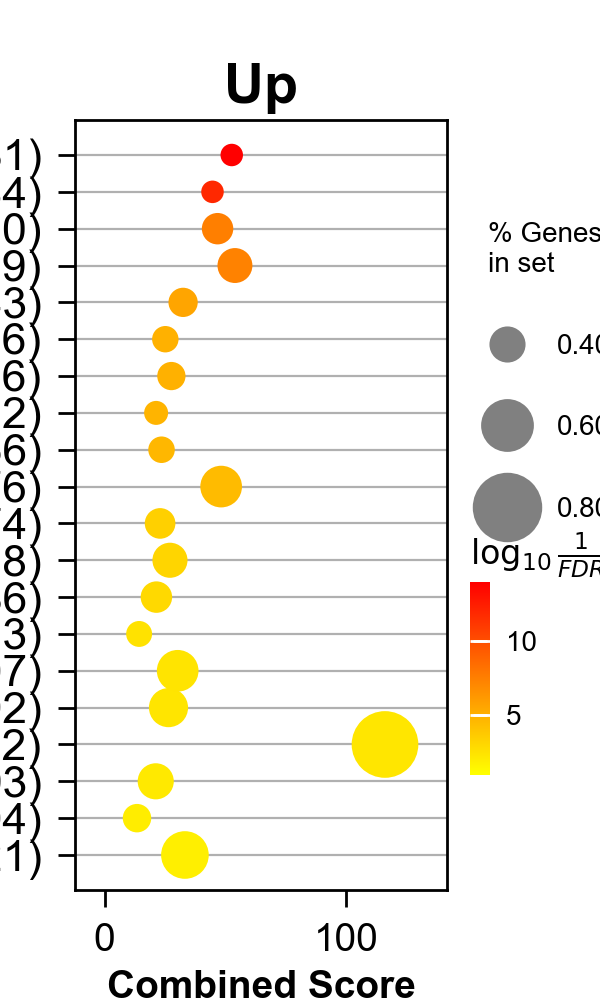

In [171]:
ax = gp.dotplot(cc_up.res2d, figsize=(3,5), title="Up", cmap = plt.cm.autumn_r, top_term=20)
ax.figure.savefig(f"{figpath}/gocc_up.png", bbox_inches='tight', dpi=300)

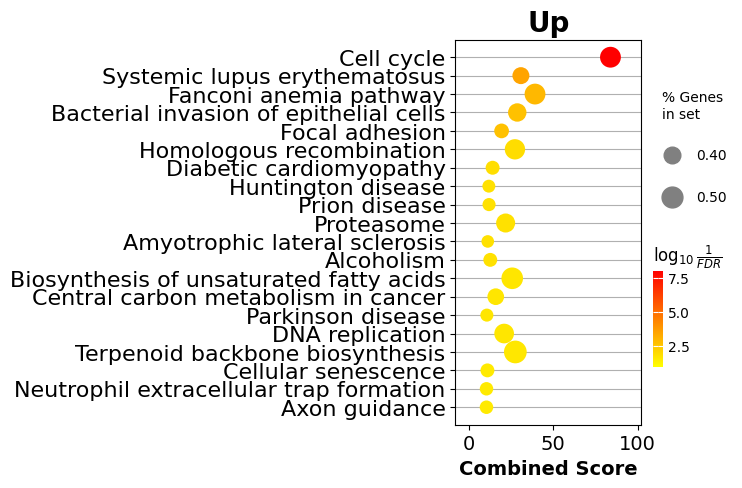

In [93]:
ax = gp.dotplot(enr_up.res2d, figsize=(3,5), title="Up", cmap = plt.cm.autumn_r, top_term=20)
ax.figure.savefig(f"{figpath}/KEGG_up.svg", bbox_inches='tight')

In [91]:
enr_up.res2d[enr_up.res2d['Term']=='Neutrophil extracellular trap formation']

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,UP_DW
18,KEGG_2021_Human,Neutrophil extracellular trap formation,61/189,0.001527,0.025475,0,0,1.631314,10.577847,H2AW;HDAC11;ITGB2;HMGB1;H2AC15;H2AC16;ACTB;H2A...,UP


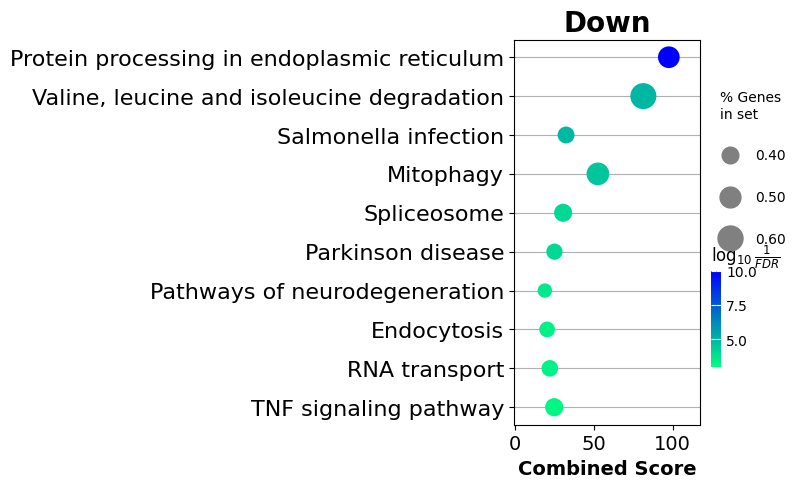

In [69]:
enr_dw = gp.enrichr(degs_dw.Tumor_names,
                    gene_sets='KEGG_2021_Human',
                    outdir=None)

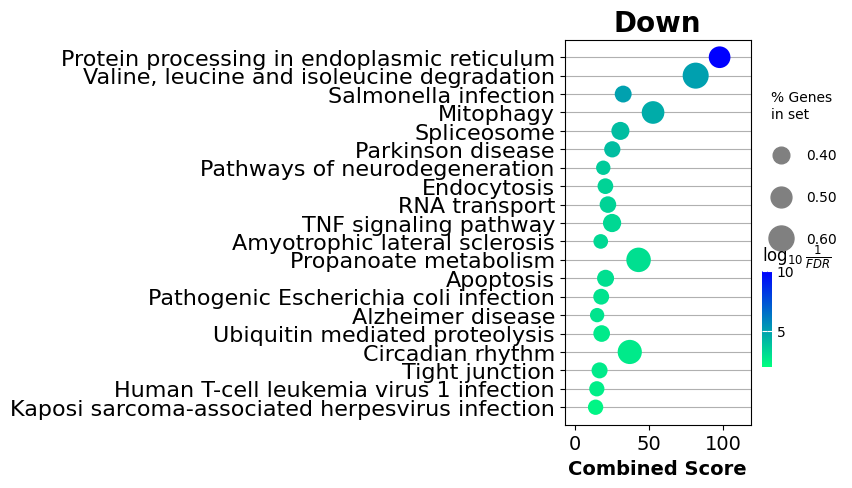

In [99]:
ax=gp.dotplot(enr_dw.res2d,
           figsize=(3,5),
           title="Down",
           cmap = plt.cm.winter_r,
           top_term=20,
           size=5)
ax.figure.savefig(f"{figpath}/KEGG_down.svg",bbox_inches='tight')

In [46]:
enr_up.res2d['UP_DW'] = "UP"
enr_dw.res2d['UP_DW'] = "DOWN"
enr_res = pd.concat([enr_up.res2d.head(), enr_dw.res2d.head()])

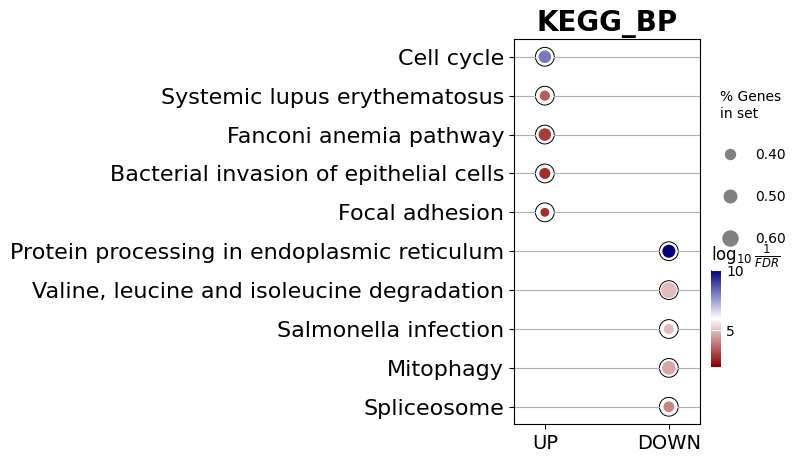

In [70]:
from gseapy.scipalette import SciPalette
sci = SciPalette()
NbDr = sci.create_colormap()
# display multi-datasets
ax = gp.dotplot(enr_res,figsize=(3,5),
                x='UP_DW',
                x_order = ["UP","DOWN"],
                title="KEGG_BP",
                cmap = NbDr.reversed(),
                size=3,
                show_ring=True)
ax.set_xlabel("")
ax.figure.savefig(f"{figpath}/KEGG_BP.svg")

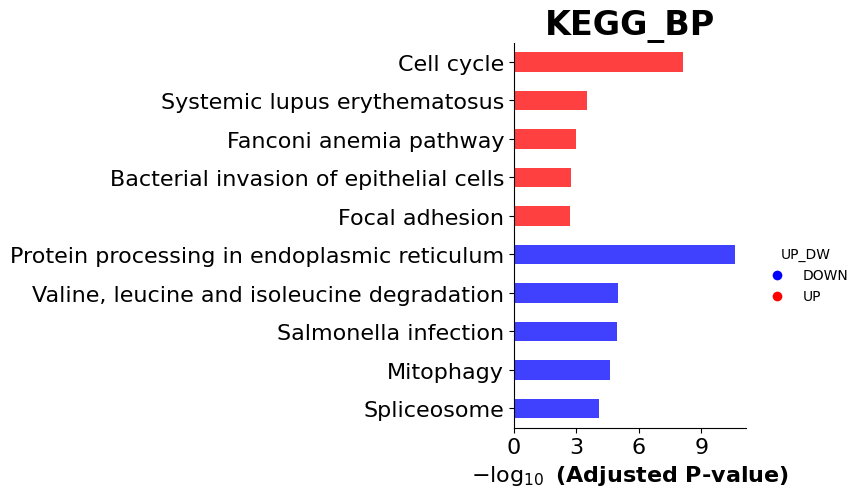

In [71]:
ax = gp.barplot(enr_res, figsize=(3,5),
                group ='UP_DW',
                title ="KEGG_BP",
                color = ['b','r'])
ax.figure.savefig(f"{figpath}/KEGG_BP_bar.svg")

In [50]:
nodes, edges = gp.enrichment_map(res.res2d)

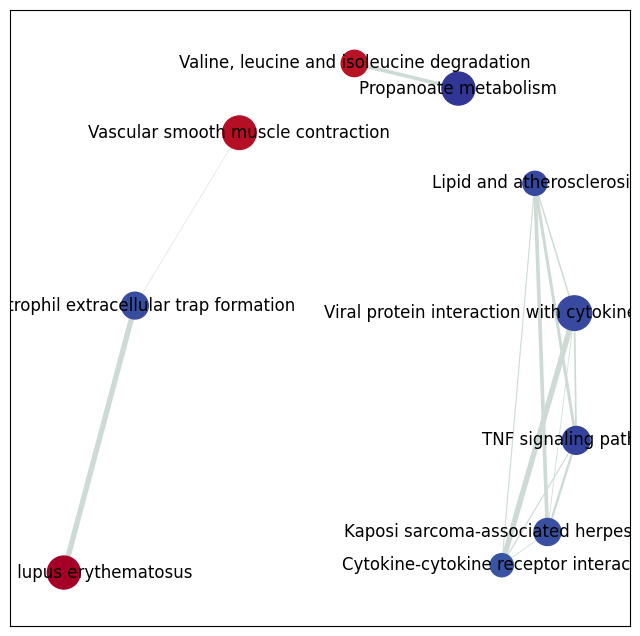

In [51]:
# build graph
G = nx.from_pandas_edgelist(edges,
                            source='src_idx',
                            target='targ_idx',
                            edge_attr=['jaccard_coef', 'overlap_coef', 'overlap_genes'])

fig, ax = plt.subplots(figsize=(8, 8))

# init node cooridnates
pos=nx.layout.spiral_layout(G)
#node_size = nx.get_node_attributes()
# draw node
nx.draw_networkx_nodes(G,
                       pos=pos,
                       cmap=plt.cm.RdYlBu,
                       node_color=list(nodes.NES),
                       node_size=list(nodes.Hits_ratio *1000))
# draw node label
nx.draw_networkx_labels(G,
                        pos=pos,
                        labels=nodes.Term.to_dict())
# draw edge
edge_weight = nx.get_edge_attributes(G, 'jaccard_coef').values()
nx.draw_networkx_edges(G,
                       pos=pos,
                       width=list(map(lambda x: x*10, edge_weight)),
                       edge_color='#CDDBD4')
plt.show()

In [27]:
meta = pd.DataFrame(adata_Fepi.obs['epi-subtype'].copy())
meta = meta.reset_index()
meta.columns=['Cell', 'cell_type']
meta.to_csv("meta.txt", sep='\t', index=False)

In [60]:
from cellphonedb.src.core.methods import cpdb_statistical_analysis_method

cpdb_res = cpdb_statistical_analysis_method.call(
  cpdb_file_path="cellphonedb.zip",
  meta_file_path="meta.txt",
  counts_file_path="adata-Fepi1.h5ad",
  counts_data='hgnc_symbol',
  output_path="cpdb",
  threads=16,
)
adata_Fepi.uns['CellphoneDB'] = cpdb_res
adata_Fepi

Reading user files...
The following user files were loaded successfully:
adata-Fepi1.h5ad
meta.txt
[ ][CORE][06/05/24-13:47:36][INFO] [Cluster Statistical Analysis] Threshold:0.1 Iterations:1000 Debug-seed:-1 Threads:16 Precision:3
[ ][CORE][06/05/24-13:47:42][INFO] Running Real Analysis
[ ][CORE][06/05/24-13:47:43][INFO] Running Statistical Analysis


100%|██████████| 1000/1000 [12:58<00:00,  1.28it/s]


[ ][CORE][06/05/24-14:00:54][INFO] Building Pvalues result
[ ][CORE][06/05/24-14:00:58][INFO] Building results
Saved deconvoluted to cpdb/statistical_analysis_deconvoluted_05_06_2024_140059.txt
Saved deconvoluted_percents to cpdb/statistical_analysis_deconvoluted_percents_05_06_2024_140059.txt
Saved means to cpdb/statistical_analysis_means_05_06_2024_140059.txt
Saved pvalues to cpdb/statistical_analysis_pvalues_05_06_2024_140059.txt
Saved significant_means to cpdb/statistical_analysis_significant_means_05_06_2024_140059.txt


AnnData object with n_obs × n_vars = 53019 × 39735
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'leiden-epi-harmony', 'cnv_status', 'cnv_score', 'epi-subtype', 'cnv_leiden'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'symbol', 'ensg', 'chromosome', 'start', 'end'
    uns: 'batch_colors', 'cnv', 'cnv_neighbors', 'cnv_status_colors', 'dendrogram_leiden', 'epi-subtype_colors', 'gender_colors', 'hvg', 'leiden', 'leiden-epi-harmony_colors', 'leiden-harmony-female_colors', 'leiden_colors', 'leiden_harmony_colors', 'log1p', 'majorType-Female_colo

In [72]:
adata_Fmye = sc.read_h5ad("adata-Fmye.h5ad")
adata_Fmye.obs['molecular_type'] = list(adata_Fmye.obs['molecular_type'])
adata_Fmye.obs.loc[adata_Fmye.obs['batch'].isin(["20T", '21T', '22T']),'molecular_type'] = 'LumB-HER2'
adata_Fmye.obs.loc[adata_Fmye.obs['batch'].isin(['17T']),'molecular_type'] = 'HER2'

AnnData object with n_obs × n_vars = 16525 × 41733
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'majorType-fix', 'leiden-B', 'leiden-Mye', 'Mye-type', 'sample'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Mye-type_colors', 'dendrogram_leiden-Mye', 'leiden', 'leiden-Mye_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

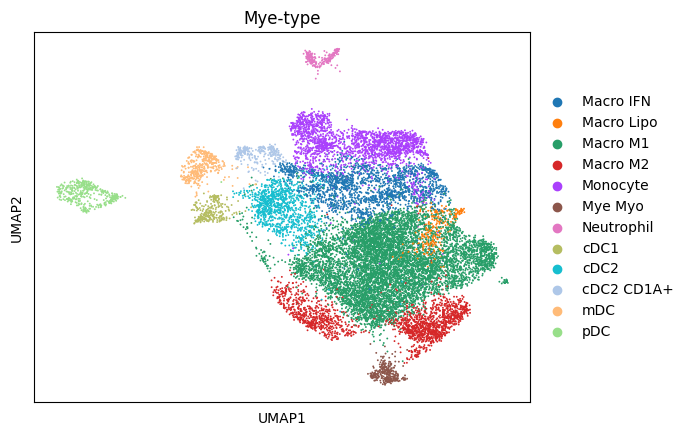

In [78]:
sc.pl.umap(adata_Fmye, color='Mye-type')

In [85]:
adata_Fepi.obs['epi-type'] = [f"{s.split(' ')[0]} {s.split(' ')[-1]}" for s in adata_Fepi.obs['epi-subtype']]
adata_Fepi.obs['cptype'] = adata_Fepi.obs['epi-type']
adata_Fmye.obs['cptype'] = adata_Fmye.obs['Mye-type']

In [86]:
adata_F = adata_Fepi.concatenate(adata_Fmye)

In [87]:
adata_F.write_h5ad("adata-Fepi-mye.h5ad")

In [89]:
meta = pd.DataFrame(adata_F.obs['cptype'].copy())
meta = meta.reset_index()
meta.columns=['Cell', 'cell_type']
meta.to_csv("meta.txt", sep='\t', index=False)
cpdb_res_em = cpdb_statistical_analysis_method.call(
  cpdb_file_path="cellphonedb.zip",
  meta_file_path="meta.txt",
  counts_file_path="adata-Fepi-mye.h5ad",
  counts_data='hgnc_symbol',
  output_path="cpdb",
  threads=16,
)
adata_F.uns['CellphoneDB'] = cpdb_res
adata_F

Reading user files...
The following user files were loaded successfully:
adata-Fepi-mye.h5ad
meta.txt
[ ][CORE][07/05/24-02:58:23][INFO] [Cluster Statistical Analysis] Threshold:0.1 Iterations:1000 Debug-seed:-1 Threads:16 Precision:3
[ ][CORE][07/05/24-02:58:29][INFO] Running Real Analysis
[ ][CORE][07/05/24-02:58:29][INFO] Running Statistical Analysis


100%|██████████| 1000/1000 [20:28<00:00,  1.23s/it]


[ ][CORE][07/05/24-03:19:11][INFO] Building Pvalues result
[ ][CORE][07/05/24-03:19:12][INFO] Building results
Saved deconvoluted to cpdb/statistical_analysis_deconvoluted_05_07_2024_031912.txt
Saved deconvoluted_percents to cpdb/statistical_analysis_deconvoluted_percents_05_07_2024_031912.txt
Saved means to cpdb/statistical_analysis_means_05_07_2024_031912.txt
Saved pvalues to cpdb/statistical_analysis_pvalues_05_07_2024_031912.txt
Saved significant_means to cpdb/statistical_analysis_significant_means_05_07_2024_031912.txt


AnnData object with n_obs × n_vars = 69544 × 26956
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'leiden-epi-harmony', 'cnv_status', 'cnv_score', 'epi-subtype', 'cnv_leiden', 'sample', 'epi-type', 'cptype', 'majorType-fix', 'leiden-B', 'leiden-Mye', 'Mye-type'
    var: 'highly_variable', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'symbol-0', 'ensg-0', 'chromosome-0', 'start-0', 'end-0', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 'n_cells-1', 'means-1', 'disper

In [100]:
adata_Fepi.obs['epi-type'].unique()

array(['Basal Normal', 'LumHR Normal', 'LumSec Cancer', 'Basal Cancer',
       'LumSec Normal', 'LumHR Cancer'], dtype=object)

In [106]:
import ktplotspy as kpy

In [134]:
ax = kpy.plot_cpdb(
  adata=adata_F,
  cell_type1="pDC",
  cell_type2='Basal Normal|LumHR Normal|LumSec Cancer|Basal Cancer|LumSec Normal|LumHR Cancer',
  means=cpdb_res_em['means'],
  pvals=cpdb_res_em['pvalues'],
  celltype_key='cptype',
  max_size=4,
  max_highlight_size=1,
  highlight_size=0.75,
  degs_analysis=False,
  standard_scale=True,
  figsize=(8,14),
)
ax.save(f'{figpath}/cpdb_em_pDC.png', dpi=300)

In [195]:
ax = kpy.plot_cpdb(
  adata=adata_F,
  cell_type1="cDC2 CD1A+",
  cell_type2='Basal Normal|LumHR Normal|LumSec Cancer|Basal Cancer|LumSec Normal|LumHR Cancer',
  means=cpdb_res_em['means'],
  pvals=cpdb_res_em['pvalues'],
  celltype_key='cptype',
  max_size=4,
  max_highlight_size=1,
  highlight_size=0.75,
  degs_analysis=False,
  standard_scale=True,
  figsize=(8,14),
)
ax.save(f'{figpath}/cpdb_em_cDC2 CD1A+.png', dpi=300)

In [132]:
ax = kpy.plot_cpdb(
  adata=adata_F,
  cell_type1="Neutrophil",
  cell_type2='Basal Normal|LumHR Normal|LumSec Cancer|Basal Cancer|LumSec Normal|LumHR Cancer',
  means=cpdb_res_em['means'],
  pvals=cpdb_res_em['pvalues'],
  celltype_key='cptype',
  max_size=4,
  max_highlight_size=1,
  highlight_size=0.75,
  degs_analysis=False,
  standard_scale=True,
  figsize=(8,12),
)
ax.save(f'{figpath}/cpdb_em.png', dpi=300)

In [ ]:
ax = kpy.plot_cpdb(
  adata=adata_F,
  cell_type1="pDC",
  cell_type2='Basal Normal|LumHR Normal|LumSec Cancer|Basal Cancer|LumSec Normal|LumHR Cancer',
  means=cpdb_res_em['means'],
  pvals=cpdb_res_em['pvalues'],
  celltype_key='cptype',
  max_size=4,
  max_highlight_size=1,
  highlight_size=0.75,
  degs_analysis=False,
  standard_scale=True,
  figsize=(8,14),
)
ax.save(f'{figpath}/cpdb_em_pDC.png', dpi=300)

In [222]:
ax = kpy.plot_cpdb(
  adata=adata_F,
  cell_type1="cDC2",
  cell_type2='Basal Normal|LumHR Normal|LumSec Cancer|Basal Cancer|LumSec Normal|LumHR Cancer',
  means=cpdb_res_em['means'],
  pvals=cpdb_res_em['pvalues'],
  celltype_key='cptype',
  max_size=4,
  max_highlight_size=1,
  highlight_size=0.75,
  degs_analysis=False,
  standard_scale=True,
  figsize=(8,20),
)
ax.save(f'{figpath}/cpdb_em_cDC2.png', dpi=300)

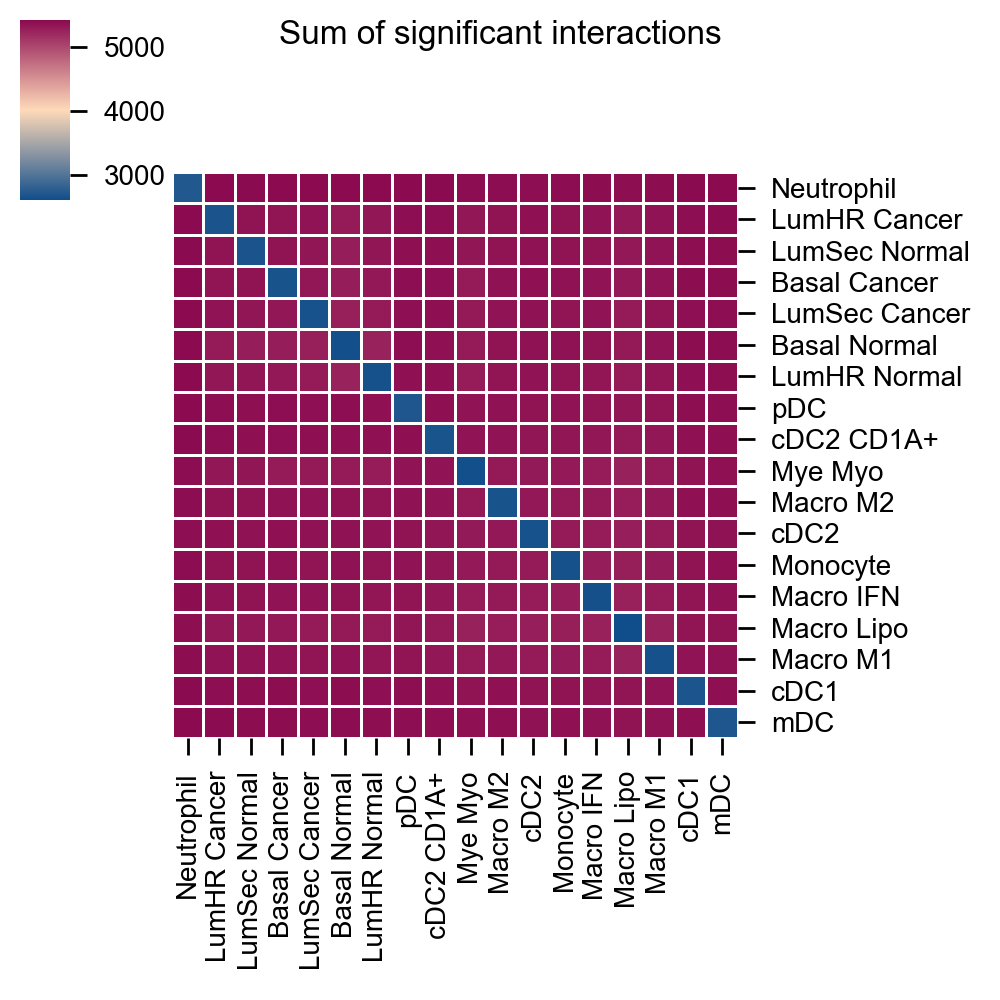

In [119]:
ax = kpy.plot_cpdb_heatmap(pvals=cpdb_res_em['pvalues'], degs_analysis=False, figsize=(5, 5), title="Sum of significant interactions")

In [ ]:
from cellphonedb.src.core.methods import cpdb_statistical_analysis_method
cpdb_res_em = cpdb_statistical_analysis_method.call(
  cpdb_file_path="cellphonedb.zip",
  meta_file_path="meta.txt",
  counts_file_path="adata-preF.h5ad",
  counts_data='hgnc_symbol',
  output_path="cpdb",
  threads=16,
)
adata_all.uns['CellphoneDB'] = cpdb_res_em
adata_all

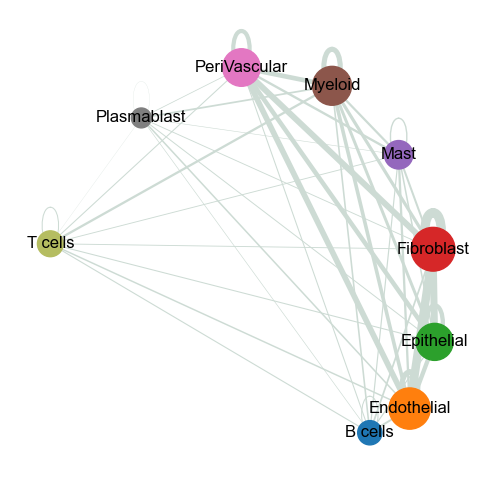

In [145]:
import ktplotspy as kpy
figpath = 'figure-5.21'
ax = kpy.plot_cpdb_heatmap(pvals=cpdb_res_em['pvalues'], degs_analysis=False, figsize=(5, 5), title="Sum of significant interactions", return_tables=True)
import networkx as nx
from matplotlib import cm, colors
vega_10 = list(map(colors.to_hex, cm.tab10.colors))
vega_10_scanpy = vega_10.copy()
# vega_10_scanpy[3] = '#ad494a'
# vega_10_scanpy[2] = '#279e68'  # green
# vega_10_scanpy[4] = '#aa40fc'  # purple
vega_10_scanpy[8] = '#b5bd61'  # kakhi
G = nx.from_pandas_edgelist(ax['interaction_edges'],
                            source='SOURCE',
                            target='TARGET',
                            edge_attr=['COUNT'])
fig, ax0 = plt.subplots(figsize=(6, 6))

pos=nx.layout.spiral_layout(G)
#node_size = nx.get_node_attributes()
# draw node
nx.draw_networkx_nodes(G,
                       pos=pos,
                       cmap=plt.cm.RdYlBu,
                       node_color=vega_10_scanpy[:-1],
                       node_size=list(ax['interaction_count']['total_interactions']))
edge_weight = nx.get_edge_attributes(G, 'COUNT').values()
nx.draw_networkx_labels(G,
                        pos=pos,
                        labels=dict(zip(ax['interaction_count']['total_interactions'].index, ax['interaction_count']['total_interactions'].index)))
nx.draw_networkx_edges(G,
                       pos=pos,
                       width=list(map(lambda x: x/20, edge_weight)),
                       edge_color='#CDDBD4')
plt.axis('off')
plt.savefig(f'{figpath}/cpdb_network.svg', bbox_inches='tight')

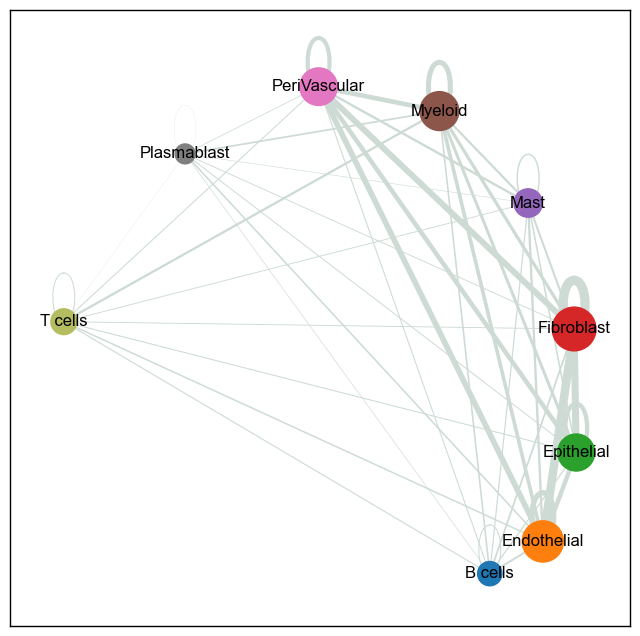

In [55]:
ax['interaction_count']['total_interactions']

B cells         305
Endothelial     882
Epithelial      710
Fibroblast      992
Mast            419
Myeloid         784
PeriVascular    731
Plasmablast     205
T cells         346
Name: total_interactions, dtype: int64

In [34]:
nx.get_edge_attributes(G, 'COUNT').values()

dict_values([15, 28, 17, 25, 17, 23, 15, 9, 16, 75, 62, 122, 33, 52, 81, 22, 21, 62, 101, 22, 43, 65, 14, 15, 133, 29, 46, 86, 13, 13, 20, 32, 34, 8, 13, 73, 67, 25, 33, 60, 11, 15, 3, 3, 15])

In [45]:
list(ax['interaction_count']['total_interactions']*2)

[610, 1764, 1420, 1984, 838, 1568, 1462, 410, 692]

In [32]:
ax['interaction_count']['total_interactions']

B cells         305
Endothelial     882
Epithelial      710
Fibroblast      992
Mast            419
Myeloid         784
PeriVascular    731
Plasmablast     205
T cells         346
Name: total_interactions, dtype: int64

In [ ]:
fig, ax = plt.subplots(figsize=(8, 8))

# init node cooridnates
pos=nx.layout.spiral_layout(G)
#node_size = nx.get_node_attributes()
# draw node
nx.draw_networkx_nodes(G,
                       pos=pos,
                       cmap=plt.cm.RdYlBu,
                       node_size=list(nodes.Hits_ratio *1000))
# draw node label
nx.draw_networkx_labels(G,
                        pos=pos,
                        labels=nodes.Term.to_dict())
# draw edge
edge_weight = nx.get_edge_attributes(G, 'jaccard_coef').values()
nx.draw_networkx_edges(G,
                       pos=pos,
                       width=list(map(lambda x: x*10, edge_weight)),
                       edge_color='#CDDBD4')
plt.show()

In [24]:
ax['interaction_edges']

,SOURCE,TARGET,COUNT
0,B cells,B cells,15
1,B cells,Endothelial,20
2,B cells,Epithelial,15
3,B cells,Fibroblast,19
4,B cells,Mast,16
...,...,...,...
76,T cells,Mast,13
77,T cells,Myeloid,33
78,T cells,PeriVascular,15
79,T cells,Plasmablast,3


In [15]:
ax = kpy.plot_cpdb_chord(adata=adata_all, 
                        cell_type1=".", 
                        cell_type2='.',
                        means=cpdb_res_em['means'],
                        pvals=cpdb_res_em['pvalues'],
                        deconvoluted=cpdb_res_em['deconvoluted'],
                        celltype_key='majorType-fix', 
                        figsize=(5, 5), title="Sum of significant interactions")

ValueError: Length mismatch: Expected axis has 262 elements, new values have 247 elements

In [83]:
adata_Fepi

AnnData object with n_obs × n_vars = 53019 × 39735
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'leiden-epi-harmony', 'cnv_status', 'cnv_score', 'epi-subtype', 'cnv_leiden', 'LumB-HER2', 'LumB'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'symbol', 'ensg', 'chromosome', 'start', 'end'
    uns: 'batch_colors', 'cnv', 'cnv_neighbors', 'cnv_status_colors', 'dendrogram_leiden', 'epi-subtype_colors', 'gender_colors', 'hvg', 'leiden', 'leiden-epi-harmony_colors', 'leiden-harmony-female_colors', 'leiden_colors', 'leiden_harmony_colors', 'log1p', '

In [84]:
sc.tl.rank_genes_groups(adata_Fepi, groupby="molecular_type", method="wilcoxon")

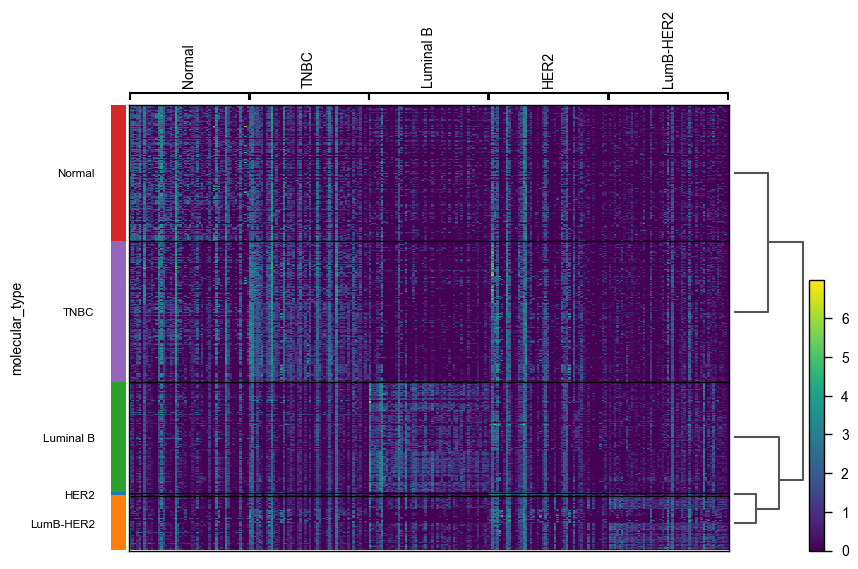

In [106]:
folder="figure-5.21"
ax = sc.pl.rank_genes_groups_heatmap(adata_Fepi, n_genes=50, save=f"epi-heatmap.svg")

categories: HER2, LumB-HER2, Luminal B, etc.
var_group_labels: Normal


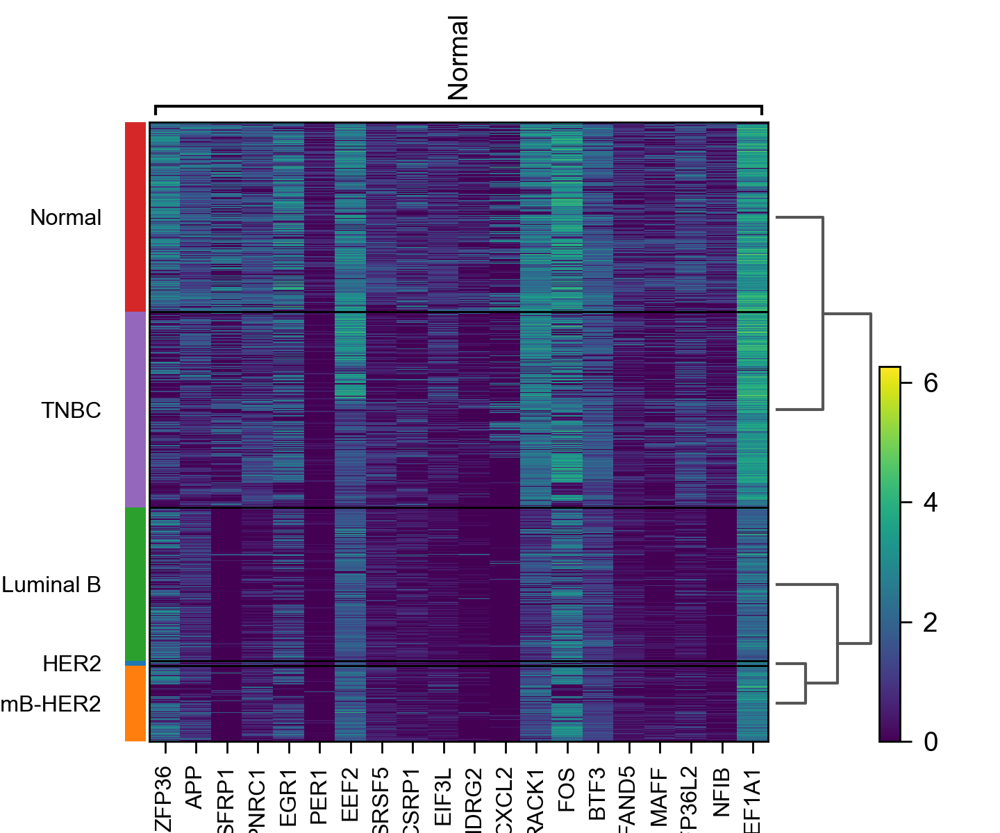

In [380]:
sc.pl.rank_genes_groups_heatmap(adata_Fepi, n_genes=20, show_gene_labels=True, groups=['Normal'])

In [139]:
sc.tl.score_genes(adata_Fepi, score_name='LumB-Her2-score',gene_list=['TRIM37', 'SKA2', 'YPEL2', 'MIEN1', 'PTRH2', 'CLTC', 'BST2',"ERBB2", 'IFI6', 'GRB7', 'S100A14', 'LRRC59', 'COMT', 'TOM1L1', 'SLC25A1', "ISG15",'APPBP2','TAGLN2', 'USP32'])
sc.tl.score_genes(adata_Fepi, score_name='Her2-score',gene_list=['PSMB3', 'IFI27', 'S100A9', 'CISD3',"LASP1", 'MRPL45', 'PSMD3', 'TPI1', 'PFN1', 'TPT1', 'URI1', 'TUBB', "CDKN2A",'EGLN3','TMSB10', 'TMSB4X'])
sc.tl.score_genes(adata_Fepi, score_name='LumB-score',gene_list=['COX6C', 'PARD6B', 'CA12', 'TPM3',"H2AJ", 'PRSS23', 'SLC7A2', 'EEF1A2', 'ESR1', 'KCNE4', 'FLNB', 'IGFBP4', "RAB31",'HSPB1','FOXA1', 'GATA3','ADARB1', 'POFUT2'])
sc.tl.score_genes(adata_Fepi, score_name='TNBC-score',gene_list=['PERP', 'GSTP1', 'YBX3', 'YBX1',"CALD1", 'IGKC'])

In [307]:
from supervenn import supervenn

In [290]:
adata_rf = adata_Fepi[:, LumBHer2_list+Her2_list+LumB_list+TNBC_list+Normal_list]
adata_rf

View of AnnData object with n_obs × n_vars = 53019 × 68
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'leiden-epi-harmony', 'cnv_status', 'cnv_score', 'epi-subtype', 'cnv_leiden', 'LumB-HER2', 'LumB', 'LumB-Her2-score', 'Her2-score', 'LumB-score', 'TNBC-score', 'batch_mol', 'LumB-old-score', 'Her2-old-score', 'epi-type', 'cptype', 'sample'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'symbol', 'ensg', 'chromosome', 'start', 'end'
    uns: 'batch_colors', 'cnv', 'cnv_neighbors', 'cnv_status_colors', 'dendrogram_leiden', 'epi-subtype_colors', 

In [352]:
# random forest model using 68 genes
from sklearn.tree import DecisionTreeClassifier 
from sklearn.ensemble import RandomForestClassifier 
from sklearn.datasets import load_wine
from sklearn.model_selection import train_test_split

Xtrain, Xtest, Ytrain, Ytest=train_test_split(adata_rf.X,adata_rf.obs['molecular_type'],test_size=0.3)
clf = DecisionTreeClassifier(random_state=0) 
rfc = RandomForestClassifier(random_state=0) 
clf = clf.fit(Xtrain,Ytrain)
rfc = rfc.fit(Xtrain,Ytrain)
score_c = clf.score(Xtest,Ytest)
score_r = rfc.score(Xtest,Ytest)
print("Single Tree:{}".format(score_c) ,"Random Forest:{}".format(score_r) )

Single Tree:0.870174776813781 Random Forest:0.9392682006789891


Single Tree:0.8692946058091287 Random Forest:0.9394568087514146


In [308]:
gene_2021_her2 = ['PSMA2', 'PPP1R1B', 'SYNGR2', 'CNPY2', 'LGALS7B', 'CYBA', 'FTH1', 'MSL1', 'IGKV3.15', 'STARD3', 'HPD', 'HMGCS2', 'ID3', 'NDUFB8', 'COTL1', 'AIM1', 'MED24', 'CEACAM6', 'FABP7', 'CRABP2', 'NR4A2', 'COX14', 'ACADM', 'PKM', 'ECH1', 'C17orf89', 'NGRN', 'ATG5', 'SNHG25', 'ETFB', 'EGLN3', 'CSNK2B', 'RHOC', 'PSENEN', 'CDK12', 'ATP5I', 'ENTHD2', 'QRSL1', 'S100A7', 'TPM1', 'ATP5C1', 'HIST1H1E', 'LGALS1', 'GRB7', 'AQP3', 'ALDH2', 'EIF3E', 'ERBB2', 'LCN2', 'SLC38A10', 'TXN', 'DBI', 'RP11.206M11.7', 'TUBB', 'CRYAB', 'CD9', 'PDSS2', 'XIST', 'MED1', 'C6orf203', 'PSMD3', 'TMC5', 'UQCRQ', 'EFHD1', 'BCAM', 'GPX1', 'EPHX1', 'AREG', 'CDK2AP2', 'SPINK8', 'PGAP3', 'NFIC', 'THRSP', 'LDHB', 'MT1X', 'HIST1H4C', 'LRRC26', 'SLC16A3', 'BACE2', 'MIEN1', 'AR', 'CRIP2', 'NME1', 'DEGS2', 'CASC3', 'FOLR1', 'SIVA1', 'SLC25A39', 'IGHG1', 'ORMDL3', 'KRT81', 'SCGB2B2', 'LINC01285', 'CXCL8', 'KRT15', 'RSU1', 'ZFP36L2', 'DKK1', 'TMED10', 'IRX3', 'S100A9', 'YWHAZ']
gene_2021_lumb = ['UGCG', 'ARMT1', 'ISOC1', 'GDF15', 'ZFP36', 'PSMC5', 'DDX5', 'TMEM150C', 'NBEAL1', 'CLEC3A', 'GADD45G', 'MARCKS', 'FHL2', 'CCDC117', 'LY6E', 'GJA1', 'PSAP', 'TAF7', 'PIP', 'HSPA2', 'DSCAM.AS1', 'PSMB7', 'STARD10', 'ATF3', 'WBP11', 'MALAT1', 'C6orf48', 'HLA.DRB1', 'HIST1H2BD', 'CCND1', 'STC2', 'NR4A1', 'NPY1R', 'FOS', 'ZFAND2A', 'CFL1', 'RHOB', 'LMNA', 'SLC40A1', 'CYB5A', 'SRSF5', 'SEC61G', 'CTSD', 'DNAJC12', 'IFITM1', 'MAGED2', 'RBP1', 'TFF1', 'APLP2', 'TFF3', 'TRH', 'NUPR1', 'EMC3', 'TXNIP', 'ARPC4', 'KCNE4', 'ANPEP', 'MGST1', 'TOB1', 'ADIRF', 'TUBA1B', 'MYEOV2', 'MLLT4', 'DHRS2', 'IFITM2']
gene_2021_tnbc = ["EMP1", "TAGLN", "TTYH1", "RTN4", "TK1", "BUB3", "IGLV3-25", "FAM3C", "TMEM123", "KDM5B", "KRT14", "ALG3", "KLK6", "EEF2", "NSMCE4A", "LYST", "DEDD", "HLA-DRA", "PAPOLA", "SOX4", "ACTR3B", "EIF3D", "CACYBP", "RARRES1", "STRA13", "MFGE8", "FRZB", "SDHD", "UCHL1", "TMEM176A", "CAV2", "MARCO", "P4HB", "CHI3L2", "APOE", "ATP1B1", "C6orf15", "KRT6B", "TAF1D", "ACTA2", "LY6D", "SAA2", "CYP27A1", "DLK1", "IGKV1-5", "CENPW", "RAB18", "TNFRSF11B", "VPS28", "HULC", "KRT16", "CDKN2A", "AHNAK2", "SEC22B", "CDC42EP1", "HMGA1", "CAV1", "BAMBI", "TOMM22", "ATP6V0E2", "MTCH2", "PRSS21", "HDAC2", "ZG16B", "GAL", "SCGB1D2", "S100A2", "GSPT1", "ARPC1B", "NIT1", "NEAT1", "DSC2","MAL2", "TMEM176B", "CYP1B1", "EIF3L", "FKBP4", "WFDC2", "SAA1", "CXCL17", "PFDN2", "UCP2", "RAB11B", "FDCSP", "HLA.DPB1", "PCSK1N", "C4orf48", "CTSC"]
gene_2021 = set(gene_2021_her2+gene_2021_lumb+gene_2021_tnbc).intersection(adata.var_names)
len(gene_2021)

237

In [293]:
# random forest model using 2000 genes
gene_2021_her2 = ['PSMA2', 'PPP1R1B', 'SYNGR2', 'CNPY2', 'LGALS7B', 'CYBA', 'FTH1', 'MSL1', 'IGKV3.15', 'STARD3', 'HPD', 'HMGCS2', 'ID3', 'NDUFB8', 'COTL1', 'AIM1', 'MED24', 'CEACAM6', 'FABP7', 'CRABP2', 'NR4A2', 'COX14', 'ACADM', 'PKM', 'ECH1', 'C17orf89', 'NGRN', 'ATG5', 'SNHG25', 'ETFB', 'EGLN3', 'CSNK2B', 'RHOC', 'PSENEN', 'CDK12', 'ATP5I', 'ENTHD2', 'QRSL1', 'S100A7', 'TPM1', 'ATP5C1', 'HIST1H1E', 'LGALS1', 'GRB7', 'AQP3', 'ALDH2', 'EIF3E', 'ERBB2', 'LCN2', 'SLC38A10', 'TXN', 'DBI', 'RP11.206M11.7', 'TUBB', 'CRYAB', 'CD9', 'PDSS2', 'XIST', 'MED1', 'C6orf203', 'PSMD3', 'TMC5', 'UQCRQ', 'EFHD1', 'BCAM', 'GPX1', 'EPHX1', 'AREG', 'CDK2AP2', 'SPINK8', 'PGAP3', 'NFIC', 'THRSP', 'LDHB', 'MT1X', 'HIST1H4C', 'LRRC26', 'SLC16A3', 'BACE2', 'MIEN1', 'AR', 'CRIP2', 'NME1', 'DEGS2', 'CASC3', 'FOLR1', 'SIVA1', 'SLC25A39', 'IGHG1', 'ORMDL3', 'KRT81', 'SCGB2B2', 'LINC01285', 'CXCL8', 'KRT15', 'RSU1', 'ZFP36L2', 'DKK1', 'TMED10', 'IRX3', 'S100A9', 'YWHAZ']
gene_2021_lumb = ['UGCG', 'ARMT1', 'ISOC1', 'GDF15', 'ZFP36', 'PSMC5', 'DDX5', 'TMEM150C', 'NBEAL1', 'CLEC3A', 'GADD45G', 'MARCKS', 'FHL2', 'CCDC117', 'LY6E', 'GJA1', 'PSAP', 'TAF7', 'PIP', 'HSPA2', 'DSCAM.AS1', 'PSMB7', 'STARD10', 'ATF3', 'WBP11', 'MALAT1', 'C6orf48', 'HLA.DRB1', 'HIST1H2BD', 'CCND1', 'STC2', 'NR4A1', 'NPY1R', 'FOS', 'ZFAND2A', 'CFL1', 'RHOB', 'LMNA', 'SLC40A1', 'CYB5A', 'SRSF5', 'SEC61G', 'CTSD', 'DNAJC12', 'IFITM1', 'MAGED2', 'RBP1', 'TFF1', 'APLP2', 'TFF3', 'TRH', 'NUPR1', 'EMC3', 'TXNIP', 'ARPC4', 'KCNE4', 'ANPEP', 'MGST1', 'TOB1', 'ADIRF', 'TUBA1B', 'MYEOV2', 'MLLT4', 'DHRS2', 'IFITM2']
gene_2021_tnbc = ["EMP1", "TAGLN", "TTYH1", "RTN4", "TK1", "BUB3", "IGLV3-25", "FAM3C", "TMEM123", "KDM5B", "KRT14", "ALG3", "KLK6", "EEF2", "NSMCE4A", "LYST", "DEDD", "HLA-DRA", "PAPOLA", "SOX4", "ACTR3B", "EIF3D", "CACYBP", "RARRES1", "STRA13", "MFGE8", "FRZB", "SDHD", "UCHL1", "TMEM176A", "CAV2", "MARCO", "P4HB", "CHI3L2", "APOE", "ATP1B1", "C6orf15", "KRT6B", "TAF1D", "ACTA2", "LY6D", "SAA2", "CYP27A1", "DLK1", "IGKV1-5", "CENPW", "RAB18", "TNFRSF11B", "VPS28", "HULC", "KRT16", "CDKN2A", "AHNAK2", "SEC22B", "CDC42EP1", "HMGA1", "CAV1", "BAMBI", "TOMM22", "ATP6V0E2", "MTCH2", "PRSS21", "HDAC2", "ZG16B", "GAL", "SCGB1D2", "S100A2", "GSPT1", "ARPC1B", "NIT1", "NEAT1", "DSC2","MAL2", "TMEM176B", "CYP1B1", "EIF3L", "FKBP4", "WFDC2", "SAA1", "CXCL17", "PFDN2", "UCP2", "RAB11B", "FDCSP", "HLA.DPB1", "PCSK1N", "C4orf48", "CTSC"]
gene_2021 = list(set(gene_2021_her2+gene_2021_lumb+gene_2021_tnbc).intersection(adata.var_names))
adata_2021 = adata_Fepi[:,gene_2021]
Xtrain, Xtest, Ytrain, Ytest=train_test_split(adata_2021.X,adata_2021.obs['molecular_type'],test_size=0.3)
clf = DecisionTreeClassifier(random_state=0) 
rfc = RandomForestClassifier(random_state=0) 
clf = clf.fit(Xtrain,Ytrain)
rfc = rfc.fit(Xtrain,Ytrain)
score_c = clf.score(Xtest,Ytest)
score_r = rfc.score(Xtest,Ytest)
print("Single Tree:{}".format(score_c) ,"Random Forest:{}".format(score_r) )

Single Tree:0.8654595750031435 Random Forest:0.9439205331321514


In [294]:
# random forest model using 2021 genes
adata_hvg = adata_Fepi[:,adata_Fepi.var['highly_variable']]
Xtrain, Xtest, Ytrain, Ytest=train_test_split(adata_hvg.X,adata_hvg.obs['molecular_type'],test_size=0.3)
clf = DecisionTreeClassifier(random_state=0) 
rfc = RandomForestClassifier(random_state=0) 
clf = clf.fit(Xtrain,Ytrain)
rfc = rfc.fit(Xtrain,Ytrain)
score_c = clf.score(Xtest,Ytest)
score_r = rfc.score(Xtest,Ytest)
print("Single Tree:{}".format(score_c) ,"Random Forest:{}".format(score_r) )

Single Tree:0.9033069282031938 Random Forest:0.9593863950710424


In [309]:
bcy_genes = LumBHer2_list+Her2_list+LumB_list+TNBC_list+Normal_list
wu_genes = gene_2021
pam50_genes = ["ACTR3B", "ANLN", "BAG1", "BCL2", "BIRC5", "BLVRA", "CCNB1", "CCNE1", "CDC20", "CDC6", "CDCA1", "CDH3", "CENPF", "CEP55", "CXXC5", "EGFR", "ERBB2", "ESR1", "EXO1", "FGFR4", "FOXA1", "FOXC1", "GPR160", "GRB7", "KIF2C", "KNTC2", "KRT14", "KRT17", "KRT5", "MAPT", "MDM2", "MELK", "MIA", "MKI67", "MLPH", "MMP11", "MYBL2", "MYC", "NAT1", "ORC6L", "PGR", "PHGDH", "PTTG1", "RRM2", "SFRP1", "SLC39A6", "TMEM45B", "TYMS", "UBE2C", "UBE2T"]

In [355]:
list(adata_Fepi.obs['batch_mol'].unique())

['1T_TNBC',
 '2T_TNBC',
 '3T_TNBC',
 '5N_Normal',
 '5T_Luminal B',
 '6N_Normal',
 '6T_Luminal B',
 '8T_TNBC',
 '9T_TNBC',
 '10T_Luminal B',
 '10N_Normal',
 '12N_Normal',
 '15T_Luminal B',
 '16N_Normal',
 '17T_HER2',
 '20T_LumB-HER2',
 '21T_LumB-HER2',
 '22T_LumB-HER2']

In [395]:
LumBHer2_list = ['TRIM37', 'SKA2', 'YPEL2', 'MIEN1', 'PTRH2', 'CLTC', 'BST2', 'IFI6', 'GRB7', 'S100A14', 'LRRC59', 'COMT', 'TOM1L1', 'SLC25A1', "ISG15",'APPBP2','TAGLN2', 'USP32']
Her2_list = ['PSMB3', 'IFI27', 'S100A9', 'CISD3',"LASP1", 'MRPL45', 'PSMD3', 'TPI1', 'PFN1', 'TPT1', 'URI1', 'TUBB', "CDKN2A",'EGLN3','TMSB10', 'TMSB4X','ERBB2']
LumB_list = ['COX6C', 'PARD6B', 'CA12', 'TPM3',"H2AJ", 'PRSS23', 'SLC7A2', 'EEF1A2', 'ESR1', 'KCNE4', 'FLNB', 'IGFBP4', "RAB31",'HSPB1','FOXA1', 'GATA3','ADARB1', 'POFUT2']
TNBC_list = ['PERP', 'GSTP1', 'YBX3', 'YBX1',"CALD1", 'IGKC', 'B2M', 'PTMA']
Normal_list = ['ZFP36', 'APP', 'SFRP1', 'EGR1', 'PNRC1', 'PER1', 'EEF2', "SRSF5", 'CXCL2']

In [429]:
# read pseudobulk data
agg_Fepi = sc.read_csv("Fepi-agg.tsv", delimiter='\t')
agg_Fepi.obs['PAM50'] = ['TNBC','TNBC','TNBC','Normal','Luminal B','Normal','Luminal B','TNBC','TNBC','Luminal B','Normal','Normal','Luminal B','Luminal A','HER2','Luminal B','Luminal B','TNBC']
agg_Fepi.obs['molecular_type'] = ['TNBC', 'TNBC','TNBC','Normal','Luminal B','Normal','Luminal B','TNBC','TNBC','Luminal B','Normal','Normal','Luminal B','Normal','HER2','LumB-HER2','LumB-HER2','LumB-HER2']

In [430]:
sc.tl.score_genes(agg_Fepi, score_name='LumB-Her2-score',gene_list=LumBHer2_list)
sc.tl.score_genes(agg_Fepi, score_name='Her2-score',gene_list=Her2_list)
sc.tl.score_genes(agg_Fepi, score_name='LumB-score',gene_list=LumB_list)
sc.tl.score_genes(agg_Fepi, score_name='TNBC-score',gene_list=TNBC_list)
sc.tl.score_genes(agg_Fepi, score_name='Normal-score',gene_list=Normal_list)

In [431]:
subtypes = ['LumB-HER2', 'HER2', 'Luminal B', 'TNBC', 'Normal']
arg = np.argmax(np.array(agg_Fepi.obs[['LumB-Her2-score', 'Her2-score', 'LumB-score', 'TNBC-score', 'Normal-score']]), axis=1)
agg_Fepi.obs['BCYType'] = [subtypes[s] for s in arg]
agg_Fepi.obs

,PAM50,molecular_type,LumB-Her2-score,Her2-score,LumB-score,TNBC-score,Normal-score,BCYType
1T,TNBC,TNBC,49.104877,966.317297,163.657136,3384.568420,1221.079790,TNBC
2T,TNBC,TNBC,149.273961,1390.198656,7.956480,1838.784566,96.553093,TNBC
3T,TNBC,TNBC,173.576830,1237.791616,125.037544,3516.807082,2648.044996,TNBC
5N,Normal,Normal,-57.964374,889.147587,320.587758,2020.784817,5273.597226,Normal
5T,Luminal B,Luminal B,342.863679,444.347620,663.461255,291.764293,406.912205,Luminal B
6N,Normal,Normal,-61.410110,751.972601,380.398199,2373.325483,5692.420695,Normal
6T,Luminal B,Luminal B,166.463442,1605.178645,3017.879819,226.043874,961.951890,Luminal B
8T,TNBC,TNBC,43.713939,1266.527276,-219.701176,5397.051441,4017.121745,TNBC
9T,TNBC,TNBC,142.167969,495.702067,150.375101,725.589195,467.436988,TNBC
10T,Luminal B,Luminal B,-242.426992,1373.693437,8270.313544,-49.994078,1775.543520,Luminal B


In [432]:
# pseudobulk level 
gene_2021_her2 = ['PSMA2', 'PPP1R1B', 'SYNGR2', 'CNPY2', 'LGALS7B', 'CYBA', 'FTH1', 'MSL1', 'IGKV3.15', 'STARD3', 'HPD', 'HMGCS2', 'ID3', 'NDUFB8', 'COTL1', 'AIM1', 'MED24', 'CEACAM6', 'FABP7', 'CRABP2', 'NR4A2', 'COX14', 'ACADM', 'PKM', 'ECH1', 'C17orf89', 'NGRN', 'ATG5', 'SNHG25', 'ETFB', 'EGLN3', 'CSNK2B', 'RHOC', 'PSENEN', 'CDK12', 'ATP5I', 'ENTHD2', 'QRSL1', 'S100A7', 'TPM1', 'ATP5C1', 'HIST1H1E', 'LGALS1', 'GRB7', 'AQP3', 'ALDH2', 'EIF3E', 'ERBB2', 'LCN2', 'SLC38A10', 'TXN', 'DBI', 'RP11.206M11.7', 'TUBB', 'CRYAB', 'CD9', 'PDSS2', 'XIST', 'MED1', 'C6orf203', 'PSMD3', 'TMC5', 'UQCRQ', 'EFHD1', 'BCAM', 'GPX1', 'EPHX1', 'AREG', 'CDK2AP2', 'SPINK8', 'PGAP3', 'NFIC', 'THRSP', 'LDHB', 'MT1X', 'HIST1H4C', 'LRRC26', 'SLC16A3', 'BACE2', 'MIEN1', 'AR', 'CRIP2', 'NME1', 'DEGS2', 'CASC3', 'FOLR1', 'SIVA1', 'SLC25A39', 'IGHG1', 'ORMDL3', 'KRT81', 'SCGB2B2', 'LINC01285', 'CXCL8', 'KRT15', 'RSU1', 'ZFP36L2', 'DKK1', 'TMED10', 'IRX3', 'S100A9', 'YWHAZ']
gene_2021_lumb = ['UGCG', 'ARMT1', 'ISOC1', 'GDF15', 'ZFP36', 'PSMC5', 'DDX5', 'TMEM150C', 'NBEAL1', 'CLEC3A', 'GADD45G', 'MARCKS', 'FHL2', 'CCDC117', 'LY6E', 'GJA1', 'PSAP', 'TAF7', 'PIP', 'HSPA2', 'DSCAM.AS1', 'PSMB7', 'STARD10', 'ATF3', 'WBP11', 'MALAT1', 'C6orf48', 'HLA.DRB1', 'HIST1H2BD', 'CCND1', 'STC2', 'NR4A1', 'NPY1R', 'FOS', 'ZFAND2A', 'CFL1', 'RHOB', 'LMNA', 'SLC40A1', 'CYB5A', 'SRSF5', 'SEC61G', 'CTSD', 'DNAJC12', 'IFITM1', 'MAGED2', 'RBP1', 'TFF1', 'APLP2', 'TFF3', 'TRH', 'NUPR1', 'EMC3', 'TXNIP', 'ARPC4', 'KCNE4', 'ANPEP', 'MGST1', 'TOB1', 'ADIRF', 'TUBA1B', 'MYEOV2', 'MLLT4', 'DHRS2', 'IFITM2']
gene_2021_tnbc = ["EMP1", "TAGLN", "TTYH1", "RTN4", "TK1", "BUB3", "IGLV3-25", "FAM3C", "TMEM123", "KDM5B", "KRT14", "ALG3", "KLK6", "EEF2", "NSMCE4A", "LYST", "DEDD", "HLA-DRA", "PAPOLA", "SOX4", "ACTR3B", "EIF3D", "CACYBP", "RARRES1", "STRA13", "MFGE8", "FRZB", "SDHD", "UCHL1", "TMEM176A", "CAV2", "MARCO", "P4HB", "CHI3L2", "APOE", "ATP1B1", "C6orf15", "KRT6B", "TAF1D", "ACTA2", "LY6D", "SAA2", "CYP27A1", "DLK1", "IGKV1-5", "CENPW", "RAB18", "TNFRSF11B", "VPS28", "HULC", "KRT16", "CDKN2A", "AHNAK2", "SEC22B", "CDC42EP1", "HMGA1", "CAV1", "BAMBI", "TOMM22", "ATP6V0E2", "MTCH2", "PRSS21", "HDAC2", "ZG16B", "GAL", "SCGB1D2", "S100A2", "GSPT1", "ARPC1B", "NIT1", "NEAT1", "DSC2","MAL2", "TMEM176B", "CYP1B1", "EIF3L", "FKBP4", "WFDC2", "SAA1", "CXCL17", "PFDN2", "UCP2", "RAB11B", "FDCSP", "HLA.DPB1", "PCSK1N", "C4orf48", "CTSC"]
gene_2021_luma = ['SH3BGRL', 'HSPB1', 'PHGR1', 'SOX9', 'CEBPD', 'CITED2', 'TM4SF1', 'S100P', 'KCNK6', 'AGR3', 'MPC2', 'CXCL13', 'RNASET2', 'DDIT4', 'SCUBE2', 'KRT8', 'MZT2B', 'IFI6', 'RPS26', 'TAGLN2', 'SPTSSA', 'ZFP36L1', 'MGP', 'KDELR2', 'PPDPF', 'AZGP1', 'AP000769.1', 'MYBPC1', 'S100A1', 'TFPI2', 'JUN', 'SLC25A6', 'HSP90AB1', 'ARF5', 'PMAIP1', 'TNFRSF12A', 'FXYD3', 'RASD1', 'PYCARD', 'PYDC1', 'PHLDA2', 'BZW2', 'HOXA9', 'XBP1', 'AGR2', 'HSP90AA1']
sc.tl.score_genes(agg_Fepi, score_name='wu_Her2-score',gene_list=gene_2021_her2)
sc.tl.score_genes(agg_Fepi, score_name='wu_LumB-score',gene_list=gene_2021_lumb)
sc.tl.score_genes(agg_Fepi, score_name='wu_TNBC-score',gene_list=gene_2021_tnbc)
# sc.tl.score_genes(agg_Fepi, score_name='wu_LumA-score',gene_list=gene_2021_luma)
subtypes = ['HER2', 'Luminal B', 'TNBC']
arg = np.argmax(np.array(agg_Fepi.obs[['wu_Her2-score', 'wu_LumB-score', 'wu_TNBC-score']]), axis=1)
agg_Fepi.obs['ScSubtype'] = [subtypes[s] for s in arg]
agg_Fepi.obs[['molecular_type','BCYType', 'PAM50', 'ScSubtype']]

,molecular_type,BCYType,PAM50,ScSubtype
1T,TNBC,TNBC,TNBC,Luminal B
2T,TNBC,TNBC,TNBC,TNBC
3T,TNBC,TNBC,TNBC,Luminal B
5N,Normal,Normal,Normal,Luminal B
5T,Luminal B,Luminal B,Luminal B,Luminal B
6N,Normal,Normal,Normal,Luminal B
6T,Luminal B,Luminal B,Luminal B,Luminal B
8T,TNBC,TNBC,TNBC,Luminal B
9T,TNBC,TNBC,TNBC,Luminal B
10T,Luminal B,Luminal B,Luminal B,Luminal B


In [433]:
from sklearn.metrics import adjusted_rand_score, accuracy_score, normalized_mutual_info_score
perf = pd.DataFrame(index=['BCYType', 'PAM50', 'ScSubtype'])
for index in [accuracy_score, adjusted_rand_score, normalized_mutual_info_score]:
  score = [index(agg_Fepi.obs['molecular_type'], agg_Fepi.obs[meth]) for meth in ['BCYType', 'PAM50', 'ScSubtype']]
  perf[index.__name__] = score
perf

,accuracy_score,adjusted_rand_score,normalized_mutual_info_score
BCYType,0.888889,0.744716,0.844027
PAM50,0.777778,0.630011,0.790020
ScSubtype,0.333333,0.061350,0.302234


In [415]:
# single-cell level PAM50
scPAM50 = pd.read_csv('single-cell_PAM50.tsv', sep='\t',index_col=0)
adata_Fepi.obs['PAM50'] = scPAM50
adata_Fepi.obs.loc[adata_Fepi.obs['PAM50'] == 'Basal', 'PAM50'] = 'TNBC'
adata_Fepi.obs.loc[adata_Fepi.obs['PAM50'] == 'LumB', 'PAM50'] = 'Luminal B'
adata_Fepi.obs.loc[adata_Fepi.obs['PAM50'] == 'Her2', 'PAM50'] = 'HER2'
adata_Fepi.obs.loc[adata_Fepi.obs['PAM50'] == 'LumA', 'PAM50'] = 'Luminal A'

In [414]:
adata_Fepi.obs['PAM50'].unique()

array(['Normal', 'LumA', 'Basal', 'Her2', 'LumB'], dtype=object)

In [407]:
# single-cell level BCYtype
sc.tl.score_genes(adata_Fepi, score_name='LumB-Her2-score',gene_list=LumBHer2_list)
sc.tl.score_genes(adata_Fepi, score_name='Her2-score',gene_list=Her2_list)
sc.tl.score_genes(adata_Fepi, score_name='LumB-score',gene_list=LumB_list)
sc.tl.score_genes(adata_Fepi, score_name='TNBC-score',gene_list=TNBC_list)
sc.tl.score_genes(adata_Fepi, score_name='Normal-score',gene_list=Normal_list)
subtypes = ['LumB-HER2', 'HER2', 'Luminal B', 'TNBC', 'Normal']
arg = np.argmax(np.array(adata_Fepi.obs[['LumB-Her2-score', 'Her2-score', 'LumB-score', 'TNBC-score', 'Normal-score']]), axis=1)
adata_Fepi.obs['BCYType'] = [subtypes[s] for s in arg]
adata_Fepi.obs

,batch,mt_frac,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,n_genes,n_counts,leiden,major_type,...,LumB-old-score,Her2-old-score,epi-type,cptype,sample,score,proli_score,PAM50,Normal-score,BCYType
barcodes,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGACCAAGC-1-1T,1T,0.101613,3418,8.137103,14073.0,9.552084,3417,14072.0,23,Epithelial,...,0.267100,0.280205,Basal Normal,Basal Normal,1T,-0.022601,-0.022601,Normal,0.496125,TNBC
AAACCCATCACTTTGT-1-1T,1T,0.129870,2526,7.834788,8008.0,8.988321,2526,8008.0,23,Epithelial,...,0.308034,0.209303,Basal Normal,Basal Normal,1T,-0.047560,-0.047560,Normal,0.690271,TNBC
AAACGAAAGCGGATCA-1-1T,1T,0.132144,1916,7.558517,8521.0,9.050406,1916,8521.0,23,PeriVascular,...,0.146849,0.161523,LumHR Normal,LumHR Normal,1T,-0.052226,-0.052226,LumA,0.164934,TNBC
AAACGAACACAGTGTT-1-1T,1T,0.104349,1791,7.491088,5242.0,8.564650,1791,5242.0,23,Epithelial,...,0.348794,0.246670,Basal Normal,Basal Normal,1T,-0.009362,-0.009362,Normal,0.604282,TNBC
AAACGCTCAAGCAATA-1-1T,1T,0.098455,4888,8.494743,36504.0,10.505204,4886,36501.0,23,PeriVascular,...,0.125596,0.279764,Basal Normal,Basal Normal,1T,-0.046617,-0.046617,LumA,0.084192,TNBC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTGTCCCTACT-1-22T,22T,0.069257,5332,8.581669,27405.0,10.218517,5331,27404.0,19,Epithelial,...,0.094311,0.321104,LumSec Cancer,LumSec Cancer,22T,0.040859,0.040859,Basal,0.037749,TNBC
TTTGGTTGTGATGATA-1-22T,22T,0.037259,6027,8.704171,23323.0,10.057239,6027,23323.0,19,Epithelial,...,0.098697,0.270352,LumSec Cancer,LumSec Cancer,22T,-0.043768,-0.043768,Normal,0.451835,HER2
TTTGTCAAGGCAAAGA-1-22T,22T,0.025878,696,6.546785,1082.0,6.987490,696,1082.0,19,Epithelial,...,0.058063,0.177003,LumSec Cancer,LumSec Cancer,22T,0.019683,0.019683,Normal,0.169180,TNBC


In [417]:
# single-cell level SCSubtype
gene_2021_her2 = ['PSMA2', 'PPP1R1B', 'SYNGR2', 'CNPY2', 'LGALS7B', 'CYBA', 'FTH1', 'MSL1', 'IGKV3-15', 'STARD3', 'HPD', 'HMGCS2', 'ID3', 'NDUFB8', 'COTL1', 'AIM1', 'MED24', 'CEACAM6', 'FABP7', 'CRABP2', 'NR4A2', 'COX14', 'ACADM', 'PKM', 'ECH1', 'C17ORF89', 'NGRN', 'ATG5', 'SNHG25', 'ETFB', 'EGLN3', 'CSNK2B', 'RHOC', 'PSENEN', 'CDK12', 'ATP5I', 'ENTHD2', 'QRSL1', 'S100A7', 'TPM1', 'ATP5C1', 'HIST1H1E', 'LGALS1', 'GRB7', 'AQP3', 'ALDH2', 'EIF3E', 'ERBB2', 'LCN2', 'SLC38A10', 'TXN', 'DBI', 'RP11.206M11.7', 'TUBB', 'CRYAB', 'CD9', 'PDSS2', 'XIST', 'MED1', 'C6orf203', 'PSMD3', 'TMC5', 'UQCRQ', 'EFHD1', 'BCAM', 'GPX1', 'EPHX1', 'AREG', 'CDK2AP2', 'SPINK8', 'PGAP3', 'NFIC', 'THRSP', 'LDHB', 'MT1X', 'HIST1H4C', 'LRRC26', 'SLC16A3', 'BACE2', 'MIEN1', 'AR', 'CRIP2', 'NME1', 'DEGS2', 'CASC3', 'FOLR1', 'SIVA1', 'SLC25A39', 'IGHG1', 'ORMDL3', 'KRT81', 'SCGB2B2', 'LINC01285', 'CXCL8', 'KRT15', 'RSU1', 'ZFP36L2', 'DKK1', 'TMED10', 'IRX3', 'S100A9', 'YWHAZ']
gene_2021_lumb = ['UGCG', 'ARMT1', 'ISOC1', 'GDF15', 'ZFP36', 'PSMC5', 'DDX5', 'TMEM150C', 'NBEAL1', 'CLEC3A', 'GADD45G', 'MARCKS', 'FHL2', 'CCDC117', 'LY6E', 'GJA1', 'PSAP', 'TAF7', 'PIP', 'HSPA2', 'DSCAM.AS1', 'PSMB7', 'STARD10', 'ATF3', 'WBP11', 'MALAT1', 'C6orf48', 'HLA.DRB1', 'HIST1H2BD', 'CCND1', 'STC2', 'NR4A1', 'NPY1R', 'FOS', 'ZFAND2A', 'CFL1', 'RHOB', 'LMNA', 'SLC40A1', 'CYB5A', 'SRSF5', 'SEC61G', 'CTSD', 'DNAJC12', 'IFITM1', 'MAGED2', 'RBP1', 'TFF1', 'APLP2', 'TFF3', 'TRH', 'NUPR1', 'EMC3', 'TXNIP', 'ARPC4', 'KCNE4', 'ANPEP', 'MGST1', 'TOB1', 'ADIRF', 'TUBA1B', 'MYEOV2', 'MLLT4', 'DHRS2', 'IFITM2']
gene_2021_tnbc = ["EMP1", "TAGLN", "TTYH1", "RTN4", "TK1", "BUB3", "IGLV3-25", "FAM3C", "TMEM123", "KDM5B", "KRT14", "ALG3", "KLK6", "EEF2", "NSMCE4A", "LYST", "DEDD", "HLA-DRA", "PAPOLA", "SOX4", "ACTR3B", "EIF3D", "CACYBP", "RARRES1", "STRA13", "MFGE8", "FRZB", "SDHD", "UCHL1", "TMEM176A", "CAV2", "MARCO", "P4HB", "CHI3L2", "APOE", "ATP1B1", "C6orf15", "KRT6B", "TAF1D", "ACTA2", "LY6D", "SAA2", "CYP27A1", "DLK1", "IGKV1-5", "CENPW", "RAB18", "TNFRSF11B", "VPS28", "HULC", "KRT16", "CDKN2A", "AHNAK2", "SEC22B", "CDC42EP1", "HMGA1", "CAV1", "BAMBI", "TOMM22", "ATP6V0E2", "MTCH2", "PRSS21", "HDAC2", "ZG16B", "GAL", "SCGB1D2", "S100A2", "GSPT1", "ARPC1B", "NIT1", "NEAT1", "DSC2","MAL2", "TMEM176B", "CYP1B1", "EIF3L", "FKBP4", "WFDC2", "SAA1", "CXCL17", "PFDN2", "UCP2", "RAB11B", "FDCSP", "HLA.DPB1", "PCSK1N", "C4orf48", "CTSC"]
gene_2021_luma = ['SH3BGRL', 'HSPB1', 'PHGR1', 'SOX9', 'CEBPD', 'CITED2', 'TM4SF1', 'S100P', 'KCNK6', 'AGR3', 'MPC2', 'CXCL13', 'RNASET2', 'DDIT4', 'SCUBE2', 'KRT8', 'MZT2B', 'IFI6', 'RPS26', 'TAGLN2', 'SPTSSA', 'ZFP36L1', 'MGP', 'KDELR2', 'PPDPF', 'AZGP1', 'AP000769.1', 'MYBPC1', 'S100A1', 'TFPI2', 'JUN', 'SLC25A6', 'HSP90AB1', 'ARF5', 'PMAIP1', 'TNFRSF12A', 'FXYD3', 'RASD1', 'PYCARD', 'PYDC1', 'PHLDA2', 'BZW2', 'HOXA9', 'XBP1', 'AGR2', 'HSP90AA1']
sc.tl.score_genes(adata_Fepi, score_name='wu_Her2-score',gene_list=gene_2021_her2)
sc.tl.score_genes(adata_Fepi, score_name='wu_LumB-score',gene_list=gene_2021_lumb)
sc.tl.score_genes(adata_Fepi, score_name='wu_TNBC-score',gene_list=gene_2021_tnbc)
subtypes = ['HER2', 'Luminal B', 'TNBC']
arg = np.argmax(np.array(adata_Fepi.obs[['wu_Her2-score', 'wu_LumB-score', 'wu_TNBC-score']]), axis=1)
adata_Fepi.obs['ScSubtype'] = [subtypes[s] for s in arg]
adata_Fepi.obs[['molecular_type','BCYType', 'PAM50', 'ScSubtype']]

,molecular_type,BCYType,PAM50,ScSubtype
barcodes,,,,
AAACCCAAGACCAAGC-1-1T,TNBC,TNBC,Normal,Luminal B
AAACCCATCACTTTGT-1-1T,TNBC,TNBC,Normal,Luminal B
AAACGAAAGCGGATCA-1-1T,TNBC,TNBC,Luminal A,HER2
AAACGAACACAGTGTT-1-1T,TNBC,TNBC,Normal,Luminal B
AAACGCTCAAGCAATA-1-1T,TNBC,TNBC,Luminal A,HER2
...,...,...,...,...
TTTGGTTGTCCCTACT-1-22T,LumB-HER2,TNBC,TNBC,TNBC
TTTGGTTGTGATGATA-1-22T,LumB-HER2,HER2,Normal,TNBC
TTTGTCAAGGCAAAGA-1-22T,LumB-HER2,TNBC,Normal,TNBC


In [439]:
proli_list = ['BIRC5', 'CCNB1', 'CDC20', 'NUF2', 'CEP55', 'NDC80', 'MKI67', 'PTTG1', 'RRM2', 'TYMS', 'UBE2C']
sc.tl.score_genes(adata_Fepi, score_name='proli-score',gene_list=proli_list)

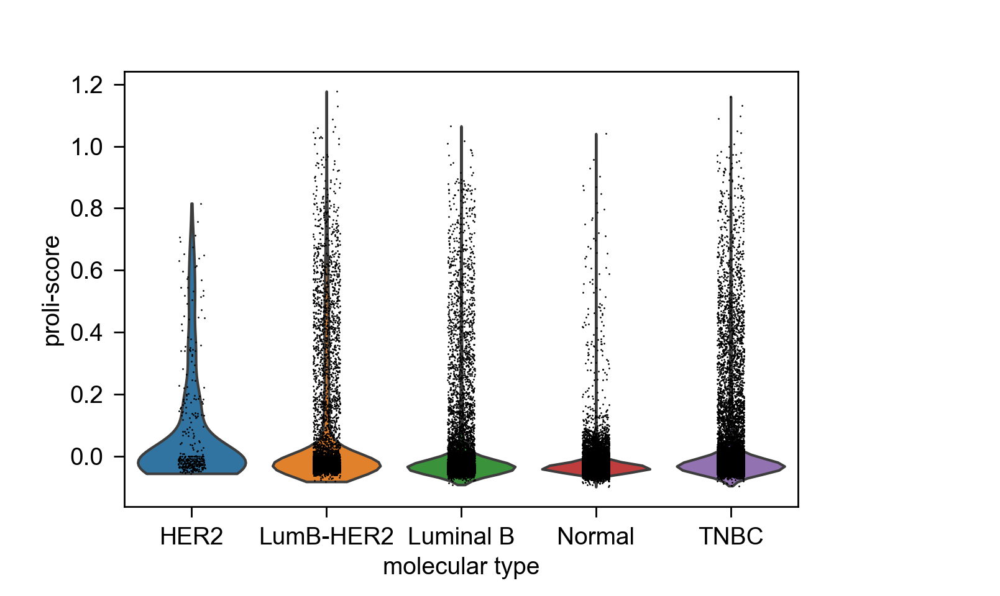

In [440]:
sc.pl.violin(adata_Fepi, keys='proli-score', groupby='molecular_type')

In [422]:
from sklearn.metrics import adjusted_rand_score, accuracy_score, normalized_mutual_info_score
perf = pd.DataFrame(index=['BCYType', 'PAM50', 'ScSubtype'])
for index in [accuracy_score, adjusted_rand_score, normalized_mutual_info_score]:
  score = [index(adata_Fepi.obs['molecular_type'], adata_Fepi.obs[meth]) for meth in ['BCYType', 'PAM50', 'ScSubtype']]
  perf[index.__name__] = score
perf

,accuracy_score,adjusted_rand_score,normalized_mutual_info_score
BCYType,0.824610,0.614573,0.585122
PAM50,0.256587,0.192796,0.218494
ScSubtype,0.301533,0.026778,0.074679


In [366]:
# random forest model using 2021 genes
Xtrain, Xtest, Ytrain, Ytest=train_test_split(agg_Fepi[:, bcy_genes].X,agg_Fepi.obs['molecular_type'],test_size=0.3)
clf = DecisionTreeClassifier(random_state=0) 
rfc = RandomForestClassifier(random_state=0) 
clf = clf.fit(Xtrain,Ytrain)
rfc = rfc.fit(Xtrain,Ytrain)
score_c = clf.score(Xtest,Ytest)
score_r = rfc.score(Xtest,Ytest)
print("Single Tree:{}".format(score_c) ,"Random Forest:{}".format(score_r) )

Single Tree:0.5 Random Forest:0.6666666666666666


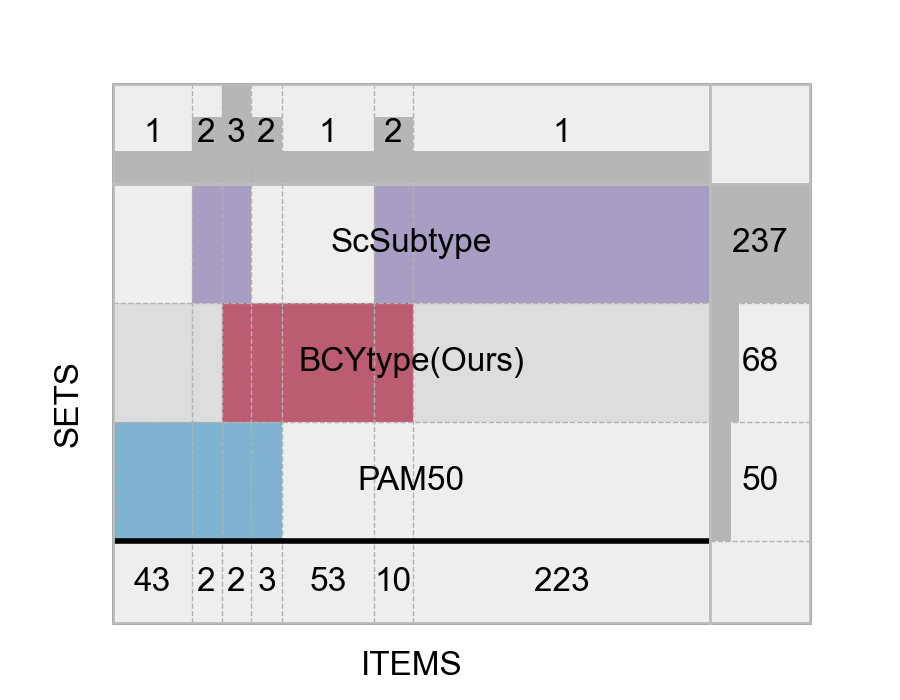

In [348]:
# draw venn
sets = [set(bcy_genes), set(wu_genes), set(pam50_genes)]
labels = ['BCYtype(Ours)', 'ScSubtype', 'PAM50']
fig, ax = plt.subplots(figsize=(4.5, 3.5))
with plt.style.context('bmh'):
  supervenn(sets, labels, widths_minmax_ratio=0.1, ax=ax,sets_ordering='minimize gaps', col_annotations_area_height=0.8,side_plot_width=0.5)
fig.savefig(f"{figpath}/supervenn.svg", bbox_inches='tight')

In [ ]:
# GO Enrichment of LumBHer2 Markers
LumBHer2_cc = gp.enrichr(LumBHer2_list,
                    gene_sets='GO_Cellular_Component_2023',
                    outdir=None)
LumBHer2_bp = gp.enrichr(LumBHer2_list,
                    gene_sets='GO_Biological_Process_2023',
                    outdir=None)
LumBHer2_mf = gp.enrichr(LumBHer2_list,
                    gene_sets='GO_Molecular_Function_2023',
                    outdir=None)


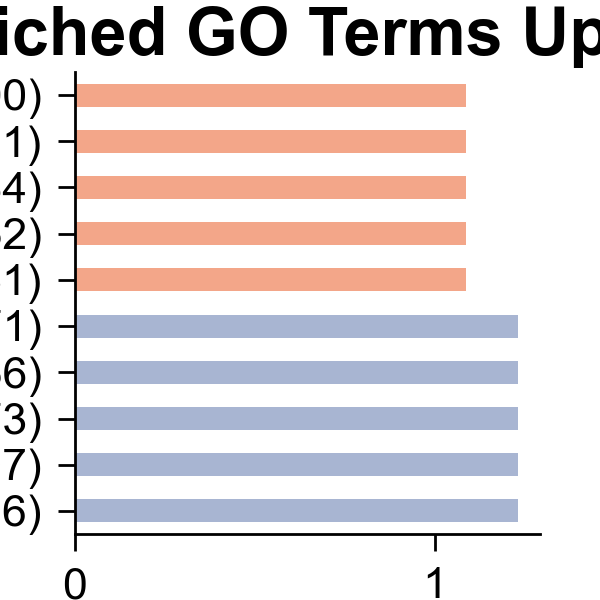

In [344]:
go_res = pd.concat([LumBHer2_cc.res2d.head(5), LumBHer2_bp.res2d.head(5), LumBHer2_mf.res2d.head(5)])
ax = gp.barplot(go_res, figsize=(3,3),
                group ='Gene_set',
                cutoff=0.1,
                top_term=15,
                color = ['#8b9cc4', '#f08961', '#62bb9f'],
                title ="The Most Enriched GO Terms Up in LumBHer2")
ax.figure.savefig(f"{figpath}/GO_LumBHer2.png", bbox_inches='tight', dpi=300)

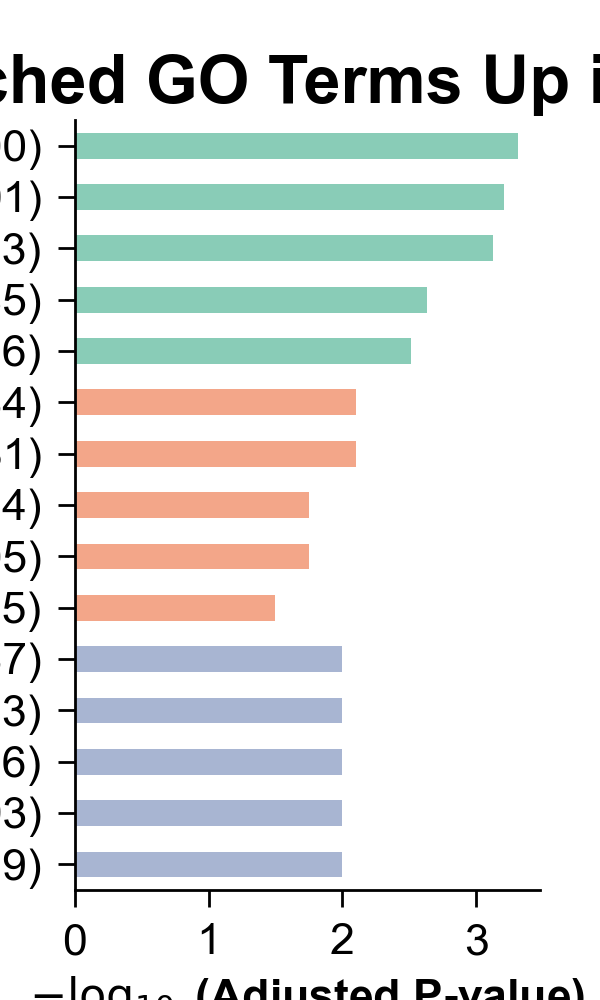

In [346]:
# GO Enrichment of BCY-epi Markers
figpath = 'figure-6.13/'
bcy_cc = gp.enrichr(bcy_genes,
                    gene_sets='GO_Cellular_Component_2023',
                    outdir=None)
bcy_bp = gp.enrichr(bcy_genes,
                    gene_sets='GO_Biological_Process_2023',
                    outdir=None)
bcy_mf = gp.enrichr(bcy_genes,
                    gene_sets='GO_Molecular_Function_2023',
                    outdir=None)

go_res = pd.concat([bcy_cc.res2d.head(5), bcy_bp.res2d.head(5), bcy_mf.res2d.head(5)])
ax = gp.barplot(go_res, figsize=(3,5),
                group ='Gene_set',
                cutoff=0.05,
                top_term=15,
                color = ['#8b9cc4', '#f08961', '#62bb9f'],
                title ="The Most Enriched GO Terms Up in BCY markers")
ax.figure.savefig(f"{figpath}/GO_BCY_genes.png", bbox_inches='tight', dpi=300)

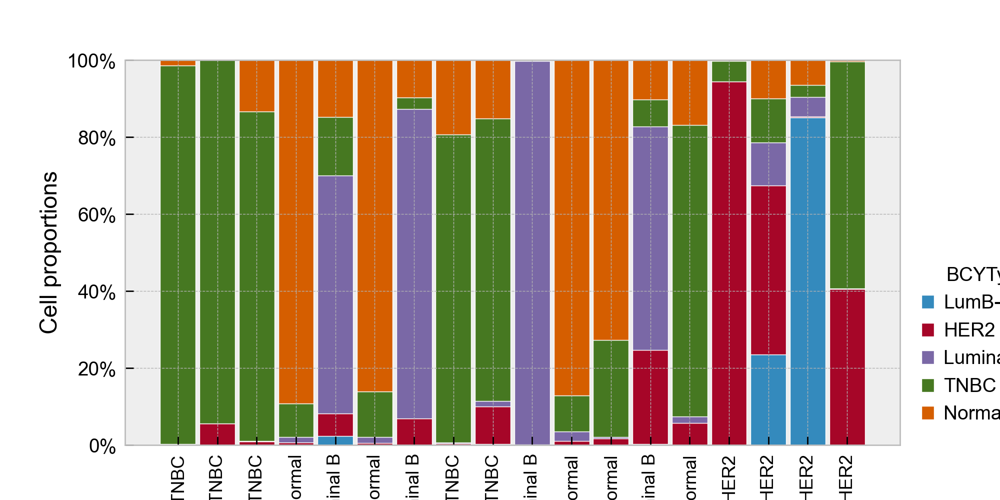

In [438]:
# proportions of BCYType in each batch
subtypes = ['LumB-HER2', 'HER2', 'Luminal B', 'TNBC', 'Normal']
barlabels = adata_Fepi.obs["batch_mol"].unique()
age_df = pd.DataFrame(columns = list(subtypes))
for bar in barlabels:
    d1 = pd.DataFrame([len(adata_Fepi[(adata_Fepi.obs['BCYType'] == ct) & (adata_Fepi.obs["batch_mol"] == bar)]) for ct in list(subtypes)], index = list(subtypes), columns=[bar]).T
    age_df = pd.concat([age_df, d1])
with plt.style.context('bmh'):
    fig, ax = plt.subplots(figsize=(10,5))
    propPlot(age_df, ax, title="BCYType")
    fig.savefig(f"{figpath}/BCYType_props.svg", bbox_inches='tight')

In [ ]:
from sklearn.model_selection import cross_val_score 
import matplotlib.pyplot as plt
rfc = RandomForestClassifier(n_estimators=25)
rfc_s = cross_val_score(rfc,adata_rf.X,adata_rf.obs['molecular_type'],cv=10)
clf = DecisionTreeClassifier()
clf_s = cross_val_score(clf,adata_rf.X,adata_rf.obs['molecular_type'],cv=10)
plt.plot(range(1,11),rfc_s,label = "RandomForest")
plt.plot(range(1,11),clf_s,label = "Decision Tree") 
plt.legend()
plt.show()

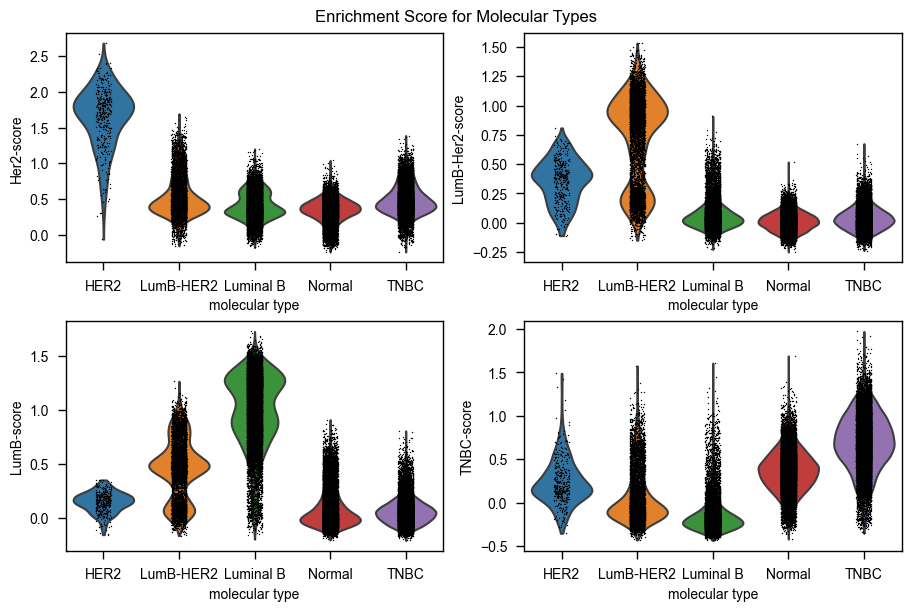

In [140]:
fig, ax = plt.subplots(2,2, figsize=(9,6), constrained_layout=True)
sc.pl.violin(adata_Fepi, groupby="molecular_type", keys='Her2-score',ax=ax[0][0], show=False)
sc.pl.violin(adata_Fepi, groupby="molecular_type", keys='LumB-Her2-score',ax=ax[0][1], show=False)
sc.pl.violin(adata_Fepi, groupby="molecular_type", keys='LumB-score',ax=ax[1][0], show=False)
sc.pl.violin(adata_Fepi, groupby="molecular_type", keys='TNBC-score',ax=ax[1][1], show=False)
fig.suptitle("Enrichment Score for Molecular Types")
fig.savefig(f"{folder}/score-mole.png", dpi=500)

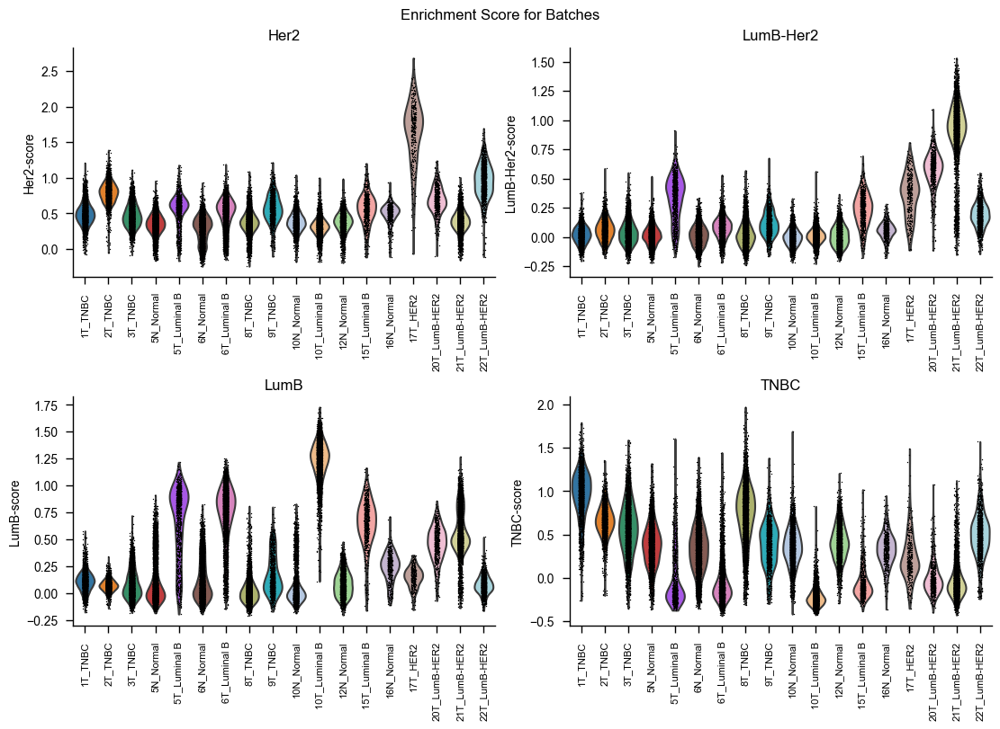

In [141]:
fig, ax = plt.subplots(2,2, figsize=(11,8), constrained_layout=True)
adata_Fepi.obs['batch_mol'] = [f"{x}_{y}" for x, y in zip(adata_Fepi.obs['batch'], adata_Fepi.obs['molecular_type'])]
by = 'batch_mol'
for i, x in enumerate(['Her2-score', 'LumB-Her2-score', 'LumB-score', 'TNBC-score']):
  sc.pl.violin(adata_Fepi, groupby=by, keys=x,ax=ax[int(i/2)][i%2], show=False)
  ax[int(i/2)][i%2].set_title(x.replace('-score', ''))
  ax[int(i/2)][i%2].spines.top.set_visible(False)
  ax[int(i/2)][i%2].spines.right.set_visible(False)
  xticks = ax[int(i/2)][i%2].get_xticklabels()
  ax[int(i/2)][i%2].set_xlabel('')
  ax[int(i/2)][i%2].set_xticklabels(xticks, rotation=90, fontsize=8)
fig.suptitle("Enrichment Score for Batches")
fig.savefig(f"{folder}/score-batch.png", dpi=500)

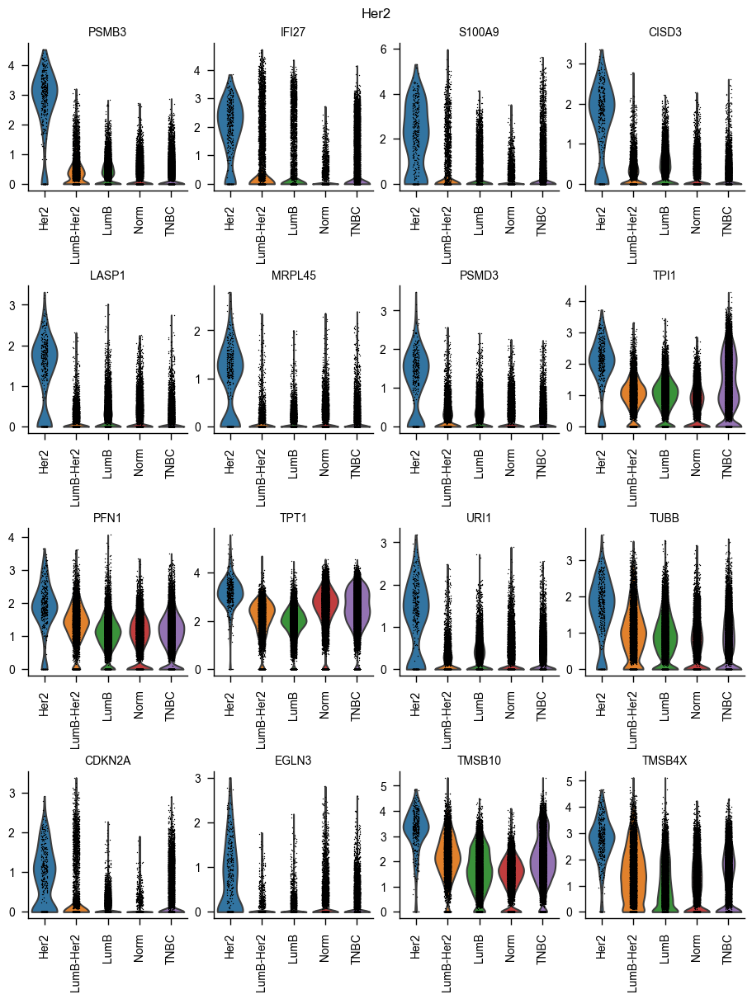

In [121]:
folder="figure-5.21"
markers = ['PSMB3', 'IFI27', 'S100A9', 'CISD3',"LASP1", 'MRPL45', 'PSMD3', 'TPI1', 'PFN1', 'TPT1', 'URI1', 'TUBB', "CDKN2A",'EGLN3','TMSB10', 'TMSB4X']
fig, ax = plt.subplots(4,4,figsize=(9,12), constrained_layout=True)
for i, m in enumerate(markers):
  col = 4
  sc.pl.violin(adata_Fepi, groupby='molecular_type',keys=m, ax=ax[int(i/col)][i%col], show=False)
  # ax[int(i/3)][i%3].legend_.remove()
  ax[int(i/col)][i%col].spines.top.set_visible(False)
  ax[int(i/col)][i%col].spines.right.set_visible(False)
  ax[int(i/col)][i%col].set_xlabel("")
  ax[int(i/col)][i%col].set_ylabel("")
  ax[int(i/col)][i%col].set_title(m, fontsize=10)
  ax[int(i/col)][i%col].set_xticklabels(["Her2", "LumB-Her2", "LumB", "Norm", "TNBC"], fontsize=10, rotation=90)
# sc.pl.umap(adata0, color='batch', ax=ax[1][3], show=False)
fig.suptitle("Her2", fontsize=12)
fig.savefig(f"{folder}/Her2.png", dpi=500)

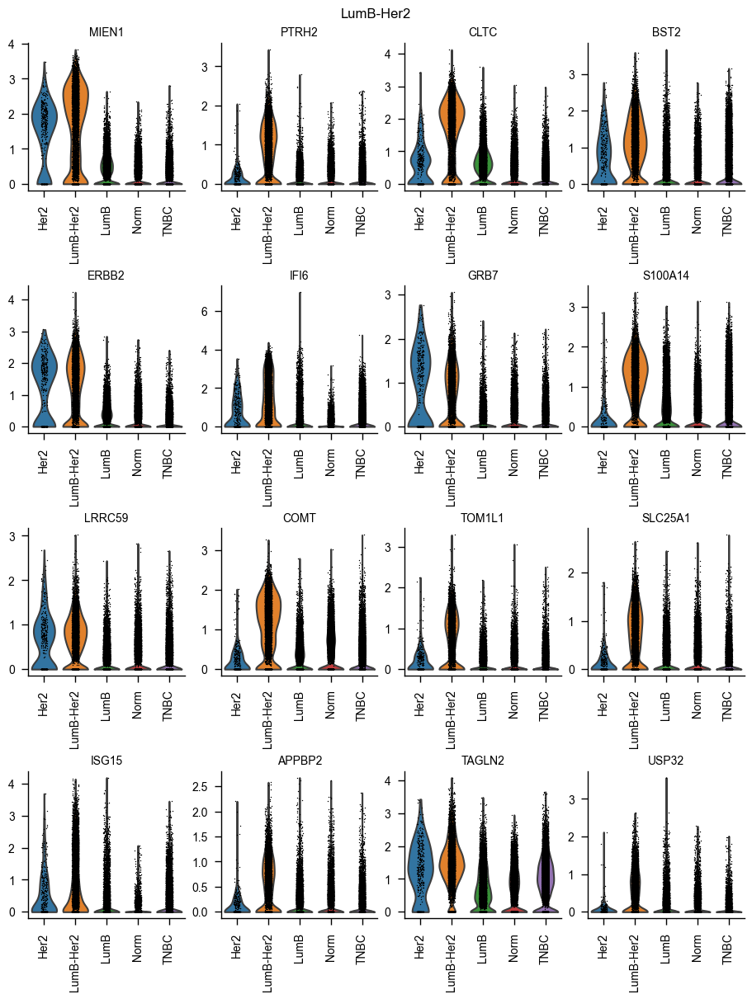

In [117]:
folder="figure-5.21"
markers = ['MIEN1', 'PTRH2', 'CLTC', 'BST2',"ERBB2", 'IFI6', 'GRB7', 'S100A14', 'LRRC59', 'COMT', 'TOM1L1', 'SLC25A1', "ISG15",'APPBP2','TAGLN2', 'USP32']
fig, ax = plt.subplots(4,4,figsize=(9,12), constrained_layout=True)
for i, m in enumerate(markers):
  col = 4
  sc.pl.violin(adata_Fepi, groupby='molecular_type',keys=m, ax=ax[int(i/col)][i%col], show=False)
  # ax[int(i/3)][i%3].legend_.remove()
  ax[int(i/col)][i%col].spines.top.set_visible(False)
  ax[int(i/col)][i%col].spines.right.set_visible(False)
  ax[int(i/col)][i%col].set_xlabel("")
  ax[int(i/col)][i%col].set_ylabel("")
  ax[int(i/col)][i%col].set_title(m, fontsize=10)
  ax[int(i/col)][i%col].set_xticklabels(["Her2", "LumB-Her2", "LumB", "Norm", "TNBC"], fontsize=10, rotation=90)
# sc.pl.umap(adata0, color='batch', ax=ax[1][3], show=False)
fig.suptitle("LumB-Her2", fontsize=12)
fig.savefig(f"{folder}/LumB-Her2.png", dpi=500)

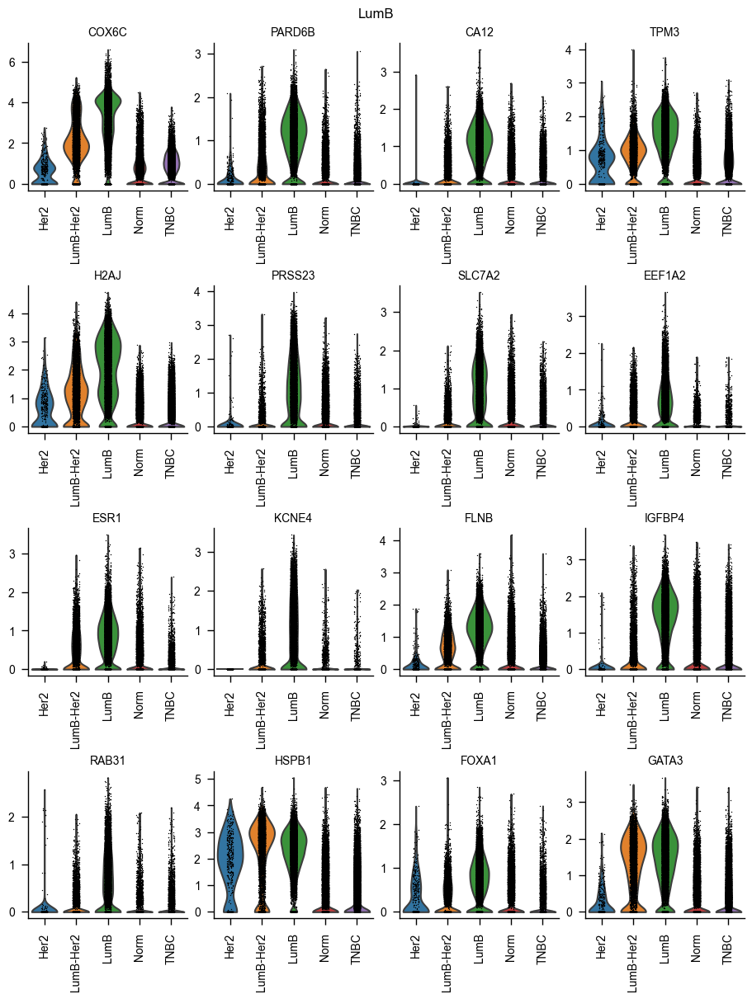

In [112]:
folder="figure-5.21"
markers = ['COX6C', 'PARD6B', 'CA12', 'TPM3',"H2AJ", 'PRSS23', 'SLC7A2', 'EEF1A2', 'ESR1', 'KCNE4', 'FLNB', 'IGFBP4', "RAB31",'HSPB1','FOXA1', 'GATA3']
fig, ax = plt.subplots(4,4,figsize=(9,12), constrained_layout=True)
for i, m in enumerate(markers):
  col = 4
  sc.pl.violin(adata_Fepi, groupby='molecular_type',keys=m, ax=ax[int(i/col)][i%col], show=False)
  # ax[int(i/3)][i%3].legend_.remove()
  ax[int(i/col)][i%col].spines.top.set_visible(False)
  ax[int(i/col)][i%col].spines.right.set_visible(False)
  ax[int(i/col)][i%col].set_xlabel("")
  ax[int(i/col)][i%col].set_ylabel("")
  ax[int(i/col)][i%col].set_title(m, fontsize=10)
  ax[int(i/col)][i%col].set_xticklabels(["Her2", "LumB-Her2", "LumB", "Norm", "TNBC"], fontsize=10, rotation=90)
# sc.pl.umap(adata0, color='batch', ax=ax[1][3], show=False)
fig.suptitle("LumB", fontsize=12)
fig.savefig(f"{folder}/LumB.png", dpi=500)

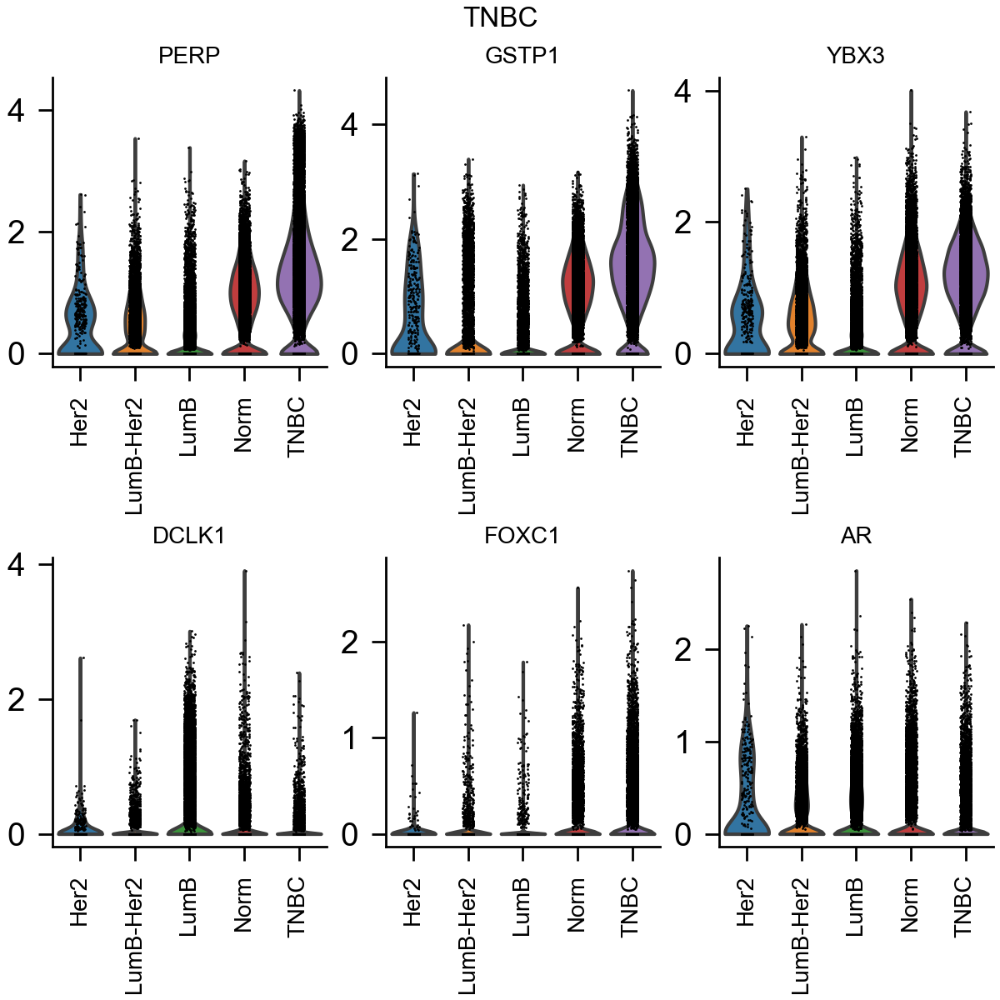

In [296]:
folder="figure-6.5"
markers = ['PERP', 'GSTP1', 'YBX3', 'DCLK1',"FOXC1", 'AR']
fig, ax = plt.subplots(2,3,figsize=(6,6), constrained_layout=True)
for i, m in enumerate(markers):
  sc.pl.violin(adata_Fepi, groupby='molecular_type',keys=m, ax=ax[int(i/3)][i%3], show=False)
  # ax[int(i/3)][i%3].legend_.remove()
  ax[int(i/3)][i%3].spines.top.set_visible(False)
  ax[int(i/3)][i%3].spines.right.set_visible(False)
  ax[int(i/3)][i%3].set_xlabel("")
  ax[int(i/3)][i%3].set_ylabel("")
  ax[int(i/3)][i%3].set_title(m, fontsize=10)
  ax[int(i/3)][i%3].set_xticklabels(["Her2", "LumB-Her2", "LumB", "Norm", "TNBC"], fontsize=10, rotation=90)
# sc.pl.umap(adata0, color='batch', ax=ax[1][3], show=False)
fig.suptitle("TNBC", fontsize=12)
fig.savefig(f"{folder}/TNBC.png", dpi=500)

0
1
2
0
1
2


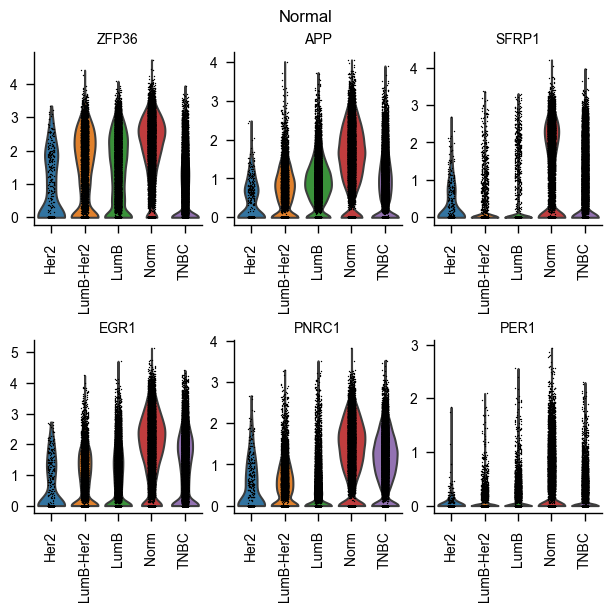

In [91]:
folder="figure-5.21"
markers = ['ZFP36', 'APP', 'SFRP1', 'EGR1', 'PNRC1', 'PER1']
fig, ax = plt.subplots(2,3,figsize=(6,6), constrained_layout=True)
for i, m in enumerate(markers):
  print(i%3)
  sc.pl.violin(adata_Fepi, groupby='molecular_type',keys=m, ax=ax[int(i/3)][i%3], show=False)
  # ax[int(i/3)][i%3].legend_.remove()
  ax[int(i/3)][i%3].spines.top.set_visible(False)
  ax[int(i/3)][i%3].spines.right.set_visible(False)
  ax[int(i/3)][i%3].set_xlabel("")
  ax[int(i/3)][i%3].set_ylabel("")
  ax[int(i/3)][i%3].set_title(m, fontsize=10)
  ax[int(i/3)][i%3].set_xticklabels(["Her2", "LumB-Her2", "LumB", "Norm", "TNBC"], fontsize=10, rotation=90)
# sc.pl.umap(adata0, color='batch', ax=ax[1][3], show=False)
fig.suptitle("Normal", fontsize=12)
fig.savefig(f"{folder}/Normal.png", dpi=500)

In [ ]:
folder="figure-5.21"
markers = ['B2M', 'APP', 'SFRP1', 'EGR1', 'PNRC1', 'PER1']
fig, ax = plt.subplots(2,3,figsize=(6,6), constrained_layout=True)
for i, m in enumerate(markers):
  print(i%3)
  sc.pl.violin(adata_Fepi, groupby='molecular_type',keys=m, ax=ax[int(i/3)][i%3], show=False)
  # ax[int(i/3)][i%3].legend_.remove()
  ax[int(i/3)][i%3].spines.top.set_visible(False)
  ax[int(i/3)][i%3].spines.right.set_visible(False)
  ax[int(i/3)][i%3].set_xlabel("")
  ax[int(i/3)][i%3].set_ylabel("")
  ax[int(i/3)][i%3].set_title(m, fontsize=10)
  ax[int(i/3)][i%3].set_xticklabels(["Her2", "LumB-Her2", "LumB", "Norm", "TNBC"], fontsize=10, rotation=90)
# sc.pl.umap(adata0, color='batch', ax=ax[1][3], show=False)
fig.suptitle("Normal", fontsize=12)
fig.savefig(f"{folder}/Normal.png", dpi=500)

In [161]:
adata_Fepi.write_h5ad("adata-Fepi2.h5ad")

In [162]:
adata_FFib = sc.read_h5ad("adata-FFib.h5ad")
adata_FFib

AnnData object with n_obs × n_vars = 37345 × 41733
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'leiden-Fib', 'Fib-type'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Fib-type_colors', 'batch_colors', 'dendrogram_Fib-type', 'dendrogram_leiden', 'gender_colors', 'hvg', 'leiden', 'leiden-Fib_colors', 'leiden-harmony-female_colors', 'leiden_colors', 'leiden_harmony_colors', 'log1p', 'majorType-Female_colors', 'major_type_colors', 'major_type_harmony_colors', 'minor-type_colors', 'minor_type_colors', 'molecular_type_color

In [166]:
adata_FFib.obs['molecular_type'] = list(adata_FFib.obs['molecular_type'])
adata_FFib.obs.loc[adata_FFib.obs['batch'].isin(["20T", '21T', '22T']),'molecular_type'] = 'LumB-HER2'
adata_FFib.obs.loc[adata_FFib.obs['batch'].isin(['17T']),'molecular_type'] = 'HER2'
adata_FFib.obs['molecular_type']

barcodes
AAACCCATCGGAATTC-1-1T          TNBC
AAACGAATCCATAGAC-1-1T          TNBC
AAAGAACAGACGACGT-1-1T          TNBC
AAATGGAAGTCGCTAT-1-1T          TNBC
AAATGGATCAAGGTGG-1-1T          TNBC
                            ...    
TTCCCAGGTCGGCACT-1-22T    LumB-HER2
TTCTACAGTAAGGGAA-1-22T    LumB-HER2
TTCTCCTTCCTGTACC-1-22T    LumB-HER2
TTCTCCTTCTTATCTG-1-22T    LumB-HER2
TTTGTCACAGACGCCT-1-22T    LumB-HER2
Name: molecular_type, Length: 37345, dtype: object

In [172]:
adata_FFib.obs['sample'] = adata_FFib.obs['batch']
adata_Fepi.obs['sample'] = adata_Fepi.obs['batch']
adata_Fepi.obs['epi-type'] = [f"{s.split(' ')[0]} {s.split(' ')[-1]}" for s in adata_Fepi.obs['epi-subtype']]
adata_Fepi.obs['cptype'] = adata_Fepi.obs['epi-type']
adata_FFib.obs['cptype'] = adata_FFib.obs['Fib-type']
adata_F = adata_Fepi.concatenate(adata_FFib)
adata_F.obs['batch']

barcodes
AAACCCAAGACCAAGC-1-1T-0     0
AAACCCATCACTTTGT-1-1T-0     0
AAACGAAAGCGGATCA-1-1T-0     0
AAACGAACACAGTGTT-1-1T-0     0
AAACGCTCAAGCAATA-1-1T-0     0
                           ..
TTCCCAGGTCGGCACT-1-22T-1    1
TTCTACAGTAAGGGAA-1-22T-1    1
TTCTCCTTCCTGTACC-1-22T-1    1
TTCTCCTTCTTATCTG-1-22T-1    1
TTTGTCACAGACGCCT-1-22T-1    1
Name: batch, Length: 90364, dtype: category
Categories (2, object): ['0', '1']

In [175]:
adata_F.write_h5ad("adata-Fepi-fib.h5ad")

In [176]:

meta = pd.DataFrame(adata_F.obs['cptype'].copy())
meta = meta.reset_index()
meta.columns=['Cell', 'cell_type']
meta.to_csv("meta.txt", sep='\t', index=False)
cpdb_res_em = cpdb_statistical_analysis_method.call(
  cpdb_file_path="cellphonedb.zip",
  meta_file_path="meta.txt",
  counts_file_path="adata-Fepi-fib.h5ad",
  counts_data='hgnc_symbol',
  output_path="cpdb",
  threads=16,
)


Reading user files...
The following user files were loaded successfully:
adata-Fepi-fib.h5ad
meta.txt
[ ][CORE][05/06/24-07:42:00][INFO] [Cluster Statistical Analysis] Threshold:0.1 Iterations:1000 Debug-seed:-1 Threads:16 Precision:3
[ ][CORE][05/06/24-07:42:08][INFO] Running Real Analysis
[ ][CORE][05/06/24-07:42:08][INFO] Running Statistical Analysis


100%|██████████| 1000/1000 [22:19<00:00,  1.34s/it]


[ ][CORE][05/06/24-08:04:33][INFO] Building Pvalues result
[ ][CORE][05/06/24-08:04:34][INFO] Building results
Saved deconvoluted to cpdb/statistical_analysis_deconvoluted_06_05_2024_080435.txt
Saved deconvoluted_percents to cpdb/statistical_analysis_deconvoluted_percents_06_05_2024_080435.txt
Saved means to cpdb/statistical_analysis_means_06_05_2024_080435.txt
Saved pvalues to cpdb/statistical_analysis_pvalues_06_05_2024_080435.txt
Saved significant_means to cpdb/statistical_analysis_significant_means_06_05_2024_080435.txt


NameError: name 'cpdb_res' is not defined

In [177]:
adata_F.uns['CellphoneDB'] = cpdb_res_em
adata_F

AnnData object with n_obs × n_vars = 90364 × 26956
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'leiden-epi-harmony', 'cnv_status', 'cnv_score', 'epi-subtype', 'cnv_leiden', 'LumB-HER2', 'LumB', 'LumB-Her2-score', 'Her2-score', 'LumB-score', 'TNBC-score', 'batch_mol', 'LumB-old-score', 'Her2-old-score', 'epi-type', 'cptype', 'sample', 'leiden-Fib', 'Fib-type'
    var: 'highly_variable', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'symbol-0', 'ensg-0', 'chromosome-0', 'start-0', 'end-0', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1'

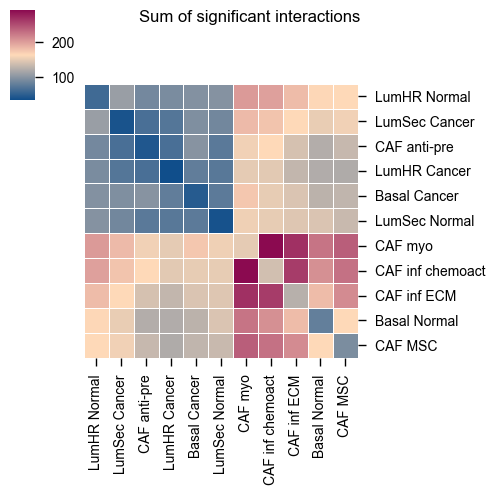

In [178]:
ax = kpy.plot_cpdb_heatmap(pvals=cpdb_res_em['pvalues'], degs_analysis=False, figsize=(5, 5), title="Sum of significant interactions")

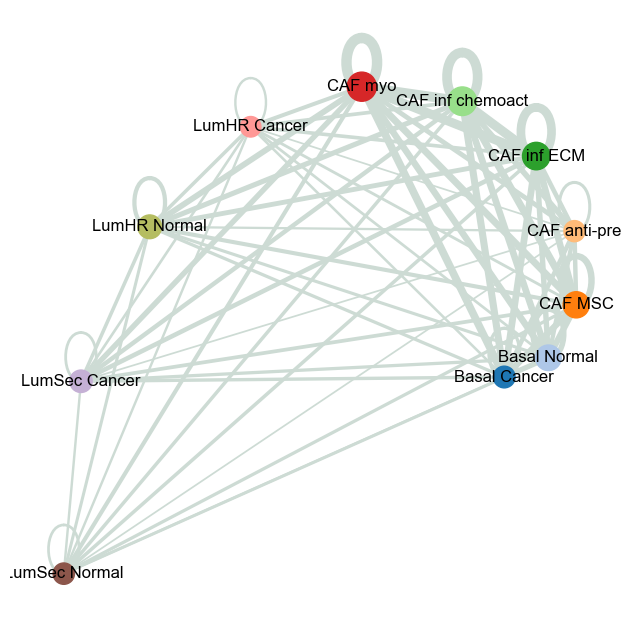

In [188]:
import ktplotspy as kpy
figpath = 'figure-6.5'
ax = kpy.plot_cpdb_heatmap(pvals=cpdb_res_em['pvalues'], degs_analysis=False, figsize=(5, 5), title="Sum of significant interactions", return_tables=True)
import networkx as nx
from matplotlib import cm, colors
vega_10 = list(map(colors.to_hex, cm.tab20.colors))
vega_10_scanpy = vega_10.copy()
# vega_10_scanpy[3] = '#ad494a'
# vega_10_scanpy[2] = '#279e68'  # green
# vega_10_scanpy[4] = '#aa40fc'  # purple
vega_10_scanpy[8] = '#b5bd61'  # kakhi
G = nx.from_pandas_edgelist(ax['interaction_edges'],
                            source='SOURCE',
                            target='TARGET',
                            edge_attr=['COUNT'])
fig, ax0 = plt.subplots(figsize=(8, 8))

pos=nx.layout.spiral_layout(G)
#node_size = nx.get_node_attributes()
# draw node
nx.draw_networkx_nodes(G,
                       pos=pos,
                       cmap=plt.cm.RdYlBu,
                       node_color=vega_10_scanpy[:11],
                       node_size=list(np.array(ax['interaction_count']['total_interactions'])/5))
edge_weight = nx.get_edge_attributes(G, 'COUNT').values()
nx.draw_networkx_labels(G,
                        pos=pos,
                        labels=dict(zip(ax['interaction_count']['total_interactions'].index, ax['interaction_count']['total_interactions'].index)))
nx.draw_networkx_edges(G,
                       pos=pos,
                       width=list(map(lambda x: x/20, edge_weight)),
                       edge_color='#CDDBD4')
plt.axis('off')
plt.savefig(f'{figpath}/cpdb_network.svg', bbox_inches='tight')

In [194]:
ax = kpy.plot_cpdb(
  adata=adata_F,
  cell_type1="Basal Normal|Basal Cancer",
  cell_type2='CAF myo|CAF inf chemoact|CAF inf ECM|CAF MSC|CAF anti-pre',
  means=cpdb_res_em['means'],
  pvals=cpdb_res_em['pvalues'],
  celltype_key='cptype',
  max_size=4,
  max_highlight_size=1,
  highlight_size=0.75,
  degs_analysis=False,
  standard_scale=True,
  figsize=(8,25),
)
ax.save(f'{figpath}/cpdb_Basal_CAF.png', dpi=300)

In [203]:
ax = kpy.plot_cpdb(
  adata=adata_F,
  cell_type1="LumHR Normal|LumHR Cancer",
  cell_type2='CAF myo|CAF inf chemoact|CAF inf ECM|CAF MSC|CAF anti-pre',
  means=cpdb_res_em['means'],
  pvals=cpdb_res_em['pvalues'],
  celltype_key='cptype',
  max_size=4,
  max_highlight_size=1,
  highlight_size=0.75,
  degs_analysis=False,
  standard_scale=True,
  figsize=(8,25),
)
ax.save(f'{figpath}/cpdb_LumHR_CAF.png', dpi=300)

In [200]:
ax = kpy.plot_cpdb(
  adata=adata_F,
  cell_type1='CAF myo|CAF inf chemoact|CAF inf ECM|CAF MSC|CAF anti-pre',
  cell_type2="LumHR Normal|LumHR Cancer",
  means=cpdb_res_em['means'],
  pvals=cpdb_res_em['pvalues'],
  celltype_key='cptype',
  max_size=4,
  genes=['APP', "AGRN", 'TNFSF10','TGFB1', 'TGFB2', 'TGFB3', 'VEGFB', 'VEGFA'],
  max_highlight_size=1,
  highlight_size=0.75,
  degs_analysis=False,
  standard_scale=True,
  figsize=(8,7),
)
ax.save(f'{figpath}/cpdb_LumHR_cancer_CAF.png', dpi=300)

In [450]:
# concat Fmye and Ffib
adata_Fmye = sc.read_h5ad("adata-Fmye.h5ad")
adata_Fmye.obs['batch'] = adata_Fmye.obs['sample']
adata_Fmye.obs['molecular_type'] = list(adata_Fmye.obs['molecular_type'])
adata_Fmye.obs.loc[adata_Fmye.obs['batch'].isin(["20T", '21T', '22T']),'molecular_type'] = 'LumB-HER2'
adata_Fmye.obs.loc[adata_Fmye.obs['batch'].isin(['17T']),'molecular_type'] = 'HER2'
adata_Fmye.obs['molecular_type'] 

AAACCCAGTAAGGCCA-1-1T          TNBC
AAAGAACTCGCACGGT-1-1T          TNBC
AACAAGATCCCTTCCC-1-1T          TNBC
AACAGGGTCGACCCAG-1-1T          TNBC
AACCATGAGTCGCGAA-1-1T          TNBC
                            ...    
TCTGAGAAGTTAACGA-1-22T    LumB-HER2
TGCCCTACACCTCGTT-1-22T    LumB-HER2
TGGTTCCGTCAGTGGA-1-22T    LumB-HER2
TGTGGTACAACCGCCA-1-22T    LumB-HER2
TTATGCTGTAGCCTCG-1-22T    LumB-HER2
Name: molecular_type, Length: 16525, dtype: object

In [454]:
adata_FFib

AnnData object with n_obs × n_vars = 37345 × 41733
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'leiden-Fib', 'Fib-type', 'sample', 'cptype'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Fib-type_colors', 'batch_colors', 'dendrogram_Fib-type', 'dendrogram_leiden', 'gender_colors', 'hvg', 'leiden', 'leiden-Fib_colors', 'leiden-harmony-female_colors', 'leiden_colors', 'leiden_harmony_colors', 'log1p', 'majorType-Female_colors', 'major_type_colors', 'major_type_harmony_colors', 'minor-type_colors', 'minor_type_colors', '

In [453]:
adata_Fmye.obs['cptype'] = adata_Fmye.obs['Mye-type']
adata_FFib.obs['cptype'] = adata_FFib.obs['Fib-type']
adata_F = adata_Fmye.concatenate(adata_FFib)
adata_F.obs['cptype']

AAACCCAGTAAGGCCA-1-1T-0            Macro IFN
AAAGAACTCGCACGGT-1-1T-0            Macro IFN
AACAAGATCCCTTCCC-1-1T-0             Macro M1
AACAGGGTCGACCCAG-1-1T-0             Monocyte
AACCATGAGTCGCGAA-1-1T-0            Macro IFN
                                  ...       
TTCCCAGGTCGGCACT-1-22T-1        CAF anti-pre
TTCTACAGTAAGGGAA-1-22T-1             CAF myo
TTCTCCTTCCTGTACC-1-22T-1    CAF inf chemoact
TTCTCCTTCTTATCTG-1-22T-1         CAF inf ECM
TTTGTCACAGACGCCT-1-22T-1             CAF myo
Name: cptype, Length: 53870, dtype: category
Categories (17, object): ['CAF MSC', 'CAF anti-pre', 'CAF inf ECM', 'CAF inf chemoact', ..., 'cDC2', 'cDC2 CD1A+', 'mDC', 'pDC']

In [455]:
adata_F.write_h5ad("adata-Ffib-mye.h5ad")

In [456]:
meta = pd.DataFrame(adata_F.obs['cptype'].copy())
meta = meta.reset_index()
meta.columns=['Cell', 'cell_type']
meta.to_csv("meta.txt", sep='\t', index=False)
cpdb_res_em = cpdb_statistical_analysis_method.call(
  cpdb_file_path="cellphonedb.zip",
  meta_file_path="meta.txt",
  counts_file_path="adata-Ffib-mye.h5ad",
  counts_data='hgnc_symbol',
  output_path="cpdb",
  threads=16,
)

Reading user files...
The following user files were loaded successfully:
adata-Ffib-mye.h5ad
meta.txt
[ ][CORE][18/06/24-07:28:57][INFO] [Cluster Statistical Analysis] Threshold:0.1 Iterations:1000 Debug-seed:-1 Threads:16 Precision:3
[ ][CORE][18/06/24-07:29:01][INFO] Running Real Analysis
[ ][CORE][18/06/24-07:29:01][INFO] Running Statistical Analysis


100%|██████████| 1000/1000 [16:05<00:00,  1.04it/s]


[ ][CORE][18/06/24-07:45:11][INFO] Building Pvalues result
[ ][CORE][18/06/24-07:45:12][INFO] Building results
Saved deconvoluted to cpdb/statistical_analysis_deconvoluted_06_18_2024_074512.txt
Saved deconvoluted_percents to cpdb/statistical_analysis_deconvoluted_percents_06_18_2024_074512.txt
Saved means to cpdb/statistical_analysis_means_06_18_2024_074512.txt
Saved pvalues to cpdb/statistical_analysis_pvalues_06_18_2024_074512.txt
Saved significant_means to cpdb/statistical_analysis_significant_means_06_18_2024_074512.txt


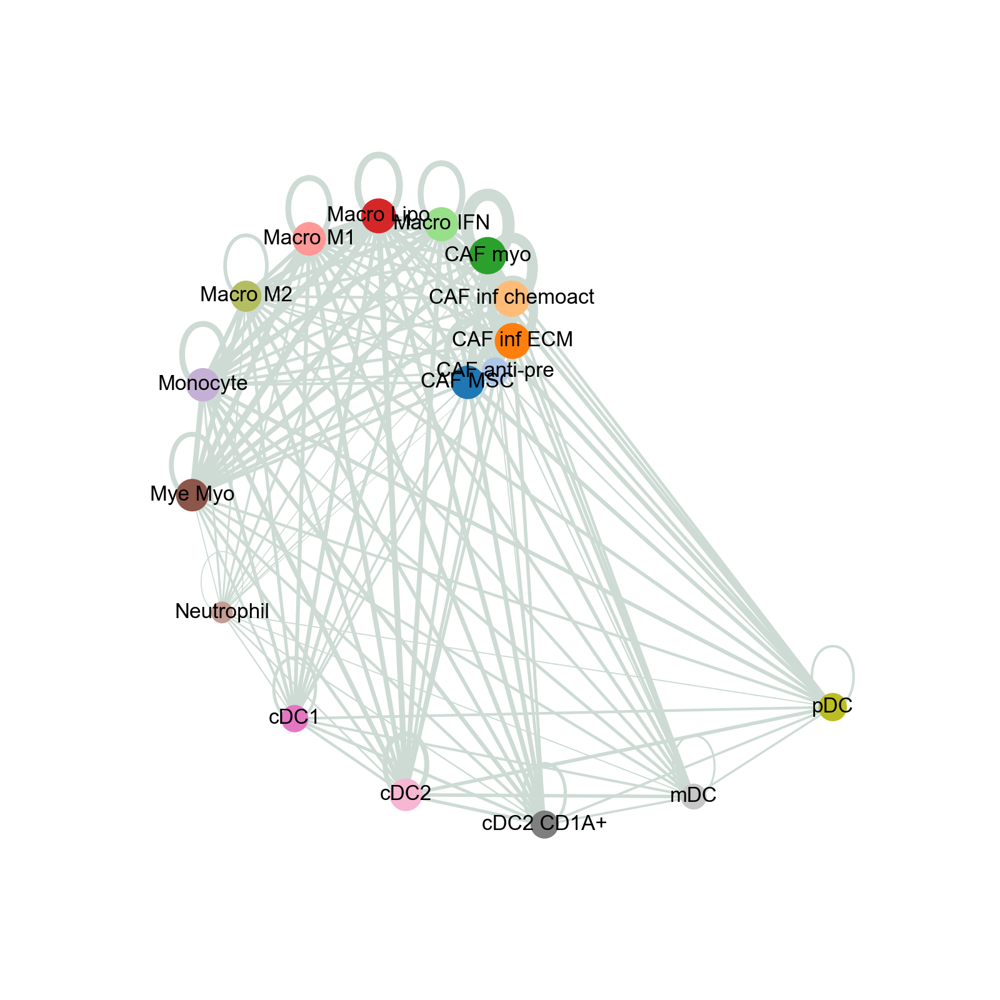

In [458]:
import ktplotspy as kpy
figpath = 'figure-6.5'
ax = kpy.plot_cpdb_heatmap(pvals=cpdb_res_em['pvalues'], degs_analysis=False, figsize=(5, 5), title="Sum of significant interactions", return_tables=True)
import networkx as nx
from matplotlib import cm, colors
vega_10 = list(map(colors.to_hex, cm.tab20.colors))
vega_10_scanpy = vega_10.copy()
# vega_10_scanpy[3] = '#ad494a'
# vega_10_scanpy[2] = '#279e68'  # green
# vega_10_scanpy[4] = '#aa40fc'  # purple
vega_10_scanpy[8] = '#b5bd61'  # kakhi
G = nx.from_pandas_edgelist(ax['interaction_edges'],
                            source='SOURCE',
                            target='TARGET',
                            edge_attr=['COUNT'])
fig, ax0 = plt.subplots(figsize=(8, 8))

pos=nx.layout.spiral_layout(G)
#node_size = nx.get_node_attributes()
# draw node
nx.draw_networkx_nodes(G,
                       pos=pos,
                       cmap=plt.cm.RdYlBu,
                       node_color=vega_10_scanpy[:17],
                       node_size=list(np.array(ax['interaction_count']['total_interactions'])/5))
edge_weight = nx.get_edge_attributes(G, 'COUNT').values()
nx.draw_networkx_labels(G,
                        pos=pos,
                        labels=dict(zip(ax['interaction_count']['total_interactions'].index, ax['interaction_count']['total_interactions'].index)))
nx.draw_networkx_edges(G,
                       pos=pos,
                       width=list(map(lambda x: x/20, edge_weight)),
                       edge_color='#CDDBD4')
plt.axis('off')
plt.savefig(f'{figpath}/cpdb_fib-mye-network.svg', bbox_inches='tight')

In [463]:
ax = kpy.plot_cpdb(
  adata=adata_F,
  cell_type1="cDC2|cDC2 CD1A+",
  cell_type2='CAF myo|CAF anti-pre',
  means=cpdb_res_em['means'],
  pvals=cpdb_res_em['pvalues'],
  celltype_key='cptype',
  max_size=4,
  genes=['NRP1','NRP2', 'TGFB1','SEMA4A', 'SEMA4D', 'EGFR','ERBB2','HLA-E', 'HLA-F', 'TNF', 'TNFSF10','TNFSF12', 'TNFSF14', 'SEMA7A', 'LTB', 'COL8A2', 'COL9A2'],
  max_highlight_size=1,
  highlight_size=0.75,
  degs_analysis=False,
  standard_scale=True,
  figsize=(8,8),
)
ax.save(f'{figpath}/cpdb_cDC2_CAF_sub.png', dpi=300)